# CNN
Experiments using CNN classifier to try and classify coughs as covid postive vs covid negative.

By settings random_state to some set value for both Mel Spectrogram and MFCC randomised search cross-val, we can ensure that both models have the same architecture. This allows for comparison between Mel Spectogram and MFCC for each model, whilst still enabling each model type to be compared.

## Installing Required Packages and Setting Random State

In [1]:
# standard imports
import pandas as pd
import numpy as np
import random
from matplotlib import pyplot as plt 
from scipy import stats
import os

# for creating representative sample of whole dataset
from sklearn.model_selection import StratifiedShuffleSplit, train_test_split, KFold
import imblearn
from imblearn.pipeline import Pipeline
from sklearn.utils import shuffle

# librosa and tensorflow for pre-processing and CNN
import librosa
import tensorflow as tf
from tensorflow import keras
from sklearn import preprocessing, model_selection

# visualisations
from sklearn.metrics import confusion_matrix, roc_auc_score, classification_report
from sklearn.metrics import precision_recall_curve, PrecisionRecallDisplay, roc_curve, RocCurveDisplay
import librosa.display
from matplotlib import pyplot as plt 
import seaborn as sns

In [2]:
# important definitions
parent_dir = os.path.dirname(os.getcwd())
random_state = 23

In [3]:
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 15826515726082436242
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 7105767015
locality {
  bus_id: 1
  links {
  }
}
incarnation: 2023302772598975659
physical_device_desc: "device: 0, name: GeForce GTX 1080, pci bus id: 0000:28:00.0, compute capability: 6.1"
]


## Sample Creation

In [4]:
# load metadata csv
metadata = pd.read_csv(f"{parent_dir}/coughvid-19/metadata_compiled.csv")

# select relevant columns for resampling later
metadata = metadata[['uuid', 'cough_detected', 'age', 'gender', 'respiratory_condition', 'fever_muscle_pain', 'status']]

# basic filtering
metadata = metadata[metadata['cough_detected'] >= 0.8]  # recommendation by dataset creators
metadata = metadata[metadata['status'] != 'symptomatic']  # no way of knowing whether symptomatic == covid positive or negative
metadata = metadata[metadata['status'].notna()] 
metadata.drop(columns=['cough_detected'], inplace=True) 

# fill in nulls with mean of stratum (only present in age column)
metadata["age"] = metadata.groupby(["gender", "respiratory_condition", "fever_muscle_pain"]).transform(lambda x: x.fillna(x.mean()))
# split age into bands for better stratified sampling
metadata.age = pd.cut(metadata.age, bins=10)

print("Class distribution before resampling")
print(metadata.status.value_counts())

metadata.head()

Class distribution before resampling
healthy     8300
COVID-19     699
Name: status, dtype: int64


C:\Users\danie\anaconda3\envs\ai_coursework_test\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Dropping invalid columns in DataFrameGroupBy.transform is deprecated. In a future version, a TypeError will be raised. Before calling .transform, select only columns which should be valid for the transforming function.
  


,uuid,age,gender,respiratory_condition,fever_muscle_pain,status
1,00039425-7f3a-42aa-ac13-834aaa2b6b92,"(10.8, 20.6]",male,False,False,healthy
3,0009eb28-d8be-4dc1-92bb-907e53bc5c7a,"(30.4, 40.2]",male,True,False,healthy
5,001328dc-ea5d-4847-9ccf-c5aa2a3f2d0f,"(20.6, 30.4]",male,False,False,healthy
10,0028b68c-aca4-4f4f-bb1d-cb4ed5bbd952,"(20.6, 30.4]",female,False,False,healthy
11,00291cce-36a0-4a29-9e2d-c1d96ca17242,"(10.8, 20.6]",male,False,False,healthy


In [5]:
# split out positive and negative records to ensure all positive records are kept for training and testing
metadata_pos = metadata[metadata['status']=='COVID-19']
metadata_neg = metadata[metadata['status']=='healthy']

metadata_pos = metadata_pos.reset_index().drop(columns='index')
metadata_neg = metadata_neg.reset_index().drop(columns='index')

In [6]:
X_neg = metadata_neg.drop(columns=['status', 'uuid'])
y_neg = metadata_neg.status

overall_sample_size = 2500  # balance between training time, and ensuring that resampling doesn't create bias
n_positive = len(metadata_pos)

# create smaller sample of original data set
sss = StratifiedShuffleSplit(n_splits=1, test_size=(2500-n_positive)/len(y_neg), random_state=random_state)
splits = sss.split(X_neg, y_neg)
for i in splits:
    experiment_set_ind = i[1]

print(f"First 10 indeces in sample: {experiment_set_ind[:10]}\n")  # first 10 indices

negative_uuids = metadata_neg.uuid.values[experiment_set_ind]  # stratified sample of negative uuids n=2500-699
positive_uuids = metadata_pos.uuid.values 

First 10 indeces in sample: [8057 3985 5852 6820 6964 6854 2372 2792 3662 7901]



In [7]:
# select negative sample using uuids
metadata_reduced_negative = metadata[metadata['uuid'].isin(negative_uuids)]
# select positive sample using uuids
metadata_reduced_positive = metadata[metadata['uuid'].isin(positive_uuids)]

# separate out target
X_negative = metadata_reduced_negative[['uuid', 'age', 'gender','respiratory_condition', 'fever_muscle_pain']]
y_negative = metadata_reduced_negative['status']
X_positive = metadata_reduced_positive[['uuid', 'age', 'gender','respiratory_condition', 'fever_muscle_pain']]
y_positive = metadata_reduced_positive['status']

# aim to maximize number of positive cases in training data
# keep 50 in testing data
X_train_n, X_test_n , y_train_n, y_test_n = train_test_split(X_negative, y_negative, test_size=0.2495, random_state=random_state)
X_train_p, X_test_p , y_train_p, y_test_p = train_test_split(X_positive, y_positive, test_size=0.071, random_state=random_state)

X_train, y_train = pd.concat([X_train_p, X_train_n]), pd.concat([y_train_p, y_train_n])
X_test, y_test = pd.concat([X_test_p, X_test_n]), pd.concat([y_test_p, y_test_n])

print("Training set class balance BEFORE resampling:")
print(y_train.value_counts(), "\n")

print("Test set class balance BEFORE resampling:")
print(y_test.value_counts())


Training set class balance BEFORE resampling:
healthy     1351
COVID-19     649
Name: status, dtype: int64 

Test set class balance BEFORE resampling:
healthy     450
COVID-19     50
Name: status, dtype: int64


In [8]:
# balance the training set (and create balanced test set for optional use later)
# use recommended SMOTE methodology
oversample = imblearn.over_sampling.SMOTEN(sampling_strategy=1000/1351, random_state = random_state)  # desired_n/size of majority
undersample = imblearn.under_sampling.RandomUnderSampler(sampling_strategy=1, random_state = random_state)
steps = [('o', oversample), ('u', undersample)]
rebalancing_pipeline = Pipeline(steps=steps)

X_train, y_train = rebalancing_pipeline.fit_resample(X_train, y_train)

print("Training set class balance AFTER resampling: ")
print(y_train.value_counts(), "\n")

Training set class balance AFTER resampling: 
COVID-19    1000
healthy     1000
Name: status, dtype: int64 



In [9]:
## create list of uuids
X_train_uuids = X_train.uuid.values
X_test_uuids = X_test.uuid.values

print(f"Re-balanced sample has {len(X_train_uuids) + len(y_test)} records from {len(negative_uuids) + len(positive_uuids)} originally.")

Re-balanced sample has 2500 records from 2500 originally.


## Load and Transform Data

In [10]:
# Load the data

PATH_TO_AUDIO = f'{parent_dir}/wav_recordings/'

def create_ds(uuid_list, audio_folder):
    """
    Returns: pandas dataframe; 
    Each dataframe has 3 columns - raw audio signal, sample rate, label (covid vs not covid)
    """
    signals = []
    labels = np.array([])
    input_len = 10*22050  # need to find justifiable length, also consider downsampling!

    for uuid in uuid_list:
        signal, _ = librosa.load(f'{audio_folder}{uuid}.wav')
        label = metadata[metadata['uuid'] == uuid]['status'].values[0]

        #signal = down_samp(signal)  # not a function (yet?)
        signal = signal[:input_len]
        zero_padding = np.zeros(input_len-len(signal))
        signal = np.append(signal, zero_padding)

        signals.append(signal)
        labels = np.append(labels, label)

    #ds = pd.DataFrame(data = data, columns=['audio', 'sample_rate', 'label'])

    return np.array(signals), labels


sample_rate = 22050.0  # checked all recordings so lets save some memory and time

train_signals, y_train = create_ds(X_train_uuids, PATH_TO_AUDIO)
test_signals, y_test = create_ds(X_test_uuids, PATH_TO_AUDIO)

In [11]:
# shuffle data (is ordered during rebalancing)
train_signals, y_train = shuffle(train_signals, y_train, random_state=random_state)
test_signals, y_test = shuffle(test_signals, y_test, random_state=random_state)

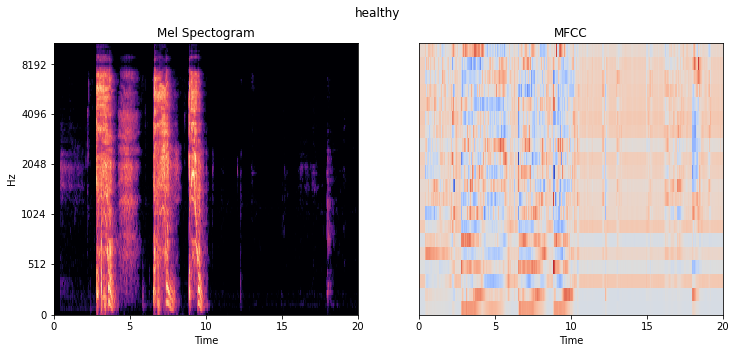

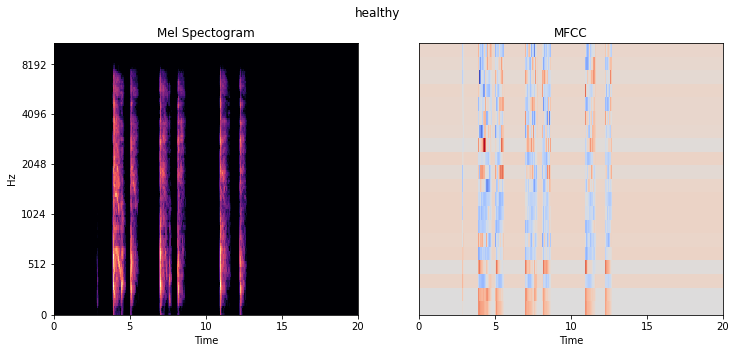

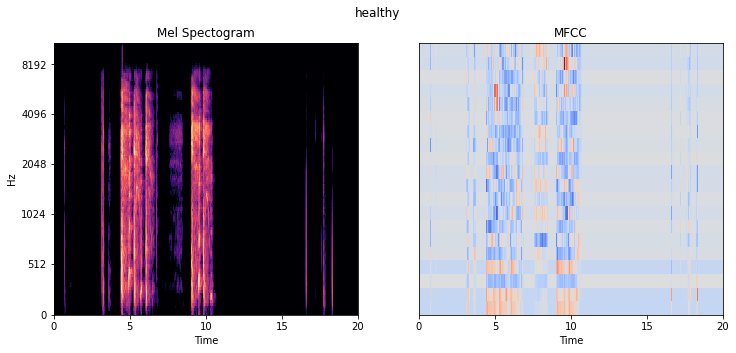

In [12]:
def get_mel_spectrogram_new(signal, n_fft=1024, n_mels = 128):
    """
    Return mel spectrogram. Adjust number of fft windows using n_fft
    """
    sgram =librosa.stft(signal, n_fft = n_fft)

    sgram_mag, _= librosa.magphase(sgram)
    mel_scale_sgram = librosa.feature.melspectrogram(S = sgram_mag, n_mels = n_mels)

    mel_sgram = librosa.amplitude_to_db(mel_scale_sgram, ref = np.min)

    return mel_sgram

def get_mfcc_new(signal, n_mfcc=20, n_fft = 1024, n_mels = 128):
    """
        Return mfcc with x mfccs and y n_fft
    """
    sgram =librosa.stft(signal, n_fft = n_fft)

    sgram_mag, _= librosa.magphase(sgram)
    mel_scale_sgram = librosa.feature.melspectrogram(S = sgram_mag, n_mels = n_mels)
    
    mfcc = librosa.feature.mfcc(S = mel_sgram, n_mfcc=n_mfcc)
    mfcc = preprocessing.scale(mfcc, axis=1)
    return mfcc

# plot 3 mel spectograms to show that helper function works
for a in range(3):
    i = random.randint(0, len(train_signals))
    mel_sgram = get_mel_spectrogram_new(train_signals[i])
    mfcc = get_mfcc_new(train_signals[i])


    label = y_train[i]

    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(12,5))
    librosa.display.specshow(mel_sgram, x_axis='time', y_axis='mel', ax=ax1)
    librosa.display.specshow(mfcc, x_axis='time', ax=ax2)


    fig.suptitle(label)
    ax1.set_title('Mel Spectogram')
    ax2.set_title('MFCC')
    #plt.colorbar(format='%+2.0f dB', ax=ax1)
    plt.show()



In [13]:
train_mel_spectrograms = []
test_mel_spectrograms = []

train_mfccs = []
test_mfccs = []

for signal in train_signals:
    mel_spect = get_mel_spectrogram_new(signal)
    train_mel_spectrograms.append(mel_spect)
    mfcc = get_mfcc_new(signal)
    train_mfccs.append(mfcc)


for signal in test_signals:
    mel_spect = get_mel_spectrogram_new(signal)
    test_mel_spectrograms.append(mel_spect)
    mfcc = get_mfcc_new(signal)
    test_mfccs.append(mfcc)

train_mel_spectrograms = np.array(train_mel_spectrograms)
test_mel_spectrograms = np.array(test_mel_spectrograms)
train_mfccs = np.array(train_mfccs)
test_mfccs = np.array(test_mfccs)

# normalise (between 0 and 1)
train_mel_spectrograms = (train_mel_spectrograms - train_mel_spectrograms.min())/(train_mel_spectrograms.max() - train_mel_spectrograms.min())
test_mel_spectrograms = (test_mel_spectrograms - test_mel_spectrograms.min())/(test_mel_spectrograms.max() - test_mel_spectrograms.min())
train_mfccs = (train_mfccs - train_mfccs.min())/(train_mfccs.max() - train_mfccs.min())
test_mfccs = (test_mfccs - test_mfccs.min())/(test_mfccs.max() - test_mfccs.min())


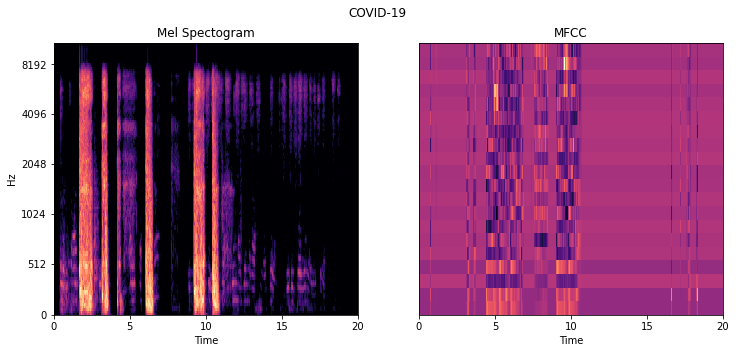

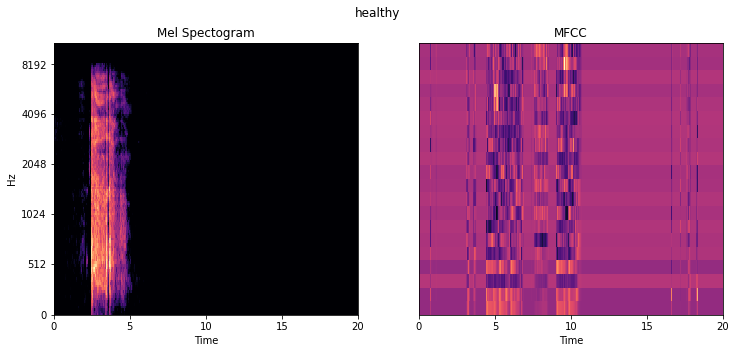

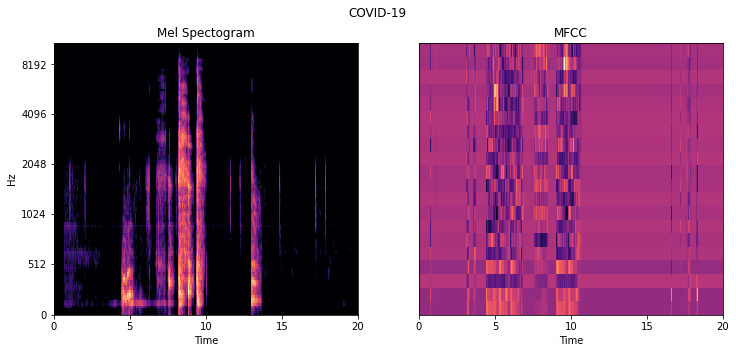

In [14]:
for a in range(3):
    i = random.randint(0, len(train_signals))
    mel_sgram = train_mel_spectrograms[i]
    mfcc = train_mfccs[i]


    label = y_train[i]

    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(12,5))
    librosa.display.specshow(mel_sgram, x_axis='time', y_axis='mel', ax=ax1)
    librosa.display.specshow(mfcc, x_axis='time', ax=ax2)


    fig.suptitle(label)
    ax1.set_title('Mel Spectogram')
    ax2.set_title('MFCC')
    #plt.colorbar(format='%+2.0f dB', ax=ax1)
    plt.show()

In [15]:
#pre-process labels
def to_binary(label):
    if (label == 'COVID-19') or (label == 1):
        return 1
    else:
        return 0

y_train = np.array(list(map(to_binary, y_train)))
y_test = np.array(list(map(to_binary, y_test)))


In [16]:
train_mel_spectrograms = train_mel_spectrograms[...,np.newaxis]
test_mel_spectrograms = test_mel_spectrograms[..., np.newaxis]
train_mfccs = train_mfccs[...,np.newaxis]
test_mfccs = test_mfccs[..., np.newaxis]

In [17]:
train_mfccs.shape, train_mel_spectrograms.shape

((2000, 20, 862, 1), (2000, 128, 862, 1))

In [26]:
test_mel_spectrograms.shape

(500, 128, 862, 1)

## Mel Spectogram 

In [18]:
# Defining model and training/testing data
X_train = train_mel_spectrograms
X_test = test_mel_spectrograms

In [19]:
def build_cnn(
    hidden_activation = 'selu',
    final_activation = 'sigmoid',
    filters = 32,
    n_units = 2,
    unit_size = 3,
    n_dense = 2,
    dense_dim = 16,
    kernel_size = 3,
    dense_dropout = False,
    conv_dropout = False,
    dropout_p = 0.2,
    optimiser = 'Adam',
    kernel_initialiser = 'he_normal',
    learning_rate = 0.0001):
    
    """
    Function for building CNN model.
    High-level architecture:
    - Input layer
    - Max-pooling
    - n convolutional units
        - n layers per unit
        - max-pooling after each unit (not each layer)
    - Dense layers
    - Output layer (single node)
    """
    
    n_conv_layers = 0  # to ensure only first few layers have dropout afterwards, if used
    n_dense_layers = 0  # to ensure only first few layers have dropout afterwards, if used
    model = keras.models.Sequential()  # define a sequential model

    # first layer:
    if hidden_activation == 'selu':
        model.add(keras.layers.Conv2D(filters=filters, kernel_size=(kernel_size+2,kernel_size+2), activation='selu', padding = 'same', input_shape=(128,862,1), kernel_initializer='lecun_normal'))
    else:
        model.add(keras.layers.Conv2D(filters=filters, kernel_size = (kernel_size+2,kernel_size+2), activation=hidden_activation, input_shape = (128,862,1), kernel_initializer=kernel_initialiser))

    model.add(keras.layers.MaxPool2D(pool_size=(2, 2)))  # add maxpooling layer
    
    n_conv_layers += 1
    
    # add regularisation (selu activation requires different dropout)
    if conv_dropout:
        if hidden_activation == 'selu':
            model.add(keras.layers.AlphaDropout(dropout_p))
        else:
            model.add(keras.layers.Dropout(dropout_p))
    
    # add hidden units
    for unit in range(n_units):
        filters = max(32, 32*(n_units - unit - 1))
        
        if unit == max(range(n_units)): #sets kernel size to 3 for last unit
            kernel_size = 3
        
        for layer in range(unit_size):
            if hidden_activation == 'selu':
                model.add(keras.layers.Conv2D(filters=filters, kernel_size = (kernel_size,kernel_size), activation='selu', padding = 'same', kernel_initializer='lecun_normal'))
            else:
                model.add(keras.layers.Conv2D(filters=filters, kernel_size = (kernel_size,kernel_size), activation=hidden_activation, padding = 'same', kernel_initializer=kernel_initialiser))
            
            n_conv_layers += 1
            
            if n_conv_layers < 4:
                if conv_dropout:
                    if hidden_activation == 'selu':
                        model.add(keras.layers.AlphaDropout(dropout_p))
                    else:
                        model.add(keras.layers.Dropout(dropout_p))
                        
        model.add(keras.layers.MaxPool2D(pool_size=(2, 2)))  # add maxpooling layer
    
    # for any dense layers, and for output neuron
    model.add(keras.layers.Flatten())
    
    # add any dense layers
    if n_dense > 0:
        for i, d_layer in enumerate(range(n_dense)):
            if hidden_activation == 'leaky_relu':
                model.add(keras.layers.Dense(dense_dim//(i+1)))
                keras.layers.LeakyReLU(alpha=0.2)
            elif hidden_activation == 'selu':
                model.add(keras.layers.Dense(dense_dim//(i+1), activation='selu', kernel_initializer='lecun_normal'))
            else:
                model.add(keras.layers.Dense(dense_dim//(i+1), activation=hidden_activation, kernel_initializer=kernel_initialiser))
            
            n_dense_layers += 1
            
            if n_dense_layers < 4:
                if dense_dropout:
                    if hidden_activation == 'selu':
                        model.add(keras.layers.AlphaDropout(dropout_p))
                    else:
                        model.add(keras.layers.Dropout(dropout_p))

    model.add(keras.layers.Dense(1, activation = final_activation))

    if optimiser == 'SGD':
        opt = keras.optimizers.SGD(learning_rate=learning_rate)
    elif optimiser == 'momentum':
        opt = keras.optimizers.SGD(learning_rate=learning_rate, momentum = 0.9)
    elif optimiser == 'Adam':
        opt = keras.optimizers.Adam(learning_rate = learning_rate)
    elif optimiser == 'Adamax':
        opt = keras.optimizers.Adamax(learning_rate=learning_rate, beta_1=0.9, beta_2=0.999)
    elif optimiser == 'Adagrad':
        opt = keras.optimizers.Adagrad(learning_rate = learning_rate)

    model.compile(loss = 'binary_crossentropy', optimizer = opt, metrics = ["AUC", keras.metrics.Recall()])
    print(model.summary())
    return model


In [20]:
def cross_validate(model, X, y, K = 5, epochs = 40,**kwargs):
    histories = []
    for train, test in KFold(n_splits=K, shuffle=True, random_state=random_state).split(X,y):
        model = model 
        histories.append(model.fit(X[train], y[train], epochs = epochs, validation_data = (X[test],y[test])).history)
    return histories

def plot_performance(cnn_performance):
    fig, ax = plt.subplots(2,3, figsize = (18,12))

    for i in range(10):
        keys = list(cnn_performance[i].keys())
        ax[0][0].plot(cnn_performance[i]['loss'])
        ax[0][0].set_title('loss')

        ax[0][1].plot(cnn_performance[i]['AUC'])
        ax[0][1].set_title('AUC')

        ax[0][2].plot(cnn_performance[i][keys[2]])
        ax[0][2].set_title(keys[2])    


        ax[1][0].plot(cnn_performance[i]['val_loss'])
        ax[1][0].set_title('val_loss')

        ax[1][1].plot(cnn_performance[i]['val_AUC'])
        ax[1][1].set_title('val_AUC')


        ax[1][2].plot(cnn_performance[i][keys[5]])
        ax[1][2].set_title(keys[5])


    plt.show()

### Base CNN

In [27]:
cnn = keras.wrappers.scikit_learn.KerasClassifier(build_fn = build_cnn, n_units = 4, unit_size = 2, dropout = False)

cnn_performance = cross_validate(cnn, X_train, y_train, K = 10)

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_18 (Conv2D)           (None, 128, 862, 32)      832       
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 64, 431, 32)       0         
_________________________________________________________________
conv2d_19 (Conv2D)           (None, 64, 431, 64)       18496     
_________________________________________________________________
conv2d_20 (Conv2D)           (None, 64, 431, 64)       36928     
_________________________________________________________________
max_pooling2d_11 (MaxPooling (None, 32, 215, 64)       0         
_________________________________________________________________
conv2d_21 (Conv2D)           (None, 32, 215, 32)       18464     
_________________________________________________________________
conv2d_22 (Conv2D)           (None, 32, 215, 32)      

1800/1800 [==============================] - 16s 9ms/sample - loss: 0.0460 - AUC: 0.9999 - recall_2: 0.9944 - val_loss: 1.1382 - val_AUC: 0.7034 - val_recall_2: 0.6569
Epoch 32/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.0381 - AUC: 1.0000 - recall_2: 0.9967 - val_loss: 1.2110 - val_AUC: 0.7150 - val_recall_2: 0.6471
Epoch 33/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.0274 - AUC: 1.0000 - recall_2: 0.9989 - val_loss: 1.2343 - val_AUC: 0.7118 - val_recall_2: 0.6569
Epoch 34/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.0208 - AUC: 1.0000 - recall_2: 1.0000 - val_loss: 1.3088 - val_AUC: 0.7091 - val_recall_2: 0.6569
Epoch 35/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.0164 - AUC: 1.0000 - recall_2: 1.0000 - val_loss: 1.3928 - val_AUC: 0.7066 - val_recall_2: 0.6471
Epoch 36/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.0137 - AUC: 1.0000 - recall_2:

1800/1800 [==============================] - 16s 9ms/sample - loss: 0.4639 - AUC: 0.8582 - recall_4: 0.7258 - val_loss: 0.6045 - val_AUC: 0.7376 - val_recall_4: 0.6311
Epoch 12/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.4374 - AUC: 0.8783 - recall_4: 0.7157 - val_loss: 0.6315 - val_AUC: 0.7241 - val_recall_4: 0.6019
Epoch 13/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.4190 - AUC: 0.8908 - recall_4: 0.7525 - val_loss: 0.6475 - val_AUC: 0.7116 - val_recall_4: 0.5825
Epoch 14/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.3844 - AUC: 0.9112 - recall_4: 0.7826 - val_loss: 0.6791 - val_AUC: 0.7081 - val_recall_4: 0.6019
Epoch 15/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.3628 - AUC: 0.9210 - recall_4: 0.8172 - val_loss: 0.6696 - val_AUC: 0.7341 - val_recall_4: 0.6214
Epoch 16/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.3381 - AUC: 0.9352 - recall_4:

1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7437 - AUC: 0.5172 - recall_6: 0.5622 - val_loss: 0.7186 - val_AUC: 0.6098 - val_recall_6: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6897 - AUC: 0.5501 - recall_6: 0.4155 - val_loss: 0.6764 - val_AUC: 0.6387 - val_recall_6: 1.0000
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6778 - AUC: 0.6031 - recall_6: 0.5286 - val_loss: 0.6604 - val_AUC: 0.6921 - val_recall_6: 0.9907
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6685 - AUC: 0.6156 - recall_6: 0.5566 - val_loss: 0.6507 - val_AUC: 0.7552 - val_recall_6: 0.2523
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6504 - AUC: 0.6563 - recall_6: 0.5230 - val_loss: 0.6190 - val_AUC: 0.7662 - val_recall_6: 0.5701
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6226 - AUC: 0.7007 - recall_6:

1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7006 - AUC: 0.5419 - recall_7: 0.5602 - val_loss: 0.6639 - val_AUC: 0.6883 - val_recall_7: 0.5158
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7207 - AUC: 0.5383 - recall_7: 0.4994 - val_loss: 0.6667 - val_AUC: 0.6713 - val_recall_7: 0.2632
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6777 - AUC: 0.5918 - recall_7: 0.5867 - val_loss: 0.6387 - val_AUC: 0.7241 - val_recall_7: 0.4316
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6555 - AUC: 0.6418 - recall_7: 0.5536 - val_loss: 0.6231 - val_AUC: 0.7192 - val_recall_7: 0.6421
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6351 - AUC: 0.6839 - recall_7: 0.6133 - val_loss: 0.6028 - val_AUC: 0.7230 - val_recall_7: 0.4211
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6329 - AUC: 0.6857 - recall_7: 0.6

1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7034 - AUC: 0.5417 - recall_8: 0.5520 - val_loss: 0.6814 - val_AUC: 0.6010 - val_recall_8: 0.6042
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6762 - AUC: 0.6037 - recall_8: 0.5874 - val_loss: 0.6885 - val_AUC: 0.6546 - val_recall_8: 0.1667
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6742 - AUC: 0.6061 - recall_8: 0.5564 - val_loss: 0.6678 - val_AUC: 0.6191 - val_recall_8: 0.6458
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6470 - AUC: 0.6607 - recall_8: 0.5940 - val_loss: 0.6407 - val_AUC: 0.6664 - val_recall_8: 0.6250
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6280 - AUC: 0.6898 - recall_8: 0.5730 - val_loss: 0.6451 - val_AUC: 0.6667 - val_recall_8: 0.6146
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6072 - AUC: 0.7233 - recall_8: 0.6

1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7079 - AUC: 0.5451 - recall_9: 0.5078 - val_loss: 0.6572 - val_AUC: 0.6817 - val_recall_9: 0.9151
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6783 - AUC: 0.5942 - recall_9: 0.5548 - val_loss: 0.6459 - val_AUC: 0.7037 - val_recall_9: 0.4434
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6504 - AUC: 0.6517 - recall_9: 0.5459 - val_loss: 0.6284 - val_AUC: 0.7168 - val_recall_9: 0.5283
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6331 - AUC: 0.6791 - recall_9: 0.5705 - val_loss: 0.6807 - val_AUC: 0.7215 - val_recall_9: 0.1981
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6426 - AUC: 0.6588 - recall_9: 0.5515 - val_loss: 0.5921 - val_AUC: 0.7512 - val_recall_9: 0.6226
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6104 - AUC: 0.7150 - recall_9: 0.5

1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7088 - AUC: 0.5244 - recall_10: 0.5275 - val_loss: 0.6788 - val_AUC: 0.6478 - val_recall_10: 0.0326
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6882 - AUC: 0.5693 - recall_10: 0.5980 - val_loss: 0.7233 - val_AUC: 0.6399 - val_recall_10: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6688 - AUC: 0.6122 - recall_10: 0.5407 - val_loss: 0.6721 - val_AUC: 0.6320 - val_recall_10: 0.7174
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6567 - AUC: 0.6486 - recall_10: 0.6399 - val_loss: 0.6368 - val_AUC: 0.6675 - val_recall_10: 0.3804
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6301 - AUC: 0.6901 - recall_10: 0.5969 - val_loss: 0.6320 - val_AUC: 0.6684 - val_recall_10: 0.4348
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6097 - AUC: 0.7187 -

1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7044 - AUC: 0.5424 - recall_11: 0.5641 - val_loss: 0.6777 - val_AUC: 0.6461 - val_recall_11: 0.3689
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6866 - AUC: 0.5736 - recall_11: 0.5229 - val_loss: 0.6708 - val_AUC: 0.6133 - val_recall_11: 0.3495
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6539 - AUC: 0.6497 - recall_11: 0.5452 - val_loss: 0.6670 - val_AUC: 0.6234 - val_recall_11: 0.3689
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6386 - AUC: 0.6754 - recall_11: 0.5808 - val_loss: 0.6531 - val_AUC: 0.6312 - val_recall_11: 0.4854
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6234 - AUC: 0.6997 - recall_11: 0.5886 - val_loss: 0.6516 - val_AUC: 0.6333 - val_recall_11: 0.5631
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.5964 - AUC: 0.7343 - rec

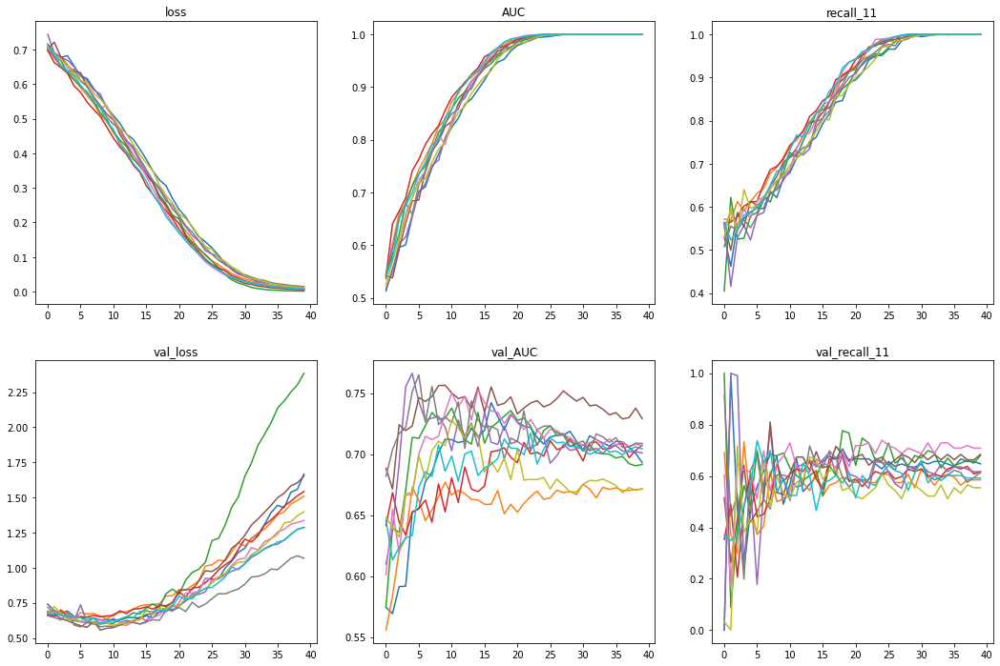

In [32]:
plot_performance(cnn_performance)

CNNs 2, 3 and 4 were (probably) trained on a balanced data set. Perhaps try the below again, withou balancing? Then also add  more filters.

In [40]:
cnn_2 = keras.wrappers.scikit_learn.KerasClassifier(build_fn = build_cnn, n_units = 4, unit_size = 2, dropout = True)

cnn_2_performance = cross_validate(cnn_2, X_train, y_train, K = 10)

Model: "sequential_18"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_162 (Conv2D)          (None, 128, 862, 32)      832       
_________________________________________________________________
max_pooling2d_90 (MaxPooling (None, 64, 431, 32)       0         
_________________________________________________________________
alpha_dropout_4 (AlphaDropou (None, 64, 431, 32)       0         
_________________________________________________________________
conv2d_163 (Conv2D)          (None, 64, 431, 64)       18496     
_________________________________________________________________
alpha_dropout_5 (AlphaDropou (None, 64, 431, 64)       0         
_________________________________________________________________
conv2d_164 (Conv2D)          (None, 64, 431, 64)       36928     
_________________________________________________________________
max_pooling2d_91 (MaxPooling (None, 32, 215, 64)     

Epoch 28/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.6965 - AUC: 0.5270 - recall_18: 0.5089 - val_loss: 0.6925 - val_AUC: 0.5500 - val_recall_18: 1.0000
Epoch 29/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7029 - AUC: 0.5167 - recall_18: 0.6370 - val_loss: 0.6950 - val_AUC: 0.5309 - val_recall_18: 1.0000
Epoch 30/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.6907 - AUC: 0.5465 - recall_18: 0.7951 - val_loss: 0.6953 - val_AUC: 0.5051 - val_recall_18: 1.0000
Epoch 31/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.6919 - AUC: 0.5526 - recall_18: 0.6849 - val_loss: 0.6927 - val_AUC: 0.5307 - val_recall_18: 1.0000
Epoch 32/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.6968 - AUC: 0.5408 - recall_18: 0.5735 - val_loss: 0.6927 - val_AUC: 0.5715 - val_recall_18: 1.0000
Epoch 33/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.69

Epoch 15/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.6981 - AUC: 0.5793 - recall_19: 0.6446 - val_loss: 1.0489 - val_AUC: 0.5361 - val_recall_19: 1.0000
Epoch 16/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.6934 - AUC: 0.5919 - recall_19: 0.6446 - val_loss: 0.8720 - val_AUC: 0.6042 - val_recall_19: 1.0000
Epoch 17/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.6791 - AUC: 0.6228 - recall_19: 0.7119 - val_loss: 0.8996 - val_AUC: 0.5590 - val_recall_19: 1.0000
Epoch 18/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.6753 - AUC: 0.6288 - recall_19: 0.6645 - val_loss: 0.8017 - val_AUC: 0.5609 - val_recall_19: 1.0000
Epoch 19/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.6697 - AUC: 0.6425 - recall_19: 0.6744 - val_loss: 0.7989 - val_AUC: 0.6224 - val_recall_19: 1.0000
Epoch 20/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.66

Train on 1800 samples, validate on 200 samples
Epoch 1/40
1800/1800 [==============================] - 21s 12ms/sample - loss: 0.7206 - AUC: 0.4933 - recall_21: 0.3808 - val_loss: 0.6925 - val_AUC: 0.5461 - val_recall_21: 0.4118
Epoch 2/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7002 - AUC: 0.5065 - recall_21: 0.4465 - val_loss: 0.6979 - val_AUC: 0.5112 - val_recall_21: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.6987 - AUC: 0.5153 - recall_21: 0.3864 - val_loss: 0.8169 - val_AUC: 0.5265 - val_recall_21: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.6984 - AUC: 0.5117 - recall_21: 0.3530 - val_loss: 0.6907 - val_AUC: 0.6034 - val_recall_21: 0.8431
Epoch 5/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7004 - AUC: 0.5038 - recall_21: 0.2862 - val_loss: 0.6958 - val_AUC: 0.5199 - val_recall_21: 1.0000
Epoch 6/40
1800/1800 [=============

1800/1800 [==============================] - 22s 12ms/sample - loss: 0.7870 - AUC: 0.5010 - recall_22: 0.4166 - val_loss: 0.6874 - val_AUC: 0.5498 - val_recall_22: 0.9439
Epoch 2/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7705 - AUC: 0.4927 - recall_22: 0.4524 - val_loss: 0.6900 - val_AUC: 0.6147 - val_recall_22: 0.1402
Epoch 3/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7493 - AUC: 0.5164 - recall_22: 0.4412 - val_loss: 0.6912 - val_AUC: 0.5811 - val_recall_22: 0.2991
Epoch 4/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7464 - AUC: 0.5154 - recall_22: 0.4815 - val_loss: 0.6965 - val_AUC: 0.5028 - val_recall_22: 0.2336
Epoch 5/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7561 - AUC: 0.5020 - recall_22: 0.4278 - val_loss: 0.6881 - val_AUC: 0.6010 - val_recall_22: 0.6168
Epoch 6/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7522 - AUC: 0.4946 

1800/1800 [==============================] - 21s 12ms/sample - loss: 0.8001 - AUC: 0.4712 - recall_23: 0.4564 - val_loss: 0.6846 - val_AUC: 0.5802 - val_recall_23: 0.1579
Epoch 2/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7545 - AUC: 0.5033 - recall_23: 0.5061 - val_loss: 0.7494 - val_AUC: 0.5234 - val_recall_23: 1.0000
Epoch 3/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7564 - AUC: 0.4985 - recall_23: 0.4862 - val_loss: 0.8458 - val_AUC: 0.5708 - val_recall_23: 1.0000
Epoch 4/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7576 - AUC: 0.5018 - recall_23: 0.5039 - val_loss: 0.9415 - val_AUC: 0.3670 - val_recall_23: 1.0000
Epoch 5/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7447 - AUC: 0.5127 - recall_23: 0.4851 - val_loss: 1.1165 - val_AUC: 0.4035 - val_recall_23: 1.0000
Epoch 6/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7263 - AUC: 0.5351 

1800/1800 [==============================] - 22s 12ms/sample - loss: 0.7305 - AUC: 0.4983 - recall_24: 0.3208 - val_loss: 0.7361 - val_AUC: 0.5193 - val_recall_24: 1.0000
Epoch 2/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7116 - AUC: 0.5118 - recall_24: 0.4181 - val_loss: 0.6944 - val_AUC: 0.5278 - val_recall_24: 0.4688
Epoch 3/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7197 - AUC: 0.4822 - recall_24: 0.3650 - val_loss: 0.6936 - val_AUC: 0.5480 - val_recall_24: 0.7083
Epoch 4/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7142 - AUC: 0.4883 - recall_24: 0.3374 - val_loss: 0.7397 - val_AUC: 0.5065 - val_recall_24: 1.0000
Epoch 5/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7193 - AUC: 0.4811 - recall_24: 0.3330 - val_loss: 0.7027 - val_AUC: 0.5603 - val_recall_24: 0.9896
Epoch 6/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7044 - AUC: 0.5183 

1800/1800 [==============================] - 21s 12ms/sample - loss: 0.7439 - AUC: 0.5085 - recall_25: 0.3926 - val_loss: 0.7768 - val_AUC: 0.5535 - val_recall_25: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7397 - AUC: 0.4772 - recall_25: 0.3065 - val_loss: 0.7204 - val_AUC: 0.4578 - val_recall_25: 0.0660
Epoch 3/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7261 - AUC: 0.5091 - recall_25: 0.3456 - val_loss: 0.7355 - val_AUC: 0.4457 - val_recall_25: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7371 - AUC: 0.4653 - recall_25: 0.3210 - val_loss: 0.7361 - val_AUC: 0.5082 - val_recall_25: 0.0189
Epoch 5/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7281 - AUC: 0.4946 - recall_25: 0.3591 - val_loss: 0.7807 - val_AUC: 0.4607 - val_recall_25: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7246 - 

1800/1800 [==============================] - 22s 12ms/sample - loss: 0.7636 - AUC: 0.5008 - recall_26: 0.4637 - val_loss: 0.7133 - val_AUC: 0.4799 - val_recall_26: 0.0978
Epoch 2/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7307 - AUC: 0.5102 - recall_26: 0.4119 - val_loss: 0.7176 - val_AUC: 0.4904 - val_recall_26: 0.0109
Epoch 3/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7309 - AUC: 0.5014 - recall_26: 0.3744 - val_loss: 0.7300 - val_AUC: 0.4873 - val_recall_26: 0.9457
Epoch 4/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7270 - AUC: 0.5061 - recall_26: 0.4570 - val_loss: 0.8885 - val_AUC: 0.4842 - val_recall_26: 1.0000
Epoch 5/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7342 - AUC: 0.5011 - recall_26: 0.4725 - val_loss: 0.8118 - val_AUC: 0.5011 - val_recall_26: 1.0000
Epoch 6/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7366 - AUC: 0.4748 

1800/1800 [==============================] - 21s 12ms/sample - loss: 0.7643 - AUC: 0.4764 - recall_27: 0.5641 - val_loss: 0.7272 - val_AUC: 0.5325 - val_recall_27: 1.0000
Epoch 2/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7356 - AUC: 0.5005 - recall_27: 0.6120 - val_loss: 0.7118 - val_AUC: 0.5025 - val_recall_27: 1.0000
Epoch 3/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7379 - AUC: 0.4768 - recall_27: 0.5496 - val_loss: 0.7334 - val_AUC: 0.5219 - val_recall_27: 1.0000
Epoch 4/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7242 - AUC: 0.5083 - recall_27: 0.5050 - val_loss: 0.7326 - val_AUC: 0.5891 - val_recall_27: 1.0000
Epoch 5/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7323 - AUC: 0.4961 - recall_27: 0.5808 - val_loss: 0.7509 - val_AUC: 0.5479 - val_recall_27: 1.0000
Epoch 6/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.7267 - AUC: 0.4938 

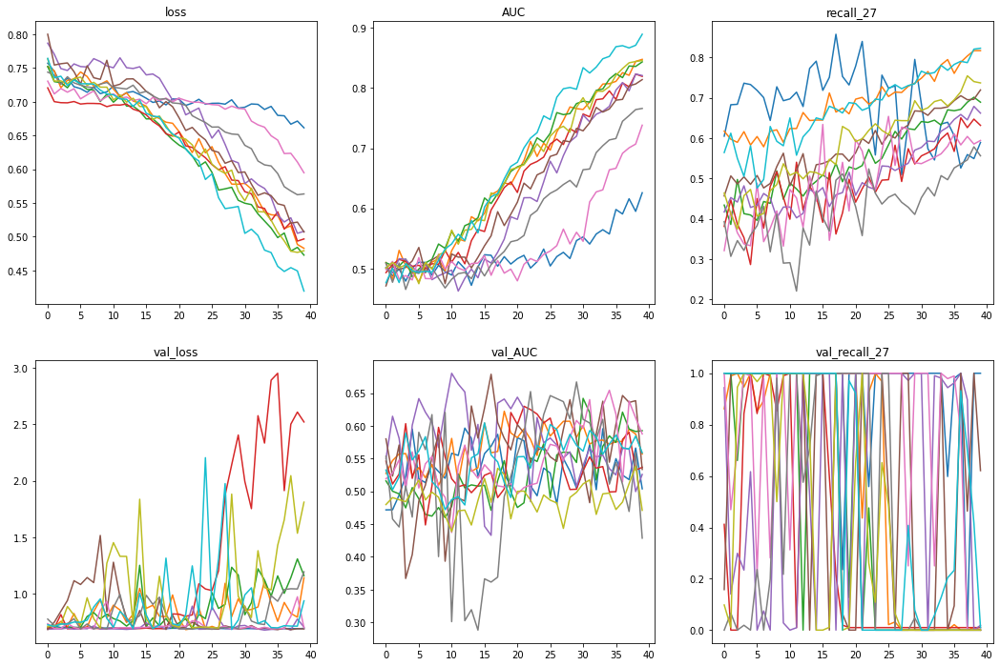

In [41]:
plot_performance(cnn_2_performance)

In [46]:
cnn_3 = keras.wrappers.scikit_learn.KerasClassifier(build_fn = build_cnn, n_units = 4, unit_size = 2, dense_dropout = True)

cnn_3_performance = cross_validate(cnn_3, X_train, y_train, K = 10)

Model: "sequential_29"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_253 (Conv2D)          (None, 128, 862, 32)      832       
_________________________________________________________________
max_pooling2d_141 (MaxPoolin (None, 64, 431, 32)       0         
_________________________________________________________________
conv2d_254 (Conv2D)          (None, 64, 431, 64)       18496     
_________________________________________________________________
conv2d_255 (Conv2D)          (None, 64, 431, 64)       36928     
_________________________________________________________________
max_pooling2d_142 (MaxPoolin (None, 32, 215, 64)       0         
_________________________________________________________________
conv2d_256 (Conv2D)          (None, 32, 215, 32)       18464     
_________________________________________________________________
conv2d_257 (Conv2D)          (None, 32, 215, 32)     

1800/1800 [==============================] - 16s 9ms/sample - loss: 0.5977 - AUC: 0.7394 - recall_29: 0.6413 - val_loss: 0.6575 - val_AUC: 0.6952 - val_recall_29: 0.5957
Epoch 18/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.5858 - AUC: 0.7574 - recall_29: 0.6457 - val_loss: 0.6801 - val_AUC: 0.6923 - val_recall_29: 0.6383
Epoch 19/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.5856 - AUC: 0.7567 - recall_29: 0.6711 - val_loss: 0.6874 - val_AUC: 0.6795 - val_recall_29: 0.5426
Epoch 20/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.5669 - AUC: 0.7717 - recall_29: 0.6667 - val_loss: 0.6632 - val_AUC: 0.7078 - val_recall_29: 0.6383
Epoch 21/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.5603 - AUC: 0.7769 - recall_29: 0.6600 - val_loss: 0.6596 - val_AUC: 0.6997 - val_recall_29: 0.6170
Epoch 22/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.5529 - AUC: 0.7835 -

1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7725 - AUC: 0.4918 - recall_31: 0.4087 - val_loss: 0.6974 - val_AUC: 0.5131 - val_recall_31: 0.1275
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7369 - AUC: 0.5150 - recall_31: 0.4621 - val_loss: 0.7275 - val_AUC: 0.5421 - val_recall_31: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7296 - AUC: 0.5055 - recall_31: 0.4555 - val_loss: 0.6817 - val_AUC: 0.5925 - val_recall_31: 0.5686
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7185 - AUC: 0.5298 - recall_31: 0.5245 - val_loss: 0.7137 - val_AUC: 0.6124 - val_recall_31: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7248 - AUC: 0.5251 - recall_31: 0.5089 - val_loss: 0.6815 - val_AUC: 0.5848 - val_recall_31: 0.5588
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7046 - AUC: 0.55

1800/1800 [==============================] - 19s 11ms/sample - loss: 0.7107 - AUC: 0.4940 - recall_32: 0.4199 - val_loss: 0.7294 - val_AUC: 0.4867 - val_recall_32: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7056 - AUC: 0.4876 - recall_32: 0.4076 - val_loss: 0.6833 - val_AUC: 0.6689 - val_recall_32: 0.5234
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6970 - AUC: 0.5221 - recall_32: 0.4871 - val_loss: 0.7041 - val_AUC: 0.6692 - val_recall_32: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6948 - AUC: 0.5325 - recall_32: 0.4233 - val_loss: 0.6733 - val_AUC: 0.6422 - val_recall_32: 1.0000
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7019 - AUC: 0.5056 - recall_32: 0.4087 - val_loss: 0.7076 - val_AUC: 0.6214 - val_recall_32: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6949 - AUC: 

1800/1800 [==============================] - 18s 10ms/sample - loss: 0.7727 - AUC: 0.5464 - recall_33: 0.5072 - val_loss: 0.6804 - val_AUC: 0.6145 - val_recall_33: 0.1263
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7523 - AUC: 0.5235 - recall_33: 0.4619 - val_loss: 0.6488 - val_AUC: 0.6950 - val_recall_33: 0.6316
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7263 - AUC: 0.5648 - recall_33: 0.5127 - val_loss: 0.6274 - val_AUC: 0.7106 - val_recall_33: 0.6316
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7407 - AUC: 0.5502 - recall_33: 0.4751 - val_loss: 0.6440 - val_AUC: 0.7140 - val_recall_33: 0.7789
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7087 - AUC: 0.5901 - recall_33: 0.4994 - val_loss: 0.6092 - val_AUC: 0.7358 - val_recall_33: 0.7684
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6928 - AUC: 0.6103 - rec

1800/1800 [==============================] - 19s 11ms/sample - loss: 0.7388 - AUC: 0.4930 - recall_34: 0.4768 - val_loss: 0.7458 - val_AUC: 0.6197 - val_recall_34: 1.0000
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7157 - AUC: 0.5144 - recall_34: 0.4436 - val_loss: 0.7012 - val_AUC: 0.6094 - val_recall_34: 1.0000
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7121 - AUC: 0.5161 - recall_34: 0.5221 - val_loss: 0.7219 - val_AUC: 0.5559 - val_recall_34: 1.0000
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7224 - AUC: 0.4988 - recall_34: 0.5122 - val_loss: 0.7427 - val_AUC: 0.4643 - val_recall_34: 1.0000
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7239 - AUC: 0.4858 - recall_34: 0.5442 - val_loss: 0.7048 - val_AUC: 0.6168 - val_recall_34: 1.0000
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7066 - AUC: 0.5240 - rec

1800/1800 [==============================] - 18s 10ms/sample - loss: 0.7481 - AUC: 0.5179 - recall_35: 0.4407 - val_loss: 0.6813 - val_AUC: 0.6663 - val_recall_35: 1.0000
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7505 - AUC: 0.4899 - recall_35: 0.4385 - val_loss: 0.7920 - val_AUC: 0.6895 - val_recall_35: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7253 - AUC: 0.5308 - recall_35: 0.4374 - val_loss: 0.6434 - val_AUC: 0.7155 - val_recall_35: 0.5755
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7152 - AUC: 0.5552 - recall_35: 0.4452 - val_loss: 0.6502 - val_AUC: 0.6870 - val_recall_35: 0.4528
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7129 - AUC: 0.5582 - recall_35: 0.4441 - val_loss: 0.7121 - val_AUC: 0.7132 - val_recall_35: 0.1509
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6981 - AUC: 0.5875 -

1800/1800 [==============================] - 19s 11ms/sample - loss: 0.7320 - AUC: 0.4956 - recall_36: 0.5705 - val_loss: 0.6893 - val_AUC: 0.5206 - val_recall_36: 0.0435
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6980 - AUC: 0.5452 - recall_36: 0.6002 - val_loss: 0.6865 - val_AUC: 0.5802 - val_recall_36: 0.0217
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6936 - AUC: 0.5487 - recall_36: 0.5881 - val_loss: 0.6987 - val_AUC: 0.5883 - val_recall_36: 1.0000
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6972 - AUC: 0.5427 - recall_36: 0.5936 - val_loss: 0.6858 - val_AUC: 0.6058 - val_recall_36: 0.7283
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6979 - AUC: 0.5535 - recall_36: 0.6178 - val_loss: 0.6774 - val_AUC: 0.6292 - val_recall_36: 0.1848
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6863 - AUC: 0.5816 - rec

1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7833 - AUC: 0.5052 - recall_37: 0.5641 - val_loss: 0.6928 - val_AUC: 0.5075 - val_recall_37: 0.7670
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7372 - AUC: 0.4767 - recall_37: 0.6745 - val_loss: 0.6933 - val_AUC: 0.5353 - val_recall_37: 0.0680
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7210 - AUC: 0.4995 - recall_37: 0.5552 - val_loss: 0.6928 - val_AUC: 0.5522 - val_recall_37: 1.0000
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7241 - AUC: 0.4978 - recall_37: 0.7982 - val_loss: 0.6937 - val_AUC: 0.4927 - val_recall_37: 1.0000
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7108 - AUC: 0.5052 - recall_37: 0.8506 - val_loss: 0.6925 - val_AUC: 0.5291 - val_recall_37: 1.0000
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7151 - AUC: 0.5097 - rec

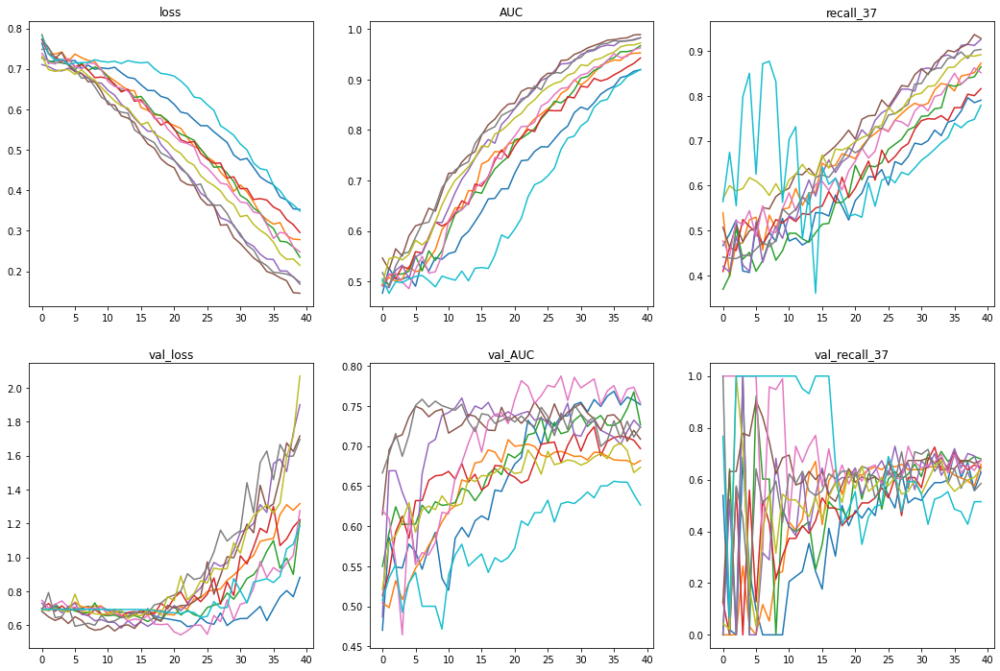

In [47]:
plot_performance(cnn_3_performance)

In [48]:
cnn_4 = keras.wrappers.scikit_learn.KerasClassifier(build_fn = build_cnn, n_units = 4, unit_size = 2, conv_dropout = True)

cnn_4_performance = cross_validate(cnn_4, X_train, y_train, K = 10)

Model: "sequential_39"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_343 (Conv2D)          (None, 128, 862, 32)      832       
_________________________________________________________________
max_pooling2d_191 (MaxPoolin (None, 64, 431, 32)       0         
_________________________________________________________________
alpha_dropout_64 (AlphaDropo (None, 64, 431, 32)       0         
_________________________________________________________________
conv2d_344 (Conv2D)          (None, 64, 431, 64)       18496     
_________________________________________________________________
alpha_dropout_65 (AlphaDropo (None, 64, 431, 64)       0         
_________________________________________________________________
conv2d_345 (Conv2D)          (None, 64, 431, 64)       36928     
_________________________________________________________________
max_pooling2d_192 (MaxPoolin (None, 32, 215, 64)     

Epoch 29/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.3747 - AUC: 0.9116 - recall_38: 0.7706 - val_loss: 1.8962 - val_AUC: 0.5057 - val_recall_38: 0.0000e+00
Epoch 30/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.3438 - AUC: 0.9272 - recall_38: 0.7773 - val_loss: 1.9227 - val_AUC: 0.4939 - val_recall_38: 0.0000e+00
Epoch 31/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.3312 - AUC: 0.9269 - recall_38: 0.7817 - val_loss: 2.2662 - val_AUC: 0.4819 - val_recall_38: 0.0000e+00
Epoch 32/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.3278 - AUC: 0.9309 - recall_38: 0.7862 - val_loss: 1.1403 - val_AUC: 0.4922 - val_recall_38: 0.0000e+00
Epoch 33/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.2961 - AUC: 0.9436 - recall_38: 0.8140 - val_loss: 1.2333 - val_AUC: 0.4997 - val_recall_38: 0.0000e+00
Epoch 34/40
1800/1800 [==============================] - 19s 10ms

Epoch 17/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.5591 - AUC: 0.7725 - recall_39: 0.6369 - val_loss: 0.7168 - val_AUC: 0.5512 - val_recall_39: 0.8191
Epoch 18/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.5414 - AUC: 0.7901 - recall_39: 0.6623 - val_loss: 0.6827 - val_AUC: 0.5940 - val_recall_39: 0.1702
Epoch 19/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.5248 - AUC: 0.8050 - recall_39: 0.6711 - val_loss: 2.0561 - val_AUC: 0.5784 - val_recall_39: 1.0000
Epoch 20/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.4899 - AUC: 0.8352 - recall_39: 0.7009 - val_loss: 1.1456 - val_AUC: 0.5899 - val_recall_39: 1.0000
Epoch 21/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.4701 - AUC: 0.8501 - recall_39: 0.7274 - val_loss: 1.0405 - val_AUC: 0.6184 - val_recall_39: 1.0000
Epoch 22/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.45

1800/1800 [==============================] - 22s 12ms/sample - loss: 0.7881 - AUC: 0.4994 - recall_41: 0.5022 - val_loss: 0.6907 - val_AUC: 0.5850 - val_recall_41: 0.3431
Epoch 2/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7138 - AUC: 0.5258 - recall_41: 0.5245 - val_loss: 0.6809 - val_AUC: 0.6022 - val_recall_41: 0.7353
Epoch 3/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7138 - AUC: 0.4992 - recall_41: 0.4766 - val_loss: 0.7220 - val_AUC: 0.6120 - val_recall_41: 0.9706
Epoch 4/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7119 - AUC: 0.5180 - recall_41: 0.4833 - val_loss: 0.7638 - val_AUC: 0.6130 - val_recall_41: 0.9804
Epoch 5/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7133 - AUC: 0.5164 - recall_41: 0.5278 - val_loss: 0.8421 - val_AUC: 0.6165 - val_recall_41: 1.0000
Epoch 6/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7102 - AUC: 0.5080 

1800/1800 [==============================] - 21s 12ms/sample - loss: 0.7260 - AUC: 0.5172 - recall_42: 0.4580 - val_loss: 0.6909 - val_AUC: 0.5205 - val_recall_42: 0.9159
Epoch 2/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.6976 - AUC: 0.5190 - recall_42: 0.5476 - val_loss: 0.6881 - val_AUC: 0.5797 - val_recall_42: 0.4206
Epoch 3/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.6976 - AUC: 0.5212 - recall_42: 0.3998 - val_loss: 0.6896 - val_AUC: 0.5840 - val_recall_42: 0.2150
Epoch 4/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.6994 - AUC: 0.5017 - recall_42: 0.5039 - val_loss: 0.6890 - val_AUC: 0.6227 - val_recall_42: 1.0000
Epoch 5/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.6903 - AUC: 0.5440 - recall_42: 0.4233 - val_loss: 0.7064 - val_AUC: 0.5638 - val_recall_42: 1.0000
Epoch 6/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.6919 - AUC: 0.5425 

1800/1800 [==============================] - 21s 12ms/sample - loss: 0.7091 - AUC: 0.5086 - recall_43: 0.4807 - val_loss: 0.9199 - val_AUC: 0.3486 - val_recall_43: 1.0000
Epoch 2/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.6977 - AUC: 0.5127 - recall_43: 0.5105 - val_loss: 0.8172 - val_AUC: 0.3897 - val_recall_43: 1.0000
Epoch 3/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.6960 - AUC: 0.5279 - recall_43: 0.5403 - val_loss: 0.8144 - val_AUC: 0.3787 - val_recall_43: 1.0000
Epoch 4/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7026 - AUC: 0.5040 - recall_43: 0.5878 - val_loss: 0.7047 - val_AUC: 0.4616 - val_recall_43: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.6953 - AUC: 0.5156 - recall_43: 0.4740 - val_loss: 0.7589 - val_AUC: 0.4320 - val_recall_43: 1.0000
Epoch 6/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.6934 - AUC: 0.5

1800/1800 [==============================] - 22s 12ms/sample - loss: 0.7353 - AUC: 0.5007 - recall_44: 0.5022 - val_loss: 0.8128 - val_AUC: 0.5604 - val_recall_44: 1.0000
Epoch 2/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7340 - AUC: 0.4986 - recall_44: 0.5376 - val_loss: 0.7991 - val_AUC: 0.5840 - val_recall_44: 1.0000
Epoch 3/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7058 - AUC: 0.5261 - recall_44: 0.5376 - val_loss: 0.7902 - val_AUC: 0.5887 - val_recall_44: 1.0000
Epoch 4/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.6892 - AUC: 0.5600 - recall_44: 0.5243 - val_loss: 0.8482 - val_AUC: 0.6111 - val_recall_44: 1.0000
Epoch 5/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.6926 - AUC: 0.5653 - recall_44: 0.5188 - val_loss: 0.9857 - val_AUC: 0.6271 - val_recall_44: 1.0000
Epoch 6/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7011 - AUC: 0.5538 

1800/1800 [==============================] - 21s 12ms/sample - loss: 0.7616 - AUC: 0.4817 - recall_45: 0.4966 - val_loss: 1.1352 - val_AUC: 0.4974 - val_recall_45: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7183 - AUC: 0.4918 - recall_45: 0.4463 - val_loss: 1.1333 - val_AUC: 0.4988 - val_recall_45: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7240 - AUC: 0.4989 - recall_45: 0.4877 - val_loss: 0.9166 - val_AUC: 0.4946 - val_recall_45: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7190 - AUC: 0.5006 - recall_45: 0.5056 - val_loss: 0.8786 - val_AUC: 0.5067 - val_recall_45: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7009 - AUC: 0.5355 - recall_45: 0.4843 - val_loss: 0.8536 - val_AUC: 0.4846 - val_recall_45: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0

1800/1800 [==============================] - 21s 12ms/sample - loss: 0.7406 - AUC: 0.4894 - recall_46: 0.4681 - val_loss: 0.6828 - val_AUC: 0.5777 - val_recall_46: 0.0761
Epoch 2/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7070 - AUC: 0.4938 - recall_46: 0.5606 - val_loss: 0.6776 - val_AUC: 0.5918 - val_recall_46: 0.1413
Epoch 3/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7082 - AUC: 0.4877 - recall_46: 0.5374 - val_loss: 0.6820 - val_AUC: 0.5849 - val_recall_46: 0.5543
Epoch 4/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7032 - AUC: 0.5156 - recall_46: 0.5286 - val_loss: 0.6774 - val_AUC: 0.5968 - val_recall_46: 0.1087
Epoch 5/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.6956 - AUC: 0.5355 - recall_46: 0.5760 - val_loss: 0.6835 - val_AUC: 0.5587 - val_recall_46: 0.4022
Epoch 6/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7020 - AUC: 0.5224 

1800/1800 [==============================] - 22s 12ms/sample - loss: 0.7332 - AUC: 0.4889 - recall_47: 0.5006 - val_loss: 0.7850 - val_AUC: 0.4619 - val_recall_47: 1.0000
Epoch 2/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7018 - AUC: 0.4965 - recall_47: 0.5128 - val_loss: 0.7452 - val_AUC: 0.4501 - val_recall_47: 1.0000
Epoch 3/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.6972 - AUC: 0.5052 - recall_47: 0.5128 - val_loss: 0.7412 - val_AUC: 0.4468 - val_recall_47: 1.0000
Epoch 4/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.6959 - AUC: 0.5109 - recall_47: 0.4627 - val_loss: 0.7233 - val_AUC: 0.4586 - val_recall_47: 1.0000
Epoch 5/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.6893 - AUC: 0.5482 - recall_47: 0.5195 - val_loss: 0.6987 - val_AUC: 0.5070 - val_recall_47: 1.0000
Epoch 6/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.6919 - AUC: 0.5376 

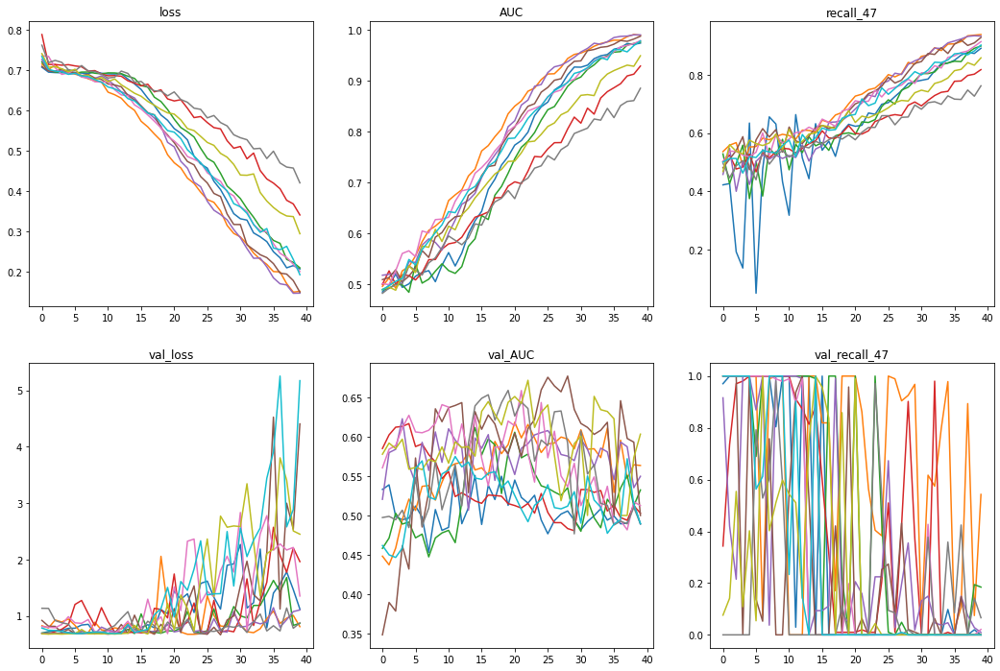

In [49]:
plot_performance(cnn_4_performance)

same again (not re-balanced)

In [22]:
cnn_5 = keras.wrappers.scikit_learn.KerasClassifier(build_fn = build_cnn, n_units = 4, unit_size = 2, dense_dropout = True,
                                                    conv_dropout = True)

cnn_5_performance = cross_validate(cnn_5, X_train, y_train, K = 10)

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_18 (Conv2D)           (None, 128, 862, 32)      832       
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 64, 431, 32)       0         
_________________________________________________________________
alpha_dropout_8 (AlphaDropou (None, 64, 431, 32)       0         
_________________________________________________________________
conv2d_19 (Conv2D)           (None, 64, 431, 64)       18496     
_________________________________________________________________
alpha_dropout_9 (AlphaDropou (None, 64, 431, 64)       0         
_________________________________________________________________
conv2d_20 (Conv2D)           (None, 64, 431, 64)       36928     
_________________________________________________________________
alpha_dropout_10 (AlphaDropo (None, 64, 431, 64)      

1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6327 - AUC: 0.5428 - recall_2: 0.0051 - val_loss: 0.6346 - val_AUC: 0.5151 - val_recall_2: 0.0000e+00
Epoch 28/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6313 - AUC: 0.5460 - recall_2: 0.0274 - val_loss: 0.6340 - val_AUC: 0.5326 - val_recall_2: 0.0000e+00
Epoch 29/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6252 - AUC: 0.5701 - recall_2: 0.0360 - val_loss: 0.6390 - val_AUC: 0.5181 - val_recall_2: 0.0000e+00
Epoch 30/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6338 - AUC: 0.5371 - recall_2: 0.0463 - val_loss: 0.6714 - val_AUC: 0.4634 - val_recall_2: 0.0000e+00
Epoch 31/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6275 - AUC: 0.5618 - recall_2: 0.0497 - val_loss: 0.6378 - val_AUC: 0.5372 - val_recall_2: 0.0000e+00
Epoch 32/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6255

Epoch 13/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6502 - AUC: 0.5005 - recall_3: 0.0836 - val_loss: 0.9310 - val_AUC: 0.4457 - val_recall_3: 1.0000
Epoch 14/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6456 - AUC: 0.5061 - recall_3: 0.0666 - val_loss: 0.6340 - val_AUC: 0.4583 - val_recall_3: 0.0000e+00
Epoch 15/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6434 - AUC: 0.5141 - recall_3: 0.0512 - val_loss: 0.6536 - val_AUC: 0.4657 - val_recall_3: 0.0000e+00
Epoch 16/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6499 - AUC: 0.4908 - recall_3: 0.0683 - val_loss: 0.9433 - val_AUC: 0.4383 - val_recall_3: 0.9841
Epoch 17/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6489 - AUC: 0.4959 - recall_3: 0.0614 - val_loss: 0.9209 - val_AUC: 0.4780 - val_recall_3: 1.0000
Epoch 18/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6572

1800/1800 [==============================] - 23s 13ms/sample - loss: 0.7021 - AUC: 0.5178 - recall_4: 0.2133 - val_loss: 1.3486 - val_AUC: 0.4956 - val_recall_4: 1.0000
Epoch 2/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6852 - AUC: 0.5231 - recall_4: 0.2184 - val_loss: 1.3857 - val_AUC: 0.5287 - val_recall_4: 1.0000
Epoch 3/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6807 - AUC: 0.5122 - recall_4: 0.1741 - val_loss: 1.1030 - val_AUC: 0.4798 - val_recall_4: 1.0000
Epoch 4/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6917 - AUC: 0.4973 - recall_4: 0.1297 - val_loss: 0.8907 - val_AUC: 0.5527 - val_recall_4: 1.0000
Epoch 5/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6840 - AUC: 0.4824 - recall_4: 0.1280 - val_loss: 0.8709 - val_AUC: 0.4956 - val_recall_4: 1.0000
Epoch 6/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6652 - AUC: 0.5236 - recall_4

1800/1800 [==============================] - 23s 13ms/sample - loss: 0.7248 - AUC: 0.4864 - recall_5: 0.1385 - val_loss: 0.6362 - val_AUC: 0.4854 - val_recall_5: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6778 - AUC: 0.5099 - recall_5: 0.1197 - val_loss: 0.6472 - val_AUC: 0.5010 - val_recall_5: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6730 - AUC: 0.5049 - recall_5: 0.1265 - val_loss: 0.6753 - val_AUC: 0.5157 - val_recall_5: 0.2344
Epoch 4/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6765 - AUC: 0.4948 - recall_5: 0.1333 - val_loss: 0.6947 - val_AUC: 0.5254 - val_recall_5: 0.4531
Epoch 5/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6665 - AUC: 0.5121 - recall_5: 0.1214 - val_loss: 0.6527 - val_AUC: 0.4841 - val_recall_5: 0.0312
Epoch 6/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6696 - AUC: 0.5064 - 

1800/1800 [==============================] - 23s 13ms/sample - loss: 0.6889 - AUC: 0.4583 - recall_6: 0.0589 - val_loss: 0.7573 - val_AUC: 0.3663 - val_recall_6: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6487 - AUC: 0.5143 - recall_6: 0.0416 - val_loss: 0.7587 - val_AUC: 0.3788 - val_recall_6: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6628 - AUC: 0.4776 - recall_6: 0.0277 - val_loss: 0.7505 - val_AUC: 0.4087 - val_recall_6: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6621 - AUC: 0.4767 - recall_6: 0.0295 - val_loss: 0.7572 - val_AUC: 0.3919 - val_recall_6: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6594 - AUC: 0.4911 - recall_6: 0.0139 - val_loss: 0.7451 - val_AUC: 0.3787 - val_recall_6: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6549 - AU

Train on 1800 samples, validate on 200 samples
Epoch 1/40
1800/1800 [==============================] - 23s 13ms/sample - loss: 0.8083 - AUC: 0.4865 - recall_7: 0.3160 - val_loss: 0.6494 - val_AUC: 0.4892 - val_recall_7: 0.0556
Epoch 2/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.7545 - AUC: 0.5001 - recall_7: 0.2773 - val_loss: 0.8180 - val_AUC: 0.5346 - val_recall_7: 0.9815
Epoch 3/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.7544 - AUC: 0.4886 - recall_7: 0.2571 - val_loss: 1.0731 - val_AUC: 0.5403 - val_recall_7: 1.0000
Epoch 4/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.7560 - AUC: 0.4805 - recall_7: 0.2655 - val_loss: 0.6888 - val_AUC: 0.5261 - val_recall_7: 0.4815
Epoch 5/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.7582 - AUC: 0.4875 - recall_7: 0.2790 - val_loss: 0.6715 - val_AUC: 0.5535 - val_recall_7: 0.4074
Epoch 6/40
1800/1800 [==============================]

Train on 1800 samples, validate on 200 samples
Epoch 1/40
1800/1800 [==============================] - 23s 13ms/sample - loss: 0.7121 - AUC: 0.4795 - recall_8: 0.2089 - val_loss: 0.6498 - val_AUC: 0.4398 - val_recall_8: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6744 - AUC: 0.5145 - recall_8: 0.2021 - val_loss: 0.6468 - val_AUC: 0.4411 - val_recall_8: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6791 - AUC: 0.5180 - recall_8: 0.1935 - val_loss: 0.6413 - val_AUC: 0.4905 - val_recall_8: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6997 - AUC: 0.4787 - recall_8: 0.1592 - val_loss: 0.6435 - val_AUC: 0.4607 - val_recall_8: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6806 - AUC: 0.5039 - recall_8: 0.1764 - val_loss: 0.6406 - val_AUC: 0.4474 - val_recall_8: 0.0000e+00
Epoch 6/40
1800/1800 [===========

1800/1800 [==============================] - 23s 13ms/sample - loss: 0.7969 - AUC: 0.4958 - recall_9: 0.2801 - val_loss: 0.6569 - val_AUC: 0.4126 - val_recall_9: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.7626 - AUC: 0.4778 - recall_9: 0.2388 - val_loss: 0.6480 - val_AUC: 0.4645 - val_recall_9: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.7396 - AUC: 0.4953 - recall_9: 0.1907 - val_loss: 0.6545 - val_AUC: 0.5247 - val_recall_9: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.7195 - AUC: 0.5186 - recall_9: 0.1907 - val_loss: 0.7080 - val_AUC: 0.5650 - val_recall_9: 0.8209
Epoch 5/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.7321 - AUC: 0.4962 - recall_9: 0.2148 - val_loss: 0.6739 - val_AUC: 0.5211 - val_recall_9: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.7281 - AUC: 0

1800/1800 [==============================] - 23s 13ms/sample - loss: 0.6512 - AUC: 0.5009 - recall_10: 0.0273 - val_loss: 1.3407 - val_AUC: 0.5071 - val_recall_10: 1.0000
Epoch 2/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6402 - AUC: 0.4830 - recall_10: 0.0000e+00 - val_loss: 1.2361 - val_AUC: 0.5003 - val_recall_10: 1.0000
Epoch 3/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6369 - AUC: 0.4918 - recall_10: 0.0000e+00 - val_loss: 0.9747 - val_AUC: 0.5055 - val_recall_10: 1.0000
Epoch 4/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6326 - AUC: 0.5216 - recall_10: 0.0051 - val_loss: 0.8724 - val_AUC: 0.5162 - val_recall_10: 1.0000
Epoch 5/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6351 - AUC: 0.4917 - recall_10: 0.0000e+00 - val_loss: 0.8010 - val_AUC: 0.5187 - val_recall_10: 0.9683
Epoch 6/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6367 - 

1800/1800 [==============================] - 23s 13ms/sample - loss: 0.6494 - AUC: 0.5052 - recall_11: 0.0485 - val_loss: 0.8031 - val_AUC: 0.4660 - val_recall_11: 0.9028
Epoch 2/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6384 - AUC: 0.4868 - recall_11: 0.0000e+00 - val_loss: 0.7866 - val_AUC: 0.4604 - val_recall_11: 0.8472
Epoch 3/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6362 - AUC: 0.4984 - recall_11: 0.0000e+00 - val_loss: 0.8803 - val_AUC: 0.4570 - val_recall_11: 1.0000
Epoch 4/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6383 - AUC: 0.4822 - recall_11: 0.0000e+00 - val_loss: 1.0187 - val_AUC: 0.4615 - val_recall_11: 1.0000
Epoch 5/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6324 - AUC: 0.5109 - recall_11: 0.0000e+00 - val_loss: 0.9469 - val_AUC: 0.4299 - val_recall_11: 1.0000
Epoch 6/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.637

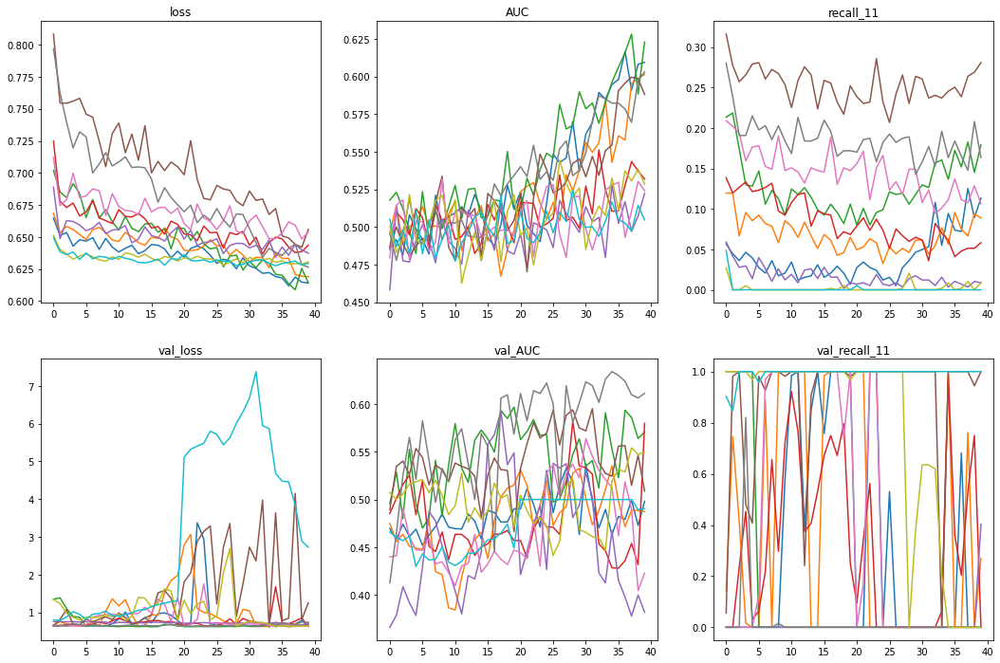

In [23]:
plot_performance(cnn_5_performance)

In [24]:
cnn_6 = keras.wrappers.scikit_learn.KerasClassifier(build_fn = build_cnn, n_units = 4, unit_size = 2, dense_dropout = False,
                                                    conv_dropout = True)

cnn_6_performance = cross_validate(cnn_6, X_train, y_train, K = 10)

Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_108 (Conv2D)          (None, 128, 862, 32)      832       
_________________________________________________________________
max_pooling2d_60 (MaxPooling (None, 64, 431, 32)       0         
_________________________________________________________________
alpha_dropout_58 (AlphaDropo (None, 64, 431, 32)       0         
_________________________________________________________________
conv2d_109 (Conv2D)          (None, 64, 431, 64)       18496     
_________________________________________________________________
alpha_dropout_59 (AlphaDropo (None, 64, 431, 64)       0         
_________________________________________________________________
conv2d_110 (Conv2D)          (None, 64, 431, 64)       36928     
_________________________________________________________________
alpha_dropout_60 (AlphaDropo (None, 64, 431, 64)     

Epoch 28/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.5934 - AUC: 0.6600 - recall_12: 0.1732 - val_loss: 0.6499 - val_AUC: 0.5607 - val_recall_12: 0.0000e+00
Epoch 29/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.5746 - AUC: 0.6994 - recall_12: 0.2762 - val_loss: 0.6829 - val_AUC: 0.5859 - val_recall_12: 0.0000e+00
Epoch 30/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.5621 - AUC: 0.7122 - recall_12: 0.3087 - val_loss: 0.7043 - val_AUC: 0.5937 - val_recall_12: 0.0000e+00
Epoch 31/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.5493 - AUC: 0.7338 - recall_12: 0.3396 - val_loss: 0.6374 - val_AUC: 0.5663 - val_recall_12: 0.0000e+00
Epoch 32/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.5385 - AUC: 0.7487 - recall_12: 0.3619 - val_loss: 0.7439 - val_AUC: 0.5998 - val_recall_12: 0.0000e+00
Epoch 33/40
1800/1800 [==============================] - 20s 11ms

Epoch 2/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6337 - AUC: 0.5052 - recall_14: 0.0000e+00 - val_loss: 0.9042 - val_AUC: 0.3709 - val_recall_14: 1.0000
Epoch 3/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6353 - AUC: 0.4923 - recall_14: 0.0000e+00 - val_loss: 0.9382 - val_AUC: 0.3827 - val_recall_14: 1.0000
Epoch 4/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6346 - AUC: 0.5123 - recall_14: 0.0000e+00 - val_loss: 1.1932 - val_AUC: 0.3756 - val_recall_14: 1.0000
Epoch 5/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6333 - AUC: 0.4923 - recall_14: 0.0000e+00 - val_loss: 0.8484 - val_AUC: 0.4041 - val_recall_14: 1.0000
Epoch 6/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6329 - AUC: 0.4858 - recall_14: 0.0000e+00 - val_loss: 1.0382 - val_AUC: 0.3896 - val_recall_14: 1.0000
Epoch 7/40
1800/1800 [==============================] - 20s 11ms/sampl

1800/1800 [==============================] - 23s 13ms/sample - loss: 0.6483 - AUC: 0.5108 - recall_15: 0.0256 - val_loss: 0.6820 - val_AUC: 0.4737 - val_recall_15: 0.3125
Epoch 2/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6400 - AUC: 0.4926 - recall_15: 0.0085 - val_loss: 0.6431 - val_AUC: 0.5070 - val_recall_15: 0.0625
Epoch 3/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6355 - AUC: 0.4972 - recall_15: 0.0000e+00 - val_loss: 0.6351 - val_AUC: 0.5160 - val_recall_15: 0.0469
Epoch 4/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6376 - AUC: 0.5078 - recall_15: 0.0017 - val_loss: 0.6236 - val_AUC: 0.5615 - val_recall_15: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6411 - AUC: 0.5177 - recall_15: 0.0291 - val_loss: 0.6540 - val_AUC: 0.4698 - val_recall_15: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6377 - 

1800/1800 [==============================] - 23s 13ms/sample - loss: 0.6509 - AUC: 0.5268 - recall_16: 0.0485 - val_loss: 0.6921 - val_AUC: 0.4792 - val_recall_16: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6402 - AUC: 0.4855 - recall_16: 0.0000e+00 - val_loss: 0.6812 - val_AUC: 0.4466 - val_recall_16: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6372 - AUC: 0.4950 - recall_16: 0.0017 - val_loss: 0.6710 - val_AUC: 0.4642 - val_recall_16: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6375 - AUC: 0.5033 - recall_16: 0.0087 - val_loss: 0.6701 - val_AUC: 0.4639 - val_recall_16: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6423 - AUC: 0.4915 - recall_16: 0.0052 - val_loss: 0.6818 - val_AUC: 0.4602 - val_recall_16: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 20s 11ms/sample - los

1800/1800 [==============================] - 23s 13ms/sample - loss: 0.6605 - AUC: 0.4981 - recall_17: 0.0622 - val_loss: 0.9813 - val_AUC: 0.4360 - val_recall_17: 1.0000
Epoch 2/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6505 - AUC: 0.4641 - recall_17: 0.0034 - val_loss: 1.1285 - val_AUC: 0.4384 - val_recall_17: 1.0000
Epoch 3/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6499 - AUC: 0.4900 - recall_17: 0.0218 - val_loss: 1.1910 - val_AUC: 0.4358 - val_recall_17: 1.0000
Epoch 4/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6539 - AUC: 0.4852 - recall_17: 0.0202 - val_loss: 1.2369 - val_AUC: 0.4364 - val_recall_17: 1.0000
Epoch 5/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6496 - AUC: 0.5137 - recall_17: 0.0336 - val_loss: 1.2249 - val_AUC: 0.4169 - val_recall_17: 1.0000
Epoch 6/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6456 - AUC: 0.5174 

1800/1800 [==============================] - 23s 13ms/sample - loss: 0.6473 - AUC: 0.5030 - recall_18: 0.0120 - val_loss: 0.6324 - val_AUC: 0.4671 - val_recall_18: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6464 - AUC: 0.4904 - recall_18: 0.0017 - val_loss: 0.6386 - val_AUC: 0.4524 - val_recall_18: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6367 - AUC: 0.5066 - recall_18: 0.0017 - val_loss: 0.6416 - val_AUC: 0.4930 - val_recall_18: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6318 - AUC: 0.5197 - recall_18: 0.0000e+00 - val_loss: 0.6500 - val_AUC: 0.4564 - val_recall_18: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6353 - AUC: 0.5052 - recall_18: 0.0017 - val_loss: 0.6366 - val_AUC: 0.5127 - val_recall_18: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 20s 11ms/sample - los

1800/1800 [==============================] - 22s 12ms/sample - loss: 0.6485 - AUC: 0.4989 - recall_19: 0.0155 - val_loss: 0.6485 - val_AUC: 0.4680 - val_recall_19: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6425 - AUC: 0.5040 - recall_19: 0.0017 - val_loss: 0.6548 - val_AUC: 0.4576 - val_recall_19: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6355 - AUC: 0.5057 - recall_19: 0.0000e+00 - val_loss: 0.6599 - val_AUC: 0.4223 - val_recall_19: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6362 - AUC: 0.4915 - recall_19: 0.0000e+00 - val_loss: 0.6599 - val_AUC: 0.4147 - val_recall_19: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6369 - AUC: 0.4782 - recall_19: 0.0000e+00 - val_loss: 0.6486 - val_AUC: 0.4398 - val_recall_19: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 20s 11ms/samp

1800/1800 [==============================] - 23s 13ms/sample - loss: 0.6873 - AUC: 0.4880 - recall_20: 0.1399 - val_loss: 0.6979 - val_AUC: 0.4625 - val_recall_20: 0.3492
Epoch 2/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6422 - AUC: 0.5019 - recall_20: 0.0085 - val_loss: 0.6823 - val_AUC: 0.4169 - val_recall_20: 0.1587
Epoch 3/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6528 - AUC: 0.4788 - recall_20: 0.0102 - val_loss: 0.6520 - val_AUC: 0.4303 - val_recall_20: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6447 - AUC: 0.4910 - recall_20: 0.0256 - val_loss: 0.6498 - val_AUC: 0.4534 - val_recall_20: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6469 - AUC: 0.4923 - recall_20: 0.0222 - val_loss: 0.6404 - val_AUC: 0.4411 - val_recall_20: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6411 - 

1800/1800 [==============================] - 22s 12ms/sample - loss: 0.6547 - AUC: 0.5385 - recall_21: 0.1525 - val_loss: 0.8605 - val_AUC: 0.4952 - val_recall_21: 1.0000
Epoch 2/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6353 - AUC: 0.4943 - recall_21: 0.0017 - val_loss: 0.9246 - val_AUC: 0.4850 - val_recall_21: 1.0000
Epoch 3/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6325 - AUC: 0.5081 - recall_21: 0.0000e+00 - val_loss: 0.9490 - val_AUC: 0.4717 - val_recall_21: 1.0000
Epoch 4/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6296 - AUC: 0.5111 - recall_21: 0.0000e+00 - val_loss: 1.0189 - val_AUC: 0.4892 - val_recall_21: 1.0000
Epoch 5/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6323 - AUC: 0.5160 - recall_21: 0.0017 - val_loss: 0.8996 - val_AUC: 0.4854 - val_recall_21: 1.0000
Epoch 6/40
1800/1800 [==============================] - 20s 11ms/sample - loss: 0.6292 - AUC:

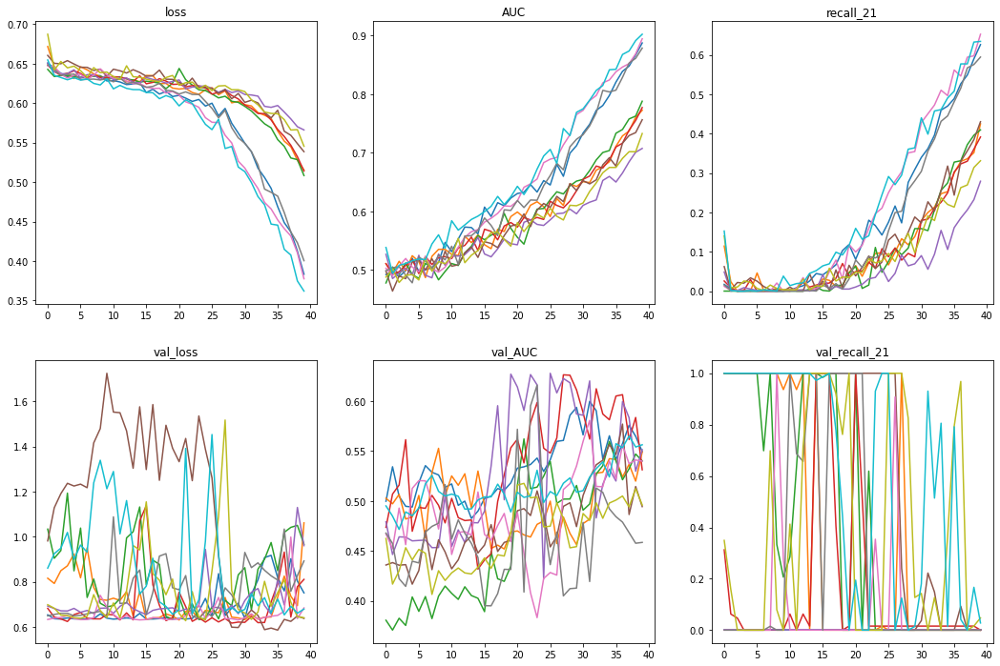

In [25]:
plot_performance(cnn_6_performance)


In [26]:
cnn_7 = keras.wrappers.scikit_learn.KerasClassifier(build_fn = build_cnn, n_units = 4, unit_size = 2, dense_dropout = True,
                                                    conv_dropout = False)

cnn_7_performance = cross_validate(cnn_7, X_train, y_train, K = 10)

Model: "sequential_22"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_198 (Conv2D)          (None, 128, 862, 32)      832       
_________________________________________________________________
max_pooling2d_110 (MaxPoolin (None, 64, 431, 32)       0         
_________________________________________________________________
conv2d_199 (Conv2D)          (None, 64, 431, 64)       18496     
_________________________________________________________________
conv2d_200 (Conv2D)          (None, 64, 431, 64)       36928     
_________________________________________________________________
max_pooling2d_111 (MaxPoolin (None, 32, 215, 64)       0         
_________________________________________________________________
conv2d_201 (Conv2D)          (None, 32, 215, 32)       18464     
_________________________________________________________________
conv2d_202 (Conv2D)          (None, 32, 215, 32)     

Epoch 29/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.5722 - AUC: 0.6908 - recall_22: 0.3208 - val_loss: 0.7561 - val_AUC: 0.5600 - val_recall_22: 0.0758
Epoch 30/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.5680 - AUC: 0.6988 - recall_22: 0.2813 - val_loss: 0.7966 - val_AUC: 0.5377 - val_recall_22: 0.0303
Epoch 31/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.5540 - AUC: 0.7170 - recall_22: 0.3019 - val_loss: 0.7763 - val_AUC: 0.5497 - val_recall_22: 0.1212
Epoch 32/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.5459 - AUC: 0.7284 - recall_22: 0.3413 - val_loss: 0.7914 - val_AUC: 0.5442 - val_recall_22: 0.0758
Epoch 33/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.5254 - AUC: 0.7550 - recall_22: 0.3997 - val_loss: 0.8061 - val_AUC: 0.5639 - val_recall_22: 0.1818
Epoch 34/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.5200 - A

Epoch 17/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6299 - AUC: 0.5479 - recall_23: 0.0222 - val_loss: 0.6382 - val_AUC: 0.5108 - val_recall_23: 0.0000e+00
Epoch 18/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6335 - AUC: 0.5337 - recall_23: 0.0119 - val_loss: 0.6501 - val_AUC: 0.4998 - val_recall_23: 0.0000e+00
Epoch 19/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6302 - AUC: 0.5392 - recall_23: 0.0119 - val_loss: 0.6362 - val_AUC: 0.5385 - val_recall_23: 0.0000e+00
Epoch 20/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6257 - AUC: 0.5610 - recall_23: 0.0171 - val_loss: 0.6353 - val_AUC: 0.5235 - val_recall_23: 0.0000e+00
Epoch 21/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6200 - AUC: 0.5867 - recall_23: 0.0631 - val_loss: 0.6499 - val_AUC: 0.5174 - val_recall_23: 0.0000e+00
Epoch 22/40
1800/1800 [==============================] - 16s 9ms/sampl

1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6697 - AUC: 0.4931 - recall_24: 0.1109 - val_loss: 0.6235 - val_AUC: 0.5322 - val_recall_24: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6578 - AUC: 0.5018 - recall_24: 0.1041 - val_loss: 0.6340 - val_AUC: 0.5253 - val_recall_24: 0.0000e+00
Epoch 7/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6548 - AUC: 0.5131 - recall_24: 0.0939 - val_loss: 0.6227 - val_AUC: 0.5411 - val_recall_24: 0.0000e+00
Epoch 8/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6534 - AUC: 0.5148 - recall_24: 0.0870 - val_loss: 0.6348 - val_AUC: 0.5145 - val_recall_24: 0.0000e+00
Epoch 9/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6532 - AUC: 0.5097 - recall_24: 0.1007 - val_loss: 0.6277 - val_AUC: 0.5232 - val_recall_24: 0.0000e+00
Epoch 10/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6619

1800/1800 [==============================] - 18s 10ms/sample - loss: 0.6839 - AUC: 0.4871 - recall_25: 0.1624 - val_loss: 0.6402 - val_AUC: 0.4527 - val_recall_25: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6563 - AUC: 0.4975 - recall_25: 0.1214 - val_loss: 0.6327 - val_AUC: 0.5385 - val_recall_25: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6586 - AUC: 0.4754 - recall_25: 0.0496 - val_loss: 0.6370 - val_AUC: 0.5729 - val_recall_25: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6521 - AUC: 0.5025 - recall_25: 0.0957 - val_loss: 0.6510 - val_AUC: 0.5200 - val_recall_25: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6455 - AUC: 0.5158 - recall_25: 0.0786 - val_loss: 0.6447 - val_AUC: 0.5769 - val_recall_25: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6525

1800/1800 [==============================] - 18s 10ms/sample - loss: 0.6926 - AUC: 0.5271 - recall_26: 0.1646 - val_loss: 0.7804 - val_AUC: 0.5686 - val_recall_26: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6774 - AUC: 0.5079 - recall_26: 0.1196 - val_loss: 0.8131 - val_AUC: 0.6242 - val_recall_26: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6839 - AUC: 0.4974 - recall_26: 0.1109 - val_loss: 0.7258 - val_AUC: 0.5865 - val_recall_26: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6785 - AUC: 0.4907 - recall_26: 0.0745 - val_loss: 0.8142 - val_AUC: 0.6013 - val_recall_26: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6702 - AUC: 0.5147 - recall_26: 0.0971 - val_loss: 0.6551 - val_AUC: 0.5684 - val_recall_26: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6733

1800/1800 [==============================] - 19s 11ms/sample - loss: 0.7353 - AUC: 0.5063 - recall_27: 0.2756 - val_loss: 0.6352 - val_AUC: 0.5519 - val_recall_27: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7001 - AUC: 0.4983 - recall_27: 0.2034 - val_loss: 0.5813 - val_AUC: 0.5682 - val_recall_27: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6852 - AUC: 0.5128 - recall_27: 0.2269 - val_loss: 0.5809 - val_AUC: 0.5655 - val_recall_27: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6907 - AUC: 0.5099 - recall_27: 0.1681 - val_loss: 0.5761 - val_AUC: 0.6001 - val_recall_27: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6928 - AUC: 0.4915 - recall_27: 0.1815 - val_loss: 0.5788 - val_AUC: 0.5822 - val_recall_27: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6761

1800/1800 [==============================] - 18s 10ms/sample - loss: 0.6878 - AUC: 0.4805 - recall_28: 0.0616 - val_loss: 0.6636 - val_AUC: 0.5296 - val_recall_28: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6807 - AUC: 0.4761 - recall_28: 0.0462 - val_loss: 0.6780 - val_AUC: 0.5953 - val_recall_28: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6625 - AUC: 0.5072 - recall_28: 0.0565 - val_loss: 0.7240 - val_AUC: 0.5368 - val_recall_28: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6544 - AUC: 0.5274 - recall_28: 0.0788 - val_loss: 0.6449 - val_AUC: 0.5405 - val_recall_28: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6576 - AUC: 0.5234 - recall_28: 0.0651 - val_loss: 0.7512 - val_AUC: 0.5471 - val_recall_28: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6536

1800/1800 [==============================] - 19s 11ms/sample - loss: 0.6868 - AUC: 0.4934 - recall_29: 0.0979 - val_loss: 0.6354 - val_AUC: 0.6024 - val_recall_29: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6593 - AUC: 0.5112 - recall_29: 0.0550 - val_loss: 0.6365 - val_AUC: 0.5432 - val_recall_29: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6608 - AUC: 0.5013 - recall_29: 0.0653 - val_loss: 0.6357 - val_AUC: 0.5642 - val_recall_29: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6562 - AUC: 0.4988 - recall_29: 0.0533 - val_loss: 0.6382 - val_AUC: 0.5561 - val_recall_29: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6506 - AUC: 0.5224 - recall_29: 0.0601 - val_loss: 0.6329 - val_AUC: 0.5782 - val_recall_29: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6480

1800/1800 [==============================] - 18s 10ms/sample - loss: 0.7636 - AUC: 0.4740 - recall_30: 0.2338 - val_loss: 0.6725 - val_AUC: 0.5319 - val_recall_30: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7322 - AUC: 0.4942 - recall_30: 0.2184 - val_loss: 0.7140 - val_AUC: 0.5735 - val_recall_30: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7331 - AUC: 0.4887 - recall_30: 0.2338 - val_loss: 0.6185 - val_AUC: 0.5792 - val_recall_30: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7035 - AUC: 0.5407 - recall_30: 0.2577 - val_loss: 0.6679 - val_AUC: 0.5881 - val_recall_30: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7201 - AUC: 0.5036 - recall_30: 0.2150 - val_loss: 0.6212 - val_AUC: 0.5806 - val_recall_30: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7241

1800/1800 [==============================] - 18s 10ms/sample - loss: 0.7756 - AUC: 0.4838 - recall_31: 0.2842 - val_loss: 0.6853 - val_AUC: 0.4485 - val_recall_31: 0.1667
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7090 - AUC: 0.5076 - recall_31: 0.2894 - val_loss: 0.6713 - val_AUC: 0.5225 - val_recall_31: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7281 - AUC: 0.5068 - recall_31: 0.2912 - val_loss: 0.6578 - val_AUC: 0.5610 - val_recall_31: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7185 - AUC: 0.4883 - recall_31: 0.2218 - val_loss: 0.6620 - val_AUC: 0.5684 - val_recall_31: 0.1250
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6961 - AUC: 0.5269 - recall_31: 0.2686 - val_loss: 0.6497 - val_AUC: 0.5730 - val_recall_31: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6746 - AUC: 

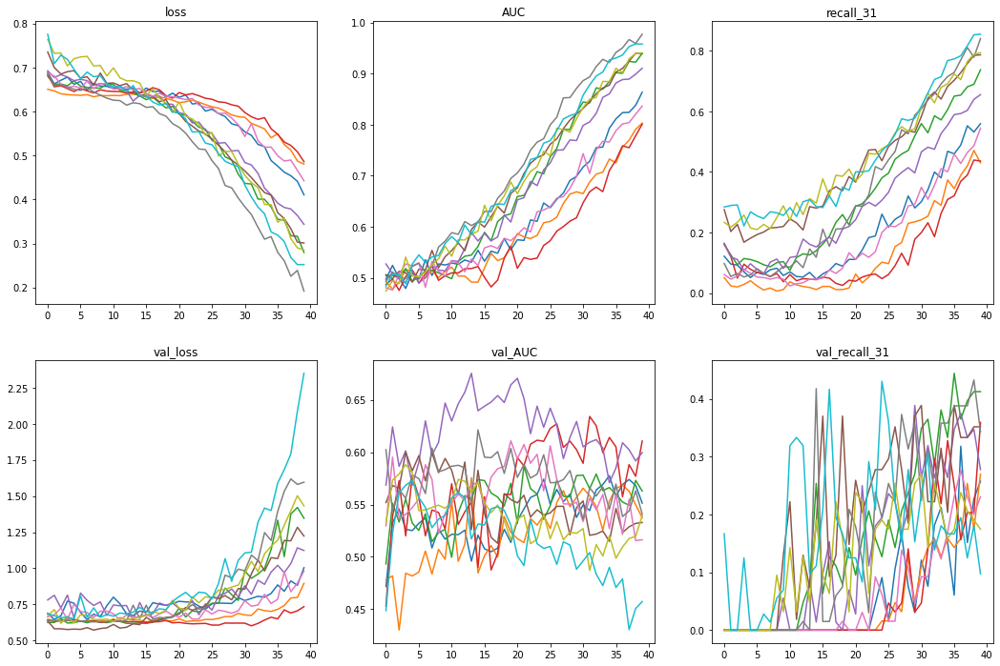

In [27]:
plot_performance(cnn_7_performance)

Evidently, regularisation is not helping a whole bunch with performance. Time to change the model up a lil bit.

In [31]:
cnn_8 = keras.wrappers.scikit_learn.KerasClassifier(build_fn = build_cnn, filters = 64, n_units = 5, unit_size = 2, dense_dropout = False,
                                                    conv_dropout = False)

cnn_8_performance = cross_validate(cnn_8, X_train, y_train, K = 10)

Model: "sequential_35"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_336 (Conv2D)          (None, 128, 862, 64)      1664      
_________________________________________________________________
max_pooling2d_178 (MaxPoolin (None, 64, 431, 64)       0         
_________________________________________________________________
conv2d_337 (Conv2D)          (None, 64, 431, 96)       55392     
_________________________________________________________________
conv2d_338 (Conv2D)          (None, 64, 431, 96)       83040     
_________________________________________________________________
max_pooling2d_179 (MaxPoolin (None, 32, 215, 96)       0         
_________________________________________________________________
conv2d_339 (Conv2D)          (None, 32, 215, 64)       55360     
_________________________________________________________________
conv2d_340 (Conv2D)          (None, 32, 215, 64)     

1800/1800 [==============================] - 29s 16ms/sample - loss: 0.6090 - AUC: 0.6204 - recall_36: 0.1041 - val_loss: 0.6383 - val_AUC: 0.5153 - val_recall_36: 0.0317
Epoch 16/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.6059 - AUC: 0.6300 - recall_36: 0.1433 - val_loss: 0.6510 - val_AUC: 0.5001 - val_recall_36: 0.0476
Epoch 17/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.5887 - AUC: 0.6777 - recall_36: 0.1246 - val_loss: 0.6871 - val_AUC: 0.5137 - val_recall_36: 0.2540
Epoch 18/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.5822 - AUC: 0.6824 - recall_36: 0.2372 - val_loss: 0.6543 - val_AUC: 0.5322 - val_recall_36: 0.0317
Epoch 19/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.5794 - AUC: 0.6881 - recall_36: 0.2133 - val_loss: 0.6678 - val_AUC: 0.5056 - val_recall_36: 0.1587
Epoch 20/40
1800/1800 [==============================] - 30s 16ms/sample - loss: 0.5621 - AUC: 0.

1800/1800 [==============================] - 32s 18ms/sample - loss: 0.6515 - AUC: 0.5291 - recall_38: 0.0735 - val_loss: 0.6619 - val_AUC: 0.5792 - val_recall_38: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.6393 - AUC: 0.5280 - recall_38: 0.0564 - val_loss: 0.6210 - val_AUC: 0.6099 - val_recall_38: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.6347 - AUC: 0.4948 - recall_38: 0.0000e+00 - val_loss: 0.6189 - val_AUC: 0.6291 - val_recall_38: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.6313 - AUC: 0.5406 - recall_38: 0.0000e+00 - val_loss: 0.6393 - val_AUC: 0.6023 - val_recall_38: 0.0156
Epoch 5/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.6313 - AUC: 0.5327 - recall_38: 0.0000e+00 - val_loss: 0.6178 - val_AUC: 0.6110 - val_recall_38: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 29s 16ms/sample -

1800/1800 [==============================] - 32s 18ms/sample - loss: 0.6458 - AUC: 0.4976 - recall_39: 0.0416 - val_loss: 0.6857 - val_AUC: 0.4642 - val_recall_39: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.6357 - AUC: 0.4966 - recall_39: 0.0000e+00 - val_loss: 0.6614 - val_AUC: 0.5535 - val_recall_39: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.6353 - AUC: 0.5090 - recall_39: 0.0000e+00 - val_loss: 0.6528 - val_AUC: 0.5239 - val_recall_39: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.6254 - AUC: 0.5379 - recall_39: 0.0000e+00 - val_loss: 0.6537 - val_AUC: 0.5683 - val_recall_39: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.6268 - AUC: 0.5321 - recall_39: 0.0000e+00 - val_loss: 0.6496 - val_AUC: 0.5851 - val_recall_39: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 29s 16ms/

1800/1800 [==============================] - 32s 18ms/sample - loss: 0.6446 - AUC: 0.5145 - recall_40: 0.0151 - val_loss: 0.5879 - val_AUC: 0.5407 - val_recall_40: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.6381 - AUC: 0.5139 - recall_40: 0.0000e+00 - val_loss: 0.5823 - val_AUC: 0.5919 - val_recall_40: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.6375 - AUC: 0.5011 - recall_40: 0.0000e+00 - val_loss: 0.5809 - val_AUC: 0.5748 - val_recall_40: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.6375 - AUC: 0.5115 - recall_40: 0.0000e+00 - val_loss: 0.5894 - val_AUC: 0.5755 - val_recall_40: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.6359 - AUC: 0.5185 - recall_40: 0.0000e+00 - val_loss: 0.6040 - val_AUC: 0.5279 - val_recall_40: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 29s 16ms/

1800/1800 [==============================] - 32s 18ms/sample - loss: 0.6502 - AUC: 0.5058 - recall_41: 0.0428 - val_loss: 0.6294 - val_AUC: 0.5694 - val_recall_41: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.6320 - AUC: 0.5442 - recall_41: 0.0188 - val_loss: 0.6253 - val_AUC: 0.6082 - val_recall_41: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.6335 - AUC: 0.5263 - recall_41: 0.0017 - val_loss: 0.6337 - val_AUC: 0.5213 - val_recall_41: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.6324 - AUC: 0.5263 - recall_41: 0.0068 - val_loss: 0.6451 - val_AUC: 0.5660 - val_recall_41: 0.0615
Epoch 5/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.6249 - AUC: 0.5676 - recall_41: 0.0171 - val_loss: 0.6220 - val_AUC: 0.5899 - val_recall_41: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.628

1800/1800 [==============================] - 32s 18ms/sample - loss: 0.6528 - AUC: 0.4691 - recall_42: 0.0361 - val_loss: 0.6418 - val_AUC: 0.5505 - val_recall_42: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.6340 - AUC: 0.4885 - recall_42: 0.0000e+00 - val_loss: 0.6596 - val_AUC: 0.5836 - val_recall_42: 0.0299
Epoch 3/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.6353 - AUC: 0.5293 - recall_42: 0.0017 - val_loss: 0.6407 - val_AUC: 0.5412 - val_recall_42: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.6359 - AUC: 0.5156 - recall_42: 0.0000e+00 - val_loss: 0.6368 - val_AUC: 0.5565 - val_recall_42: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.6297 - AUC: 0.5314 - recall_42: 0.0000e+00 - val_loss: 0.6445 - val_AUC: 0.5897 - val_recall_42: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 29s 16ms/sample -

1800/1800 [==============================] - 32s 18ms/sample - loss: 0.6526 - AUC: 0.4924 - recall_43: 0.0358 - val_loss: 0.6247 - val_AUC: 0.4720 - val_recall_43: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.6366 - AUC: 0.5150 - recall_43: 0.0222 - val_loss: 0.6248 - val_AUC: 0.5409 - val_recall_43: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.6335 - AUC: 0.5296 - recall_43: 0.0017 - val_loss: 0.6244 - val_AUC: 0.5295 - val_recall_43: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.6360 - AUC: 0.5473 - recall_43: 0.0478 - val_loss: 0.6498 - val_AUC: 0.5744 - val_recall_43: 0.0159
Epoch 5/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.6414 - AUC: 0.5198 - recall_43: 0.0051 - val_loss: 0.6278 - val_AUC: 0.5718 - val_recall_43: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.631

1800/1800 [==============================] - 33s 18ms/sample - loss: 0.6530 - AUC: 0.5013 - recall_44: 0.0277 - val_loss: 0.6549 - val_AUC: 0.5084 - val_recall_44: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.6284 - AUC: 0.5372 - recall_44: 0.0069 - val_loss: 0.6890 - val_AUC: 0.5131 - val_recall_44: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.6281 - AUC: 0.5311 - recall_44: 0.0000e+00 - val_loss: 0.6729 - val_AUC: 0.4953 - val_recall_44: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.6218 - AUC: 0.5660 - recall_44: 0.0035 - val_loss: 0.6654 - val_AUC: 0.5282 - val_recall_44: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.6262 - AUC: 0.5505 - recall_44: 0.0087 - val_loss: 0.6684 - val_AUC: 0.5221 - val_recall_44: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 29s 16ms/sample - los

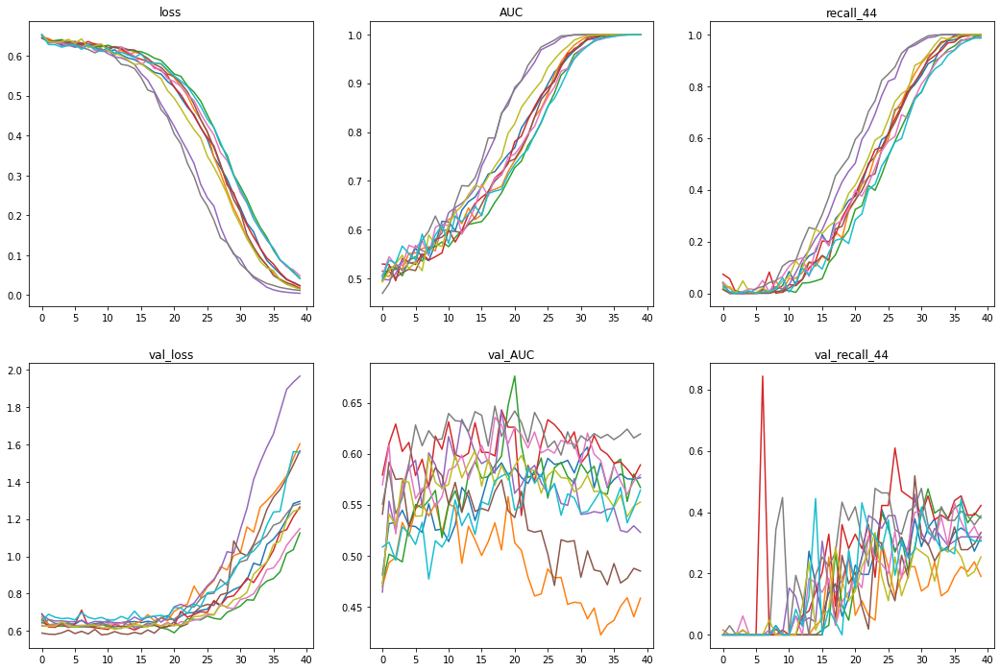

In [32]:
plot_performance(cnn_8_performance)

Time for a simpler model

In [35]:
cnn_9 = keras.wrappers.scikit_learn.KerasClassifier(build_fn = build_cnn, filters = 64, n_units = 4, unit_size = 3, dense_dropout = False,
                                                    conv_dropout = False)

cnn_9_performance = cross_validate(cnn_9, X_train, y_train, K = 10)

Model: "sequential_45"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_446 (Conv2D)          (None, 128, 862, 64)      1664      
_________________________________________________________________
max_pooling2d_238 (MaxPoolin (None, 64, 431, 64)       0         
_________________________________________________________________
conv2d_447 (Conv2D)          (None, 64, 431, 64)       36928     
_________________________________________________________________
conv2d_448 (Conv2D)          (None, 64, 431, 64)       36928     
_________________________________________________________________
conv2d_449 (Conv2D)          (None, 64, 431, 64)       36928     
_________________________________________________________________
max_pooling2d_239 (MaxPoolin (None, 32, 215, 64)       0         
_________________________________________________________________
conv2d_450 (Conv2D)          (None, 32, 215, 32)     

1800/1800 [==============================] - 27s 15ms/sample - loss: 0.5846 - AUC: 0.6782 - recall_46: 0.2031 - val_loss: 0.6337 - val_AUC: 0.5870 - val_recall_46: 0.1429
Epoch 14/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.5706 - AUC: 0.7013 - recall_46: 0.2696 - val_loss: 0.7096 - val_AUC: 0.5602 - val_recall_46: 0.0476
Epoch 15/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.5632 - AUC: 0.7108 - recall_46: 0.2935 - val_loss: 0.6417 - val_AUC: 0.5550 - val_recall_46: 0.0952
Epoch 16/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.5457 - AUC: 0.7400 - recall_46: 0.3242 - val_loss: 0.6363 - val_AUC: 0.6133 - val_recall_46: 0.1270
Epoch 17/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.5206 - AUC: 0.7727 - recall_46: 0.3823 - val_loss: 0.6411 - val_AUC: 0.5843 - val_recall_46: 0.1111
Epoch 18/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.5086 - AUC: 0.

Train on 1800 samples, validate on 200 samples
Epoch 1/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.6715 - AUC: 0.5044 - recall_47: 0.0956 - val_loss: 0.6255 - val_AUC: 0.4813 - val_recall_47: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6365 - AUC: 0.5203 - recall_47: 0.0000e+00 - val_loss: 0.6320 - val_AUC: 0.5174 - val_recall_47: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6355 - AUC: 0.5073 - recall_47: 0.0000e+00 - val_loss: 0.6309 - val_AUC: 0.4791 - val_recall_47: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6317 - AUC: 0.5370 - recall_47: 0.0034 - val_loss: 0.6247 - val_AUC: 0.5393 - val_recall_47: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6333 - AUC: 0.5211 - recall_47: 0.0000e+00 - val_loss: 0.6283 - val_AUC: 0.5269 - val_recall_47: 0.0000e+00
Epoch 6/40


1800/1800 [==============================] - 30s 17ms/sample - loss: 0.6517 - AUC: 0.4764 - recall_48: 0.0205 - val_loss: 0.6270 - val_AUC: 0.5774 - val_recall_48: 0.0156
Epoch 2/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6495 - AUC: 0.4915 - recall_48: 0.0274 - val_loss: 0.6257 - val_AUC: 0.4812 - val_recall_48: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6448 - AUC: 0.5002 - recall_48: 0.0256 - val_loss: 0.6273 - val_AUC: 0.4973 - val_recall_48: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6339 - AUC: 0.5108 - recall_48: 0.0000e+00 - val_loss: 0.6263 - val_AUC: 0.5052 - val_recall_48: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6289 - AUC: 0.5418 - recall_48: 0.0000e+00 - val_loss: 0.6780 - val_AUC: 0.5379 - val_recall_48: 0.3906
Epoch 6/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0

1800/1800 [==============================] - 30s 17ms/sample - loss: 0.6483 - AUC: 0.5114 - recall_49: 0.0191 - val_loss: 0.6527 - val_AUC: 0.5425 - val_recall_49: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6290 - AUC: 0.5239 - recall_49: 0.0000e+00 - val_loss: 0.6527 - val_AUC: 0.5683 - val_recall_49: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6304 - AUC: 0.5027 - recall_49: 0.0000e+00 - val_loss: 0.6595 - val_AUC: 0.5348 - val_recall_49: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6261 - AUC: 0.5328 - recall_49: 0.0000e+00 - val_loss: 0.6484 - val_AUC: 0.5893 - val_recall_49: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6266 - AUC: 0.5382 - recall_49: 0.0000e+00 - val_loss: 0.6591 - val_AUC: 0.5909 - val_recall_49: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 27s 15ms/

1800/1800 [==============================] - 31s 17ms/sample - loss: 0.6429 - AUC: 0.5083 - recall_50: 0.0101 - val_loss: 0.6212 - val_AUC: 0.5474 - val_recall_50: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6453 - AUC: 0.4839 - recall_50: 0.0000e+00 - val_loss: 0.6180 - val_AUC: 0.5961 - val_recall_50: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6379 - AUC: 0.4984 - recall_50: 0.0000e+00 - val_loss: 0.5860 - val_AUC: 0.5492 - val_recall_50: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6390 - AUC: 0.5081 - recall_50: 0.0000e+00 - val_loss: 0.5973 - val_AUC: 0.5920 - val_recall_50: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6380 - AUC: 0.5030 - recall_50: 0.0000e+00 - val_loss: 0.5849 - val_AUC: 0.5585 - val_recall_50: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 27s 15ms/

1800/1800 [==============================] - 30s 17ms/sample - loss: 0.6612 - AUC: 0.4879 - recall_51: 0.0702 - val_loss: 0.6335 - val_AUC: 0.4991 - val_recall_51: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6479 - AUC: 0.5265 - recall_51: 0.0942 - val_loss: 0.7223 - val_AUC: 0.5433 - val_recall_51: 0.8923
Epoch 3/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6448 - AUC: 0.5161 - recall_51: 0.0942 - val_loss: 0.6286 - val_AUC: 0.5422 - val_recall_51: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6347 - AUC: 0.5427 - recall_51: 0.0205 - val_loss: 0.6254 - val_AUC: 0.5614 - val_recall_51: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6288 - AUC: 0.5521 - recall_51: 0.0154 - val_loss: 0.6414 - val_AUC: 0.5413 - val_recall_51: 0.0462
Epoch 6/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6372 - 

1800/1800 [==============================] - 30s 17ms/sample - loss: 0.6480 - AUC: 0.5103 - recall_52: 0.0206 - val_loss: 0.6423 - val_AUC: 0.5524 - val_recall_52: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6338 - AUC: 0.4920 - recall_52: 0.0000e+00 - val_loss: 0.6515 - val_AUC: 0.4867 - val_recall_52: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6316 - AUC: 0.5182 - recall_52: 0.0017 - val_loss: 0.6384 - val_AUC: 0.4986 - val_recall_52: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6310 - AUC: 0.5287 - recall_52: 0.0017 - val_loss: 0.6358 - val_AUC: 0.5581 - val_recall_52: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6297 - AUC: 0.5385 - recall_52: 0.0103 - val_loss: 0.6361 - val_AUC: 0.5189 - val_recall_52: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 27s 15ms/sample - los

1800/1800 [==============================] - 31s 17ms/sample - loss: 0.6479 - AUC: 0.5087 - recall_53: 0.0171 - val_loss: 0.6290 - val_AUC: 0.5235 - val_recall_53: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6396 - AUC: 0.5207 - recall_53: 0.0154 - val_loss: 0.6295 - val_AUC: 0.5481 - val_recall_53: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6346 - AUC: 0.5235 - recall_53: 0.0000e+00 - val_loss: 0.6206 - val_AUC: 0.5485 - val_recall_53: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6330 - AUC: 0.5385 - recall_53: 0.0188 - val_loss: 0.6188 - val_AUC: 0.5685 - val_recall_53: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6265 - AUC: 0.5759 - recall_53: 0.0222 - val_loss: 0.6187 - val_AUC: 0.5820 - val_recall_53: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 27s 15ms/sample - los

1800/1800 [==============================] - 30s 17ms/sample - loss: 0.6696 - AUC: 0.5094 - recall_54: 0.0451 - val_loss: 0.6534 - val_AUC: 0.5375 - val_recall_54: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6280 - AUC: 0.5087 - recall_54: 0.0000e+00 - val_loss: 0.6612 - val_AUC: 0.5665 - val_recall_54: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6302 - AUC: 0.5228 - recall_54: 0.0000e+00 - val_loss: 0.6985 - val_AUC: 0.5643 - val_recall_54: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6358 - AUC: 0.4840 - recall_54: 0.0000e+00 - val_loss: 0.6538 - val_AUC: 0.4853 - val_recall_54: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6292 - AUC: 0.4895 - recall_54: 0.0000e+00 - val_loss: 0.6606 - val_AUC: 0.5272 - val_recall_54: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 27s 15ms/

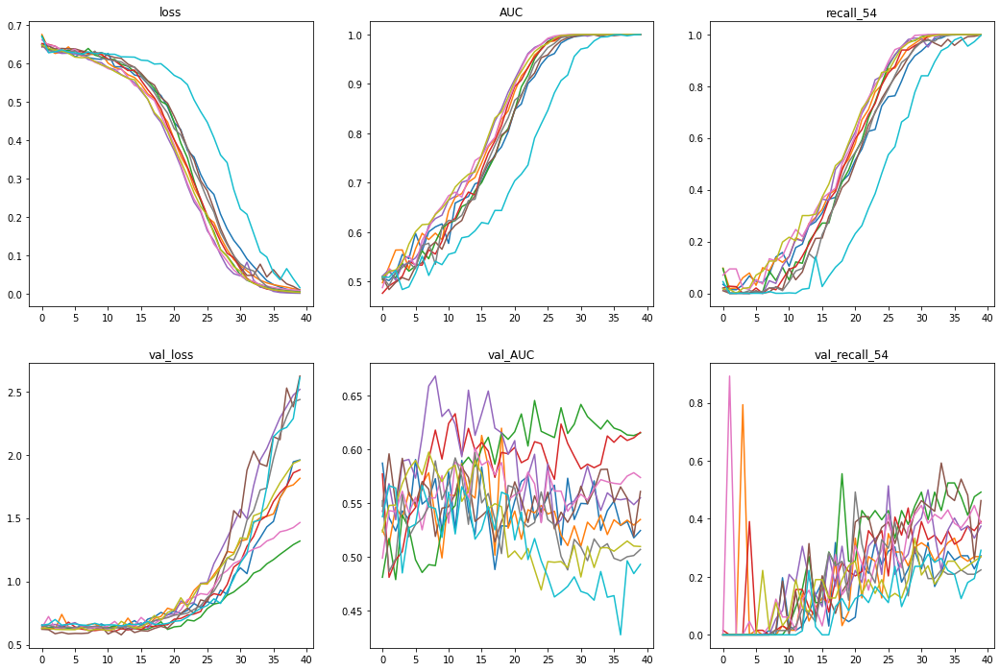

In [36]:
plot_performance(cnn_9_performance)

Back to basics then. If a simpler model can fit the training data well, a more complex model will probably overfit. So, simplify the model until validation performance improves.

In [22]:
cnn_10 = keras.wrappers.scikit_learn.KerasClassifier(build_fn = build_cnn, filters = 64, n_units = 4, unit_size = 3, n_dense = 1, dense_dropout = False,
                                                    conv_dropout = False)

cnn_10_performance = cross_validate(cnn_10, X_train, y_train, K = 10, epochs = 40)

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_104 (Conv2D)          (None, 128, 862, 64)      1664      
_________________________________________________________________
max_pooling2d_40 (MaxPooling (None, 64, 431, 64)       0         
_________________________________________________________________
conv2d_105 (Conv2D)          (None, 64, 431, 64)       36928     
_________________________________________________________________
conv2d_106 (Conv2D)          (None, 64, 431, 64)       36928     
_________________________________________________________________
conv2d_107 (Conv2D)          (None, 64, 431, 64)       36928     
_________________________________________________________________
max_pooling2d_41 (MaxPooling (None, 32, 215, 64)       0         
_________________________________________________________________
conv2d_108 (Conv2D)          (None, 32, 215, 32)      

Epoch 16/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.5475 - AUC: 0.7364 - recall_9: 0.3208 - val_loss: 0.7014 - val_AUC: 0.5006 - val_recall_9: 0.0794
Epoch 17/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.5336 - AUC: 0.7545 - recall_9: 0.4010 - val_loss: 0.6622 - val_AUC: 0.5313 - val_recall_9: 0.1429
Epoch 18/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.5089 - AUC: 0.7867 - recall_9: 0.4215 - val_loss: 0.7124 - val_AUC: 0.5391 - val_recall_9: 0.1905
Epoch 19/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.4903 - AUC: 0.8093 - recall_9: 0.4642 - val_loss: 0.7116 - val_AUC: 0.5654 - val_recall_9: 0.0794
Epoch 20/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.4614 - AUC: 0.8368 - recall_9: 0.5034 - val_loss: 0.7500 - val_AUC: 0.5579 - val_recall_9: 0.1587
Epoch 21/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.4249 - AUC: 

1800/1800 [==============================] - 30s 16ms/sample - loss: 0.6678 - AUC: 0.4884 - recall_11: 0.0735 - val_loss: 0.6413 - val_AUC: 0.4686 - val_recall_11: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6380 - AUC: 0.5228 - recall_11: 0.0000e+00 - val_loss: 0.6309 - val_AUC: 0.5215 - val_recall_11: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6385 - AUC: 0.5254 - recall_11: 0.0000e+00 - val_loss: 0.6349 - val_AUC: 0.5363 - val_recall_11: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6374 - AUC: 0.5351 - recall_11: 0.0598 - val_loss: 0.6255 - val_AUC: 0.5815 - val_recall_11: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6271 - AUC: 0.5652 - recall_11: 0.0137 - val_loss: 0.6172 - val_AUC: 0.5789 - val_recall_11: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 27s 15ms/sample -

1800/1800 [==============================] - 30s 16ms/sample - loss: 0.6855 - AUC: 0.4948 - recall_12: 0.0572 - val_loss: 0.6511 - val_AUC: 0.6405 - val_recall_12: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6427 - AUC: 0.5022 - recall_12: 0.0139 - val_loss: 0.6451 - val_AUC: 0.6450 - val_recall_12: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6407 - AUC: 0.5398 - recall_12: 0.0433 - val_loss: 0.6511 - val_AUC: 0.5715 - val_recall_12: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6306 - AUC: 0.5267 - recall_12: 0.0017 - val_loss: 0.6436 - val_AUC: 0.6326 - val_recall_12: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6236 - AUC: 0.5655 - recall_12: 0.0312 - val_loss: 0.6677 - val_AUC: 0.5993 - val_recall_12: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0

1800/1800 [==============================] - 30s 17ms/sample - loss: 0.6486 - AUC: 0.5131 - recall_13: 0.0639 - val_loss: 0.5896 - val_AUC: 0.5228 - val_recall_13: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6377 - AUC: 0.5035 - recall_13: 0.0000e+00 - val_loss: 0.6033 - val_AUC: 0.5130 - val_recall_13: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6359 - AUC: 0.5123 - recall_13: 0.0000e+00 - val_loss: 0.5874 - val_AUC: 0.5408 - val_recall_13: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6340 - AUC: 0.5191 - recall_13: 0.0017 - val_loss: 0.5946 - val_AUC: 0.5732 - val_recall_13: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6355 - AUC: 0.4957 - recall_13: 0.0017 - val_loss: 0.5936 - val_AUC: 0.5656 - val_recall_13: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 27s 15ms/sample -

1800/1800 [==============================] - 30s 17ms/sample - loss: 0.6774 - AUC: 0.4981 - recall_14: 0.1045 - val_loss: 0.6496 - val_AUC: 0.5347 - val_recall_14: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6402 - AUC: 0.5179 - recall_14: 0.0428 - val_loss: 0.6285 - val_AUC: 0.5503 - val_recall_14: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6405 - AUC: 0.5261 - recall_14: 0.0171 - val_loss: 0.6735 - val_AUC: 0.5087 - val_recall_14: 0.1077
Epoch 4/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6340 - AUC: 0.5389 - recall_14: 0.0120 - val_loss: 0.6611 - val_AUC: 0.5454 - val_recall_14: 0.0615
Epoch 5/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6379 - AUC: 0.5325 - recall_14: 0.0325 - val_loss: 0.6381 - val_AUC: 0.5038 - val_recall_14: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6285 - 

1800/1800 [==============================] - 30s 17ms/sample - loss: 0.6570 - AUC: 0.5048 - recall_15: 0.0773 - val_loss: 0.6410 - val_AUC: 0.5830 - val_recall_15: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6368 - AUC: 0.5239 - recall_15: 0.0000e+00 - val_loss: 0.6808 - val_AUC: 0.5663 - val_recall_15: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6300 - AUC: 0.5454 - recall_15: 0.0155 - val_loss: 0.6347 - val_AUC: 0.5491 - val_recall_15: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6328 - AUC: 0.5368 - recall_15: 0.0052 - val_loss: 0.6590 - val_AUC: 0.5587 - val_recall_15: 0.0597
Epoch 5/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6314 - AUC: 0.5493 - recall_15: 0.0481 - val_loss: 0.6307 - val_AUC: 0.5909 - val_recall_15: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0

1800/1800 [==============================] - 30s 17ms/sample - loss: 0.6561 - AUC: 0.5144 - recall_16: 0.0802 - val_loss: 0.6777 - val_AUC: 0.4852 - val_recall_16: 0.0952
Epoch 2/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6414 - AUC: 0.5183 - recall_16: 0.0239 - val_loss: 0.6285 - val_AUC: 0.5016 - val_recall_16: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6390 - AUC: 0.5231 - recall_16: 0.0137 - val_loss: 0.6328 - val_AUC: 0.4737 - val_recall_16: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6379 - AUC: 0.5158 - recall_16: 0.0239 - val_loss: 0.6355 - val_AUC: 0.5316 - val_recall_16: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6370 - AUC: 0.5145 - recall_16: 0.0017 - val_loss: 0.6414 - val_AUC: 0.4994 - val_recall_16: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.631

1800/1800 [==============================] - 31s 17ms/sample - loss: 0.6632 - AUC: 0.5015 - recall_17: 0.1092 - val_loss: 0.6544 - val_AUC: 0.5369 - val_recall_17: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6299 - AUC: 0.5449 - recall_17: 0.0052 - val_loss: 0.6751 - val_AUC: 0.5092 - val_recall_17: 0.1389
Epoch 3/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6280 - AUC: 0.5466 - recall_17: 0.0191 - val_loss: 0.6546 - val_AUC: 0.5435 - val_recall_17: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6253 - AUC: 0.5640 - recall_17: 0.0347 - val_loss: 0.6606 - val_AUC: 0.5234 - val_recall_17: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.6346 - AUC: 0.5526 - recall_17: 0.0919 - val_loss: 0.7308 - val_AUC: 0.5224 - val_recall_17: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 27s 15ms/sample - loss: 0.619

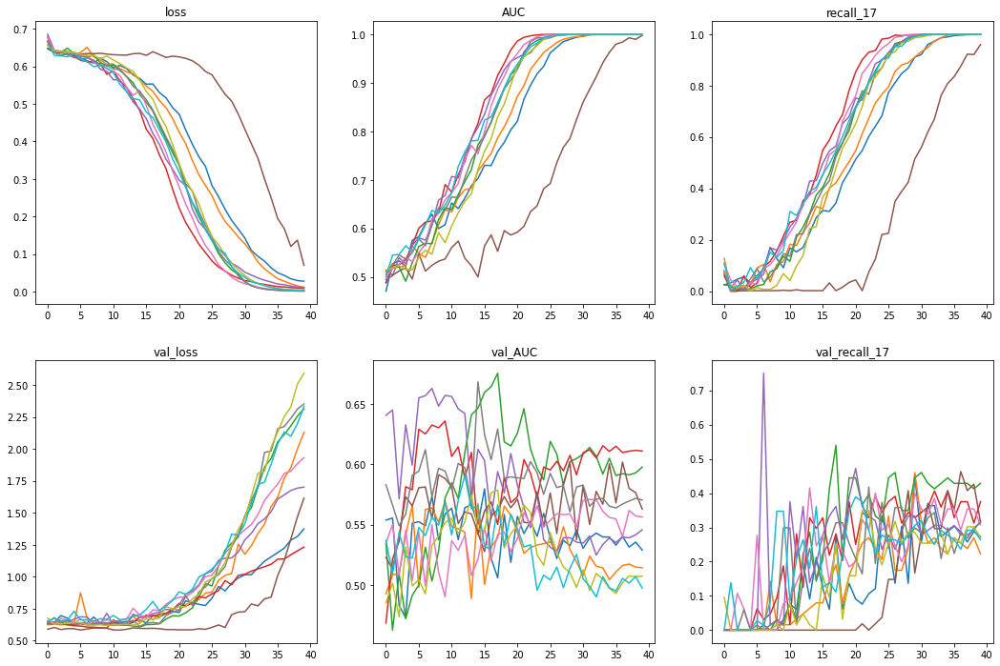

In [23]:
plot_performance(cnn_10_performance)

In [24]:
cnn_11 = keras.wrappers.scikit_learn.KerasClassifier(build_fn = build_cnn, filters = 64, n_units = 4, unit_size = 2, n_dense = 1, dense_dim = 32, dense_dropout = False,
                                                    conv_dropout = False)

cnn_11_performance = cross_validate(cnn_11, X_train, y_train, K = 10, epochs = 40)

Model: "sequential_18"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_234 (Conv2D)          (None, 128, 862, 64)      1664      
_________________________________________________________________
max_pooling2d_90 (MaxPooling (None, 64, 431, 64)       0         
_________________________________________________________________
conv2d_235 (Conv2D)          (None, 64, 431, 64)       36928     
_________________________________________________________________
conv2d_236 (Conv2D)          (None, 64, 431, 64)       36928     
_________________________________________________________________
max_pooling2d_91 (MaxPooling (None, 32, 215, 64)       0         
_________________________________________________________________
conv2d_237 (Conv2D)          (None, 32, 215, 32)       18464     
_________________________________________________________________
conv2d_238 (Conv2D)          (None, 32, 215, 32)     

1800/1800 [==============================] - 23s 13ms/sample - loss: 0.2854 - AUC: 0.9593 - recall_19: 0.7730 - val_loss: 0.8014 - val_AUC: 0.5458 - val_recall_19: 0.1746
Epoch 22/40
1800/1800 [==============================] - 23s 13ms/sample - loss: 0.2404 - AUC: 0.9791 - recall_19: 0.8106 - val_loss: 0.8032 - val_AUC: 0.5490 - val_recall_19: 0.2857
Epoch 23/40
1800/1800 [==============================] - 23s 13ms/sample - loss: 0.2140 - AUC: 0.9836 - recall_19: 0.8652 - val_loss: 0.8505 - val_AUC: 0.5393 - val_recall_19: 0.2381
Epoch 24/40
1800/1800 [==============================] - 23s 13ms/sample - loss: 0.2089 - AUC: 0.9829 - recall_19: 0.8549 - val_loss: 0.9026 - val_AUC: 0.5275 - val_recall_19: 0.2381
Epoch 25/40
1800/1800 [==============================] - 23s 13ms/sample - loss: 0.1656 - AUC: 0.9930 - recall_19: 0.9130 - val_loss: 0.9483 - val_AUC: 0.5381 - val_recall_19: 0.2222
Epoch 26/40
1800/1800 [==============================] - 22s 12ms/sample - loss: 0.1414 - AUC: 0.

1800/1800 [==============================] - 25s 14ms/sample - loss: 0.6841 - AUC: 0.5196 - recall_21: 0.1453 - val_loss: 0.6214 - val_AUC: 0.5595 - val_recall_21: 0.0156
Epoch 2/40
1800/1800 [==============================] - 22s 12ms/sample - loss: 0.6494 - AUC: 0.5180 - recall_21: 0.0462 - val_loss: 0.6218 - val_AUC: 0.6139 - val_recall_21: 0.0156
Epoch 3/40
1800/1800 [==============================] - 22s 12ms/sample - loss: 0.6279 - AUC: 0.5719 - recall_21: 0.0872 - val_loss: 0.6055 - val_AUC: 0.6307 - val_recall_21: 0.0156
Epoch 4/40
1800/1800 [==============================] - 22s 12ms/sample - loss: 0.6139 - AUC: 0.6121 - recall_21: 0.0427 - val_loss: 0.6022 - val_AUC: 0.6232 - val_recall_21: 0.0625
Epoch 5/40
1800/1800 [==============================] - 23s 13ms/sample - loss: 0.5981 - AUC: 0.6526 - recall_21: 0.1094 - val_loss: 0.6313 - val_AUC: 0.5805 - val_recall_21: 0.2344
Epoch 6/40
1800/1800 [==============================] - 23s 13ms/sample - loss: 0.6156 - AUC: 0.6113 

1800/1800 [==============================] - 25s 14ms/sample - loss: 0.6495 - AUC: 0.5196 - recall_22: 0.0243 - val_loss: 0.6411 - val_AUC: 0.5925 - val_recall_22: 0.0278
Epoch 2/40
1800/1800 [==============================] - 22s 12ms/sample - loss: 0.6256 - AUC: 0.5613 - recall_22: 0.0312 - val_loss: 0.7350 - val_AUC: 0.6188 - val_recall_22: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 22s 12ms/sample - loss: 0.6342 - AUC: 0.5463 - recall_22: 0.0693 - val_loss: 0.6270 - val_AUC: 0.6516 - val_recall_22: 0.0278
Epoch 4/40
1800/1800 [==============================] - 22s 12ms/sample - loss: 0.6236 - AUC: 0.5829 - recall_22: 0.1456 - val_loss: 0.6263 - val_AUC: 0.6487 - val_recall_22: 0.0556
Epoch 5/40
1800/1800 [==============================] - 22s 12ms/sample - loss: 0.6123 - AUC: 0.6097 - recall_22: 0.1231 - val_loss: 0.7680 - val_AUC: 0.6644 - val_recall_22: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 22s 12ms/sample - loss: 0.6140 - AUC:

1800/1800 [==============================] - 25s 14ms/sample - loss: 0.6820 - AUC: 0.5154 - recall_23: 0.1546 - val_loss: 0.5850 - val_AUC: 0.5336 - val_recall_23: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 22s 12ms/sample - loss: 0.6377 - AUC: 0.5447 - recall_23: 0.0269 - val_loss: 0.7125 - val_AUC: 0.5927 - val_recall_23: 0.7963
Epoch 3/40
1800/1800 [==============================] - 22s 12ms/sample - loss: 0.6408 - AUC: 0.5537 - recall_23: 0.0941 - val_loss: 0.6191 - val_AUC: 0.5960 - val_recall_23: 0.0556
Epoch 4/40
1800/1800 [==============================] - 23s 13ms/sample - loss: 0.6300 - AUC: 0.5866 - recall_23: 0.1042 - val_loss: 0.5773 - val_AUC: 0.5967 - val_recall_23: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 23s 13ms/sample - loss: 0.6239 - AUC: 0.5943 - recall_23: 0.0941 - val_loss: 0.5797 - val_AUC: 0.5631 - val_recall_23: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 22s 12ms/sample - loss: 0.6113 - 

1800/1800 [==============================] - 26s 14ms/sample - loss: 0.6558 - AUC: 0.5335 - recall_24: 0.1164 - val_loss: 0.6556 - val_AUC: 0.5154 - val_recall_24: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 22s 12ms/sample - loss: 0.6307 - AUC: 0.5469 - recall_24: 0.0257 - val_loss: 0.6776 - val_AUC: 0.5560 - val_recall_24: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 22s 12ms/sample - loss: 0.6362 - AUC: 0.5364 - recall_24: 0.0274 - val_loss: 0.6329 - val_AUC: 0.5545 - val_recall_24: 0.0154
Epoch 4/40
1800/1800 [==============================] - 22s 12ms/sample - loss: 0.6330 - AUC: 0.5526 - recall_24: 0.0753 - val_loss: 0.6460 - val_AUC: 0.5504 - val_recall_24: 0.1846
Epoch 5/40
1800/1800 [==============================] - 23s 13ms/sample - loss: 0.6172 - AUC: 0.6011 - recall_24: 0.0771 - val_loss: 0.6196 - val_AUC: 0.5924 - val_recall_24: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 22s 12ms/sample - loss: 0.6174 - 

1800/1800 [==============================] - 25s 14ms/sample - loss: 0.6773 - AUC: 0.4839 - recall_25: 0.0498 - val_loss: 0.6633 - val_AUC: 0.5811 - val_recall_25: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 23s 13ms/sample - loss: 0.6380 - AUC: 0.5336 - recall_25: 0.0344 - val_loss: 0.6309 - val_AUC: 0.5848 - val_recall_25: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 22s 12ms/sample - loss: 0.6252 - AUC: 0.5745 - recall_25: 0.0481 - val_loss: 0.6898 - val_AUC: 0.5805 - val_recall_25: 0.6567
Epoch 4/40
1800/1800 [==============================] - 22s 12ms/sample - loss: 0.6198 - AUC: 0.5875 - recall_25: 0.0567 - val_loss: 0.6475 - val_AUC: 0.6260 - val_recall_25: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 23s 13ms/sample - loss: 0.6212 - AUC: 0.5878 - recall_25: 0.1340 - val_loss: 0.6154 - val_AUC: 0.6248 - val_recall_25: 0.0149
Epoch 6/40
1800/1800 [==============================] - 23s 13ms/sample - loss: 0.6138 - 

1800/1800 [==============================] - 25s 14ms/sample - loss: 0.6678 - AUC: 0.5055 - recall_26: 0.0751 - val_loss: 0.6271 - val_AUC: 0.5649 - val_recall_26: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 23s 13ms/sample - loss: 0.6412 - AUC: 0.5388 - recall_26: 0.0990 - val_loss: 0.6594 - val_AUC: 0.5320 - val_recall_26: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 22s 12ms/sample - loss: 0.6326 - AUC: 0.5588 - recall_26: 0.0802 - val_loss: 0.6216 - val_AUC: 0.5631 - val_recall_26: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 22s 12ms/sample - loss: 0.6417 - AUC: 0.5533 - recall_26: 0.1416 - val_loss: 0.6474 - val_AUC: 0.5675 - val_recall_26: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 22s 12ms/sample - loss: 0.6203 - AUC: 0.5960 - recall_26: 0.0631 - val_loss: 0.6625 - val_AUC: 0.5973 - val_recall_26: 0.4286
Epoch 6/40
1800/1800 [==============================] - 23s 13ms/sample - loss: 0.629

1800/1800 [==============================] - 25s 14ms/sample - loss: 0.6514 - AUC: 0.5128 - recall_27: 0.0641 - val_loss: 0.6645 - val_AUC: 0.5073 - val_recall_27: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 22s 12ms/sample - loss: 0.6429 - AUC: 0.5351 - recall_27: 0.0641 - val_loss: 0.6583 - val_AUC: 0.5221 - val_recall_27: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 22s 12ms/sample - loss: 0.6160 - AUC: 0.5906 - recall_27: 0.0607 - val_loss: 0.6695 - val_AUC: 0.5537 - val_recall_27: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 22s 12ms/sample - loss: 0.6200 - AUC: 0.5840 - recall_27: 0.1075 - val_loss: 0.6674 - val_AUC: 0.5429 - val_recall_27: 0.0278
Epoch 5/40
1800/1800 [==============================] - 22s 12ms/sample - loss: 0.6126 - AUC: 0.6083 - recall_27: 0.1057 - val_loss: 0.6927 - val_AUC: 0.5707 - val_recall_27: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 22s 12ms/sample - loss: 0.597

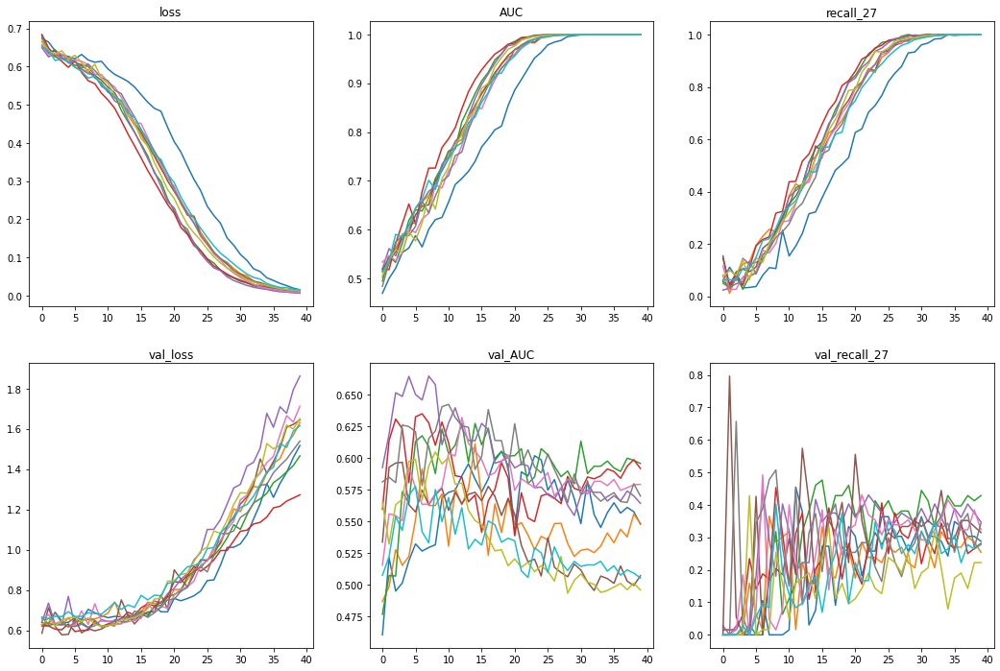

In [25]:
plot_performance(cnn_11_performance)

In [26]:
# filters 64 -> 48, n_dense 2 -> 1
cnn_12 = keras.wrappers.scikit_learn.KerasClassifier(build_fn = build_cnn, filters = 48, n_units = 4, unit_size = 2, n_dense = 1, dense_dim = 16, dense_dropout = False,
                                                    conv_dropout = False)

cnn_12_performance = cross_validate(cnn_12, X_train, y_train, K = 10, epochs = 40)

Model: "sequential_28"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_324 (Conv2D)          (None, 128, 862, 48)      1248      
_________________________________________________________________
max_pooling2d_140 (MaxPoolin (None, 64, 431, 48)       0         
_________________________________________________________________
conv2d_325 (Conv2D)          (None, 64, 431, 64)       27712     
_________________________________________________________________
conv2d_326 (Conv2D)          (None, 64, 431, 64)       36928     
_________________________________________________________________
max_pooling2d_141 (MaxPoolin (None, 32, 215, 64)       0         
_________________________________________________________________
conv2d_327 (Conv2D)          (None, 32, 215, 32)       18464     
_________________________________________________________________
conv2d_328 (Conv2D)          (None, 32, 215, 32)     

1800/1800 [==============================] - 19s 11ms/sample - loss: 0.2718 - AUC: 0.9692 - recall_29: 0.7833 - val_loss: 0.8669 - val_AUC: 0.5339 - val_recall_29: 0.4127
Epoch 22/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.2543 - AUC: 0.9733 - recall_29: 0.8225 - val_loss: 0.8560 - val_AUC: 0.5499 - val_recall_29: 0.2222
Epoch 23/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.2196 - AUC: 0.9836 - recall_29: 0.8413 - val_loss: 0.8877 - val_AUC: 0.5426 - val_recall_29: 0.2222
Epoch 24/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.1969 - AUC: 0.9883 - recall_29: 0.8703 - val_loss: 0.9059 - val_AUC: 0.5466 - val_recall_29: 0.3175
Epoch 25/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.1732 - AUC: 0.9931 - recall_29: 0.9096 - val_loss: 0.9634 - val_AUC: 0.5335 - val_recall_29: 0.3016
Epoch 26/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.1548 - AUC: 0.

1800/1800 [==============================] - 21s 12ms/sample - loss: 0.6679 - AUC: 0.4927 - recall_31: 0.0923 - val_loss: 0.6280 - val_AUC: 0.5580 - val_recall_31: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.6368 - AUC: 0.5166 - recall_31: 0.0017 - val_loss: 0.6193 - val_AUC: 0.5929 - val_recall_31: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.6298 - AUC: 0.5572 - recall_31: 0.0393 - val_loss: 0.6235 - val_AUC: 0.6249 - val_recall_31: 0.0156
Epoch 4/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.6225 - AUC: 0.5772 - recall_31: 0.0427 - val_loss: 0.6178 - val_AUC: 0.6024 - val_recall_31: 0.0156
Epoch 5/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.6171 - AUC: 0.5973 - recall_31: 0.0496 - val_loss: 0.6190 - val_AUC: 0.6207 - val_recall_31: 0.1250
Epoch 6/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.6113 - AUC:

1800/1800 [==============================] - 22s 12ms/sample - loss: 0.6906 - AUC: 0.5029 - recall_32: 0.1265 - val_loss: 0.6614 - val_AUC: 0.5472 - val_recall_32: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.6355 - AUC: 0.5363 - recall_32: 0.0763 - val_loss: 0.6500 - val_AUC: 0.6518 - val_recall_32: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.6347 - AUC: 0.5416 - recall_32: 0.0225 - val_loss: 0.6390 - val_AUC: 0.6449 - val_recall_32: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.6265 - AUC: 0.5585 - recall_32: 0.0433 - val_loss: 0.6411 - val_AUC: 0.6299 - val_recall_32: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.6222 - AUC: 0.5690 - recall_32: 0.0208 - val_loss: 0.6451 - val_AUC: 0.6701 - val_recall_32: 0.4583
Epoch 6/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.613

1800/1800 [==============================] - 21s 12ms/sample - loss: 0.6632 - AUC: 0.5273 - recall_33: 0.0840 - val_loss: 0.5759 - val_AUC: 0.6020 - val_recall_33: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.6417 - AUC: 0.5356 - recall_33: 0.0437 - val_loss: 0.6002 - val_AUC: 0.5644 - val_recall_33: 0.0185
Epoch 3/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.6298 - AUC: 0.5692 - recall_33: 0.0555 - val_loss: 0.5679 - val_AUC: 0.6322 - val_recall_33: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.6251 - AUC: 0.5948 - recall_33: 0.0605 - val_loss: 0.5943 - val_AUC: 0.5818 - val_recall_33: 0.0926
Epoch 5/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.6195 - AUC: 0.6063 - recall_33: 0.0992 - val_loss: 0.5767 - val_AUC: 0.5825 - val_recall_33: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.6122 - 

1800/1800 [==============================] - 22s 12ms/sample - loss: 0.6569 - AUC: 0.5125 - recall_34: 0.0702 - val_loss: 0.6362 - val_AUC: 0.5332 - val_recall_34: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.6412 - AUC: 0.5273 - recall_34: 0.0154 - val_loss: 0.6293 - val_AUC: 0.5437 - val_recall_34: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.6407 - AUC: 0.5176 - recall_34: 0.0274 - val_loss: 0.6276 - val_AUC: 0.5501 - val_recall_34: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.6218 - AUC: 0.5750 - recall_34: 0.0103 - val_loss: 0.6332 - val_AUC: 0.5479 - val_recall_34: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.6187 - AUC: 0.5951 - recall_34: 0.0736 - val_loss: 0.6297 - val_AUC: 0.5481 - val_recall_34: 0.0462
Epoch 6/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.616

1800/1800 [==============================] - 22s 12ms/sample - loss: 0.6570 - AUC: 0.5132 - recall_35: 0.0361 - val_loss: 0.6470 - val_AUC: 0.4724 - val_recall_35: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.6313 - AUC: 0.5593 - recall_35: 0.0687 - val_loss: 0.6357 - val_AUC: 0.5530 - val_recall_35: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.6243 - AUC: 0.5694 - recall_35: 0.0223 - val_loss: 0.6524 - val_AUC: 0.5440 - val_recall_35: 0.0896
Epoch 4/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.6185 - AUC: 0.5977 - recall_35: 0.0842 - val_loss: 0.6301 - val_AUC: 0.5650 - val_recall_35: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.6136 - AUC: 0.6077 - recall_35: 0.0790 - val_loss: 0.6330 - val_AUC: 0.5764 - val_recall_35: 0.0299
Epoch 6/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.6165 - 

1800/1800 [==============================] - 21s 12ms/sample - loss: 0.6546 - AUC: 0.5236 - recall_36: 0.0734 - val_loss: 0.6210 - val_AUC: 0.5478 - val_recall_36: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.6384 - AUC: 0.5311 - recall_36: 0.0222 - val_loss: 0.6213 - val_AUC: 0.5757 - val_recall_36: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.6338 - AUC: 0.5527 - recall_36: 0.0427 - val_loss: 0.6214 - val_AUC: 0.5449 - val_recall_36: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.6185 - AUC: 0.5943 - recall_36: 0.0290 - val_loss: 0.6268 - val_AUC: 0.5843 - val_recall_36: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.6219 - AUC: 0.6006 - recall_36: 0.1570 - val_loss: 0.6348 - val_AUC: 0.5843 - val_recall_36: 0.1746
Epoch 6/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.605

1800/1800 [==============================] - 21s 12ms/sample - loss: 0.6449 - AUC: 0.5148 - recall_37: 0.0693 - val_loss: 0.8936 - val_AUC: 0.5153 - val_recall_37: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.6406 - AUC: 0.5309 - recall_37: 0.0173 - val_loss: 0.6947 - val_AUC: 0.5013 - val_recall_37: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.6257 - AUC: 0.5536 - recall_37: 0.0139 - val_loss: 0.6607 - val_AUC: 0.5246 - val_recall_37: 0.1250
Epoch 4/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.6255 - AUC: 0.5634 - recall_37: 0.0381 - val_loss: 0.6531 - val_AUC: 0.5561 - val_recall_37: 0.0972
Epoch 5/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.6206 - AUC: 0.5781 - recall_37: 0.0745 - val_loss: 0.6534 - val_AUC: 0.5654 - val_recall_37: 0.0278
Epoch 6/40
1800/1800 [==============================] - 19s 11ms/sample - loss: 0.6206 - AUC:

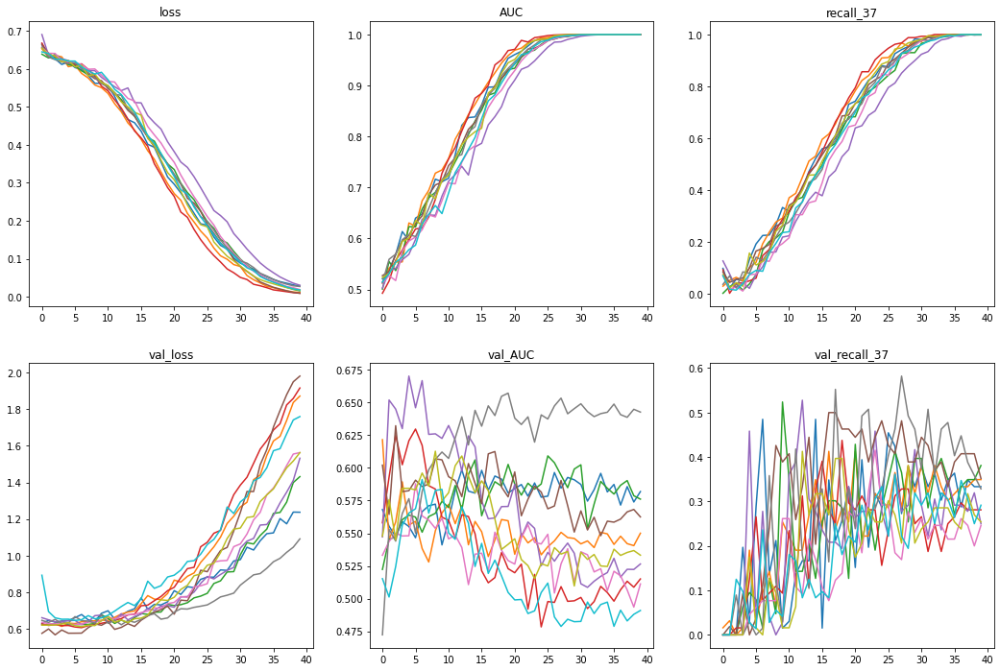

In [27]:
plot_performance(cnn_12_performance)

In [28]:
#n_units 4 -> 3
cnn_13 = keras.wrappers.scikit_learn.KerasClassifier(build_fn = build_cnn, filters = 48, n_units = 3, unit_size = 2, n_dense = 1, dense_dim = 16, dense_dropout = False,
                                                    conv_dropout = False)

cnn_13_performance = cross_validate(cnn_13, X_train, y_train, K = 10, epochs = 40)

Model: "sequential_38"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_414 (Conv2D)          (None, 128, 862, 48)      1248      
_________________________________________________________________
max_pooling2d_190 (MaxPoolin (None, 64, 431, 48)       0         
_________________________________________________________________
conv2d_415 (Conv2D)          (None, 64, 431, 32)       13856     
_________________________________________________________________
conv2d_416 (Conv2D)          (None, 64, 431, 32)       9248      
_________________________________________________________________
max_pooling2d_191 (MaxPoolin (None, 32, 215, 32)       0         
_________________________________________________________________
conv2d_417 (Conv2D)          (None, 32, 215, 32)       9248      
_________________________________________________________________
conv2d_418 (Conv2D)          (None, 32, 215, 32)     

Epoch 26/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.0793 - AUC: 0.9999 - recall_39: 0.9795 - val_loss: 1.0412 - val_AUC: 0.5322 - val_recall_39: 0.2063
Epoch 27/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.0739 - AUC: 0.9998 - recall_39: 0.9881 - val_loss: 1.0933 - val_AUC: 0.5403 - val_recall_39: 0.1905
Epoch 28/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.0590 - AUC: 1.0000 - recall_39: 0.9881 - val_loss: 1.0961 - val_AUC: 0.5282 - val_recall_39: 0.2857
Epoch 29/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.0488 - AUC: 1.0000 - recall_39: 0.9932 - val_loss: 1.1229 - val_AUC: 0.5361 - val_recall_39: 0.2698
Epoch 30/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.0408 - AUC: 1.0000 - recall_39: 0.9983 - val_loss: 1.1558 - val_AUC: 0.5433 - val_recall_39: 0.2063
Epoch 31/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.0351 - A

Epoch 11/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.4709 - AUC: 0.8293 - recall_41: 0.5077 - val_loss: 0.6485 - val_AUC: 0.6161 - val_recall_41: 0.4375
Epoch 12/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.4403 - AUC: 0.8540 - recall_41: 0.5299 - val_loss: 0.6853 - val_AUC: 0.6180 - val_recall_41: 0.5625
Epoch 13/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.3955 - AUC: 0.8975 - recall_41: 0.6137 - val_loss: 0.6551 - val_AUC: 0.6151 - val_recall_41: 0.3281
Epoch 14/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.3511 - AUC: 0.9296 - recall_41: 0.6650 - val_loss: 0.6768 - val_AUC: 0.6049 - val_recall_41: 0.3750
Epoch 15/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.3214 - AUC: 0.9470 - recall_41: 0.7094 - val_loss: 0.7200 - val_AUC: 0.5742 - val_recall_41: 0.2812
Epoch 16/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.2784 - A

1800/1800 [==============================] - 17s 9ms/sample - loss: 0.7057 - AUC: 0.5149 - recall_43: 0.0992 - val_loss: 0.6734 - val_AUC: 0.5207 - val_recall_43: 0.3333
Epoch 2/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6340 - AUC: 0.5798 - recall_43: 0.1765 - val_loss: 0.5882 - val_AUC: 0.5275 - val_recall_43: 0.0185
Epoch 3/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6159 - AUC: 0.6164 - recall_43: 0.1529 - val_loss: 0.5885 - val_AUC: 0.5432 - val_recall_43: 0.0185
Epoch 4/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6163 - AUC: 0.6171 - recall_43: 0.1613 - val_loss: 0.6306 - val_AUC: 0.5469 - val_recall_43: 0.2407
Epoch 5/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.5945 - AUC: 0.6622 - recall_43: 0.2235 - val_loss: 0.6052 - val_AUC: 0.5309 - val_recall_43: 0.1111
Epoch 6/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.5829 - AUC: 0.6891 - reca

1800/1800 [==============================] - 18s 10ms/sample - loss: 0.7620 - AUC: 0.5144 - recall_44: 0.1010 - val_loss: 0.6269 - val_AUC: 0.5394 - val_recall_44: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6335 - AUC: 0.5351 - recall_44: 0.0274 - val_loss: 0.6215 - val_AUC: 0.5966 - val_recall_44: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6237 - AUC: 0.5689 - recall_44: 0.0137 - val_loss: 0.6537 - val_AUC: 0.5973 - val_recall_44: 0.3231
Epoch 4/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6199 - AUC: 0.5957 - recall_44: 0.0925 - val_loss: 0.6262 - val_AUC: 0.6034 - val_recall_44: 0.0923
Epoch 5/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6057 - AUC: 0.6278 - recall_44: 0.1182 - val_loss: 0.6373 - val_AUC: 0.5893 - val_recall_44: 0.2154
Epoch 6/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6080 - AUC: 0.62

1800/1800 [==============================] - 17s 9ms/sample - loss: 0.6941 - AUC: 0.5259 - recall_45: 0.1478 - val_loss: 0.6453 - val_AUC: 0.5673 - val_recall_45: 0.0299
Epoch 2/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6165 - AUC: 0.6054 - recall_45: 0.1186 - val_loss: 0.6352 - val_AUC: 0.5692 - val_recall_45: 0.1940
Epoch 3/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.5986 - AUC: 0.6439 - recall_45: 0.1873 - val_loss: 0.6357 - val_AUC: 0.5919 - val_recall_45: 0.2836
Epoch 4/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.5906 - AUC: 0.6609 - recall_45: 0.2302 - val_loss: 0.6188 - val_AUC: 0.6254 - val_recall_45: 0.1493
Epoch 5/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.5988 - AUC: 0.6562 - recall_45: 0.3093 - val_loss: 0.6628 - val_AUC: 0.5815 - val_recall_45: 0.3881
Epoch 6/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.5558 - AUC: 0.7234 - reca

1800/1800 [==============================] - 17s 9ms/sample - loss: 0.7039 - AUC: 0.5497 - recall_46: 0.1621 - val_loss: 0.6130 - val_AUC: 0.5841 - val_recall_46: 0.0317
Epoch 2/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6391 - AUC: 0.5521 - recall_46: 0.0836 - val_loss: 0.6644 - val_AUC: 0.5691 - val_recall_46: 0.3016
Epoch 3/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6206 - AUC: 0.5994 - recall_46: 0.1451 - val_loss: 0.6608 - val_AUC: 0.5689 - val_recall_46: 0.4127
Epoch 4/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6137 - AUC: 0.6157 - recall_46: 0.1314 - val_loss: 0.6332 - val_AUC: 0.5667 - val_recall_46: 0.1746
Epoch 5/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.5939 - AUC: 0.6571 - recall_46: 0.1997 - val_loss: 0.6170 - val_AUC: 0.5914 - val_recall_46: 0.1429
Epoch 6/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.5858 - AUC: 0.6740 - reca

1800/1800 [==============================] - 17s 9ms/sample - loss: 0.7009 - AUC: 0.5212 - recall_47: 0.1404 - val_loss: 0.6551 - val_AUC: 0.5419 - val_recall_47: 0.0556
Epoch 2/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6243 - AUC: 0.5722 - recall_47: 0.0520 - val_loss: 0.6570 - val_AUC: 0.5358 - val_recall_47: 0.0278
Epoch 3/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6132 - AUC: 0.6039 - recall_47: 0.1057 - val_loss: 0.6535 - val_AUC: 0.5571 - val_recall_47: 0.1389
Epoch 4/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6065 - AUC: 0.6233 - recall_47: 0.1386 - val_loss: 0.6562 - val_AUC: 0.5621 - val_recall_47: 0.1944
Epoch 5/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6067 - AUC: 0.6282 - recall_47: 0.1906 - val_loss: 0.6564 - val_AUC: 0.5847 - val_recall_47: 0.0694
Epoch 6/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.5809 - AUC: 0.6797 - reca

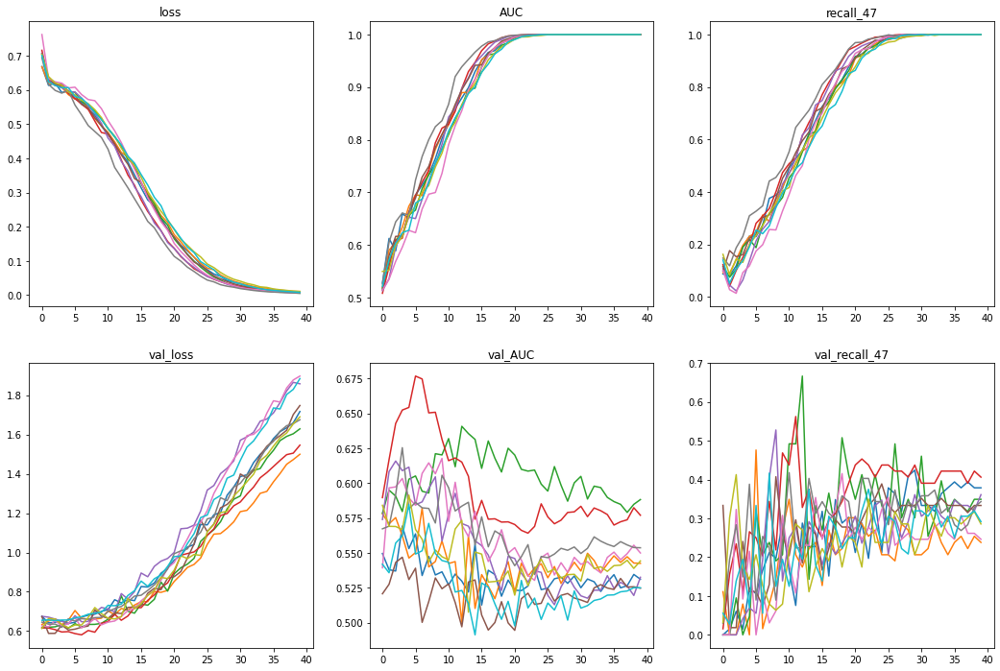

In [29]:
plot_performance(cnn_13_performance)

In [30]:
# dense_dim 16 -> 12
cnn_14 = keras.wrappers.scikit_learn.KerasClassifier(build_fn = build_cnn, filters = 48, n_units = 3, unit_size = 2, n_dense = 1, dense_dim = 12, dense_dropout = False,
                                                    conv_dropout = False)

cnn_14_performance = cross_validate(cnn_14, X_train, y_train, K = 10, epochs = 40)

Model: "sequential_48"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_484 (Conv2D)          (None, 128, 862, 48)      1248      
_________________________________________________________________
max_pooling2d_230 (MaxPoolin (None, 64, 431, 48)       0         
_________________________________________________________________
conv2d_485 (Conv2D)          (None, 64, 431, 32)       13856     
_________________________________________________________________
conv2d_486 (Conv2D)          (None, 64, 431, 32)       9248      
_________________________________________________________________
max_pooling2d_231 (MaxPoolin (None, 32, 215, 32)       0         
_________________________________________________________________
conv2d_487 (Conv2D)          (None, 32, 215, 32)       9248      
_________________________________________________________________
conv2d_488 (Conv2D)          (None, 32, 215, 32)     

Epoch 34/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.0111 - AUC: 1.0000 - recall_48: 1.0000 - val_loss: 1.5505 - val_AUC: 0.6253 - val_recall_48: 0.4394
Epoch 35/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.0086 - AUC: 1.0000 - recall_48: 1.0000 - val_loss: 1.5293 - val_AUC: 0.6180 - val_recall_48: 0.3636
Epoch 36/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.0071 - AUC: 1.0000 - recall_48: 1.0000 - val_loss: 1.5827 - val_AUC: 0.6108 - val_recall_48: 0.3636
Epoch 37/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.0061 - AUC: 1.0000 - recall_48: 1.0000 - val_loss: 1.6384 - val_AUC: 0.6127 - val_recall_48: 0.4091
Epoch 38/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.0052 - AUC: 1.0000 - recall_48: 1.0000 - val_loss: 1.6861 - val_AUC: 0.6091 - val_recall_48: 0.3485
Epoch 39/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.0046 - A

Epoch 19/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.2329 - AUC: 0.9812 - recall_50: 0.8447 - val_loss: 0.7211 - val_AUC: 0.6324 - val_recall_50: 0.3333
Epoch 20/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.1971 - AUC: 0.9917 - recall_50: 0.8840 - val_loss: 0.7350 - val_AUC: 0.6495 - val_recall_50: 0.4444
Epoch 21/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.1636 - AUC: 0.9954 - recall_50: 0.9249 - val_loss: 0.7939 - val_AUC: 0.6169 - val_recall_50: 0.4286
Epoch 22/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.1378 - AUC: 0.9980 - recall_50: 0.9505 - val_loss: 0.7835 - val_AUC: 0.6386 - val_recall_50: 0.3016
Epoch 23/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.1204 - AUC: 0.9985 - recall_50: 0.9522 - val_loss: 0.8559 - val_AUC: 0.6072 - val_recall_50: 0.3175
Epoch 24/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.0984 - A

Epoch 12/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.5142 - AUC: 0.7825 - recall_51: 0.3932 - val_loss: 0.6332 - val_AUC: 0.6058 - val_recall_51: 0.3594
Epoch 13/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.4762 - AUC: 0.8199 - recall_51: 0.4701 - val_loss: 0.6615 - val_AUC: 0.6048 - val_recall_51: 0.4375
Epoch 14/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.4442 - AUC: 0.8541 - recall_51: 0.5162 - val_loss: 0.6634 - val_AUC: 0.5844 - val_recall_51: 0.2969
Epoch 15/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.4157 - AUC: 0.8764 - recall_51: 0.5795 - val_loss: 0.7162 - val_AUC: 0.5701 - val_recall_51: 0.4062
Epoch 16/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.3806 - AUC: 0.9049 - recall_51: 0.5966 - val_loss: 0.6940 - val_AUC: 0.5743 - val_recall_51: 0.2500
Epoch 17/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.3547 - A

1800/1800 [==============================] - 17s 9ms/sample - loss: 0.6679 - AUC: 0.5262 - recall_53: 0.1227 - val_loss: 0.6272 - val_AUC: 0.5731 - val_recall_53: 0.1111
Epoch 2/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6347 - AUC: 0.5657 - recall_53: 0.0941 - val_loss: 0.6427 - val_AUC: 0.5745 - val_recall_53: 0.2037
Epoch 3/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6191 - AUC: 0.6077 - recall_53: 0.0655 - val_loss: 0.5807 - val_AUC: 0.5691 - val_recall_53: 0.0185
Epoch 4/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6098 - AUC: 0.6317 - recall_53: 0.1076 - val_loss: 0.6368 - val_AUC: 0.5707 - val_recall_53: 0.2593
Epoch 5/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.5878 - AUC: 0.6769 - recall_53: 0.2252 - val_loss: 0.5970 - val_AUC: 0.5470 - val_recall_53: 0.0556
Epoch 6/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.5771 - AUC: 0.6963 - reca

1800/1800 [==============================] - 17s 9ms/sample - loss: 0.6504 - AUC: 0.5312 - recall_54: 0.0411 - val_loss: 0.6499 - val_AUC: 0.5361 - val_recall_54: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6338 - AUC: 0.5431 - recall_54: 0.0274 - val_loss: 0.6320 - val_AUC: 0.5515 - val_recall_54: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6290 - AUC: 0.5642 - recall_54: 0.0531 - val_loss: 0.6332 - val_AUC: 0.5851 - val_recall_54: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6051 - AUC: 0.6335 - recall_54: 0.0753 - val_loss: 0.6221 - val_AUC: 0.5770 - val_recall_54: 0.0923
Epoch 5/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.5962 - AUC: 0.6568 - recall_54: 0.1490 - val_loss: 0.6218 - val_AUC: 0.5778 - val_recall_54: 0.0308
Epoch 6/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.5955 - AUC: 0

1800/1800 [==============================] - 17s 9ms/sample - loss: 0.6876 - AUC: 0.5209 - recall_55: 0.0945 - val_loss: 0.7735 - val_AUC: 0.4583 - val_recall_55: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6320 - AUC: 0.5704 - recall_55: 0.0653 - val_loss: 0.7584 - val_AUC: 0.5542 - val_recall_55: 0.8955
Epoch 3/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6372 - AUC: 0.5650 - recall_55: 0.1478 - val_loss: 0.6514 - val_AUC: 0.5599 - val_recall_55: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6097 - AUC: 0.6239 - recall_55: 0.0842 - val_loss: 0.6517 - val_AUC: 0.5697 - val_recall_55: 0.2388
Epoch 5/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6050 - AUC: 0.6341 - recall_55: 0.1375 - val_loss: 0.6328 - val_AUC: 0.5869 - val_recall_55: 0.0597
Epoch 6/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.5851 - AUC: 0.671

1800/1800 [==============================] - 18s 10ms/sample - loss: 0.6624 - AUC: 0.4992 - recall_56: 0.0444 - val_loss: 0.6225 - val_AUC: 0.5836 - val_recall_56: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6299 - AUC: 0.5417 - recall_56: 0.0000e+00 - val_loss: 0.6189 - val_AUC: 0.5907 - val_recall_56: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6296 - AUC: 0.5366 - recall_56: 0.0000e+00 - val_loss: 0.6215 - val_AUC: 0.5956 - val_recall_56: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6298 - AUC: 0.5446 - recall_56: 0.0000e+00 - val_loss: 0.6221 - val_AUC: 0.5983 - val_recall_56: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6268 - AUC: 0.5562 - recall_56: 0.0017 - val_loss: 0.6142 - val_AUC: 0.6071 - val_recall_56: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 15s 8ms/sample - 

1800/1800 [==============================] - 17s 10ms/sample - loss: 0.6905 - AUC: 0.5175 - recall_57: 0.0607 - val_loss: 0.6551 - val_AUC: 0.5456 - val_recall_57: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6258 - AUC: 0.5717 - recall_57: 0.0745 - val_loss: 0.6489 - val_AUC: 0.5639 - val_recall_57: 0.0139
Epoch 3/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6159 - AUC: 0.5915 - recall_57: 0.0832 - val_loss: 0.6647 - val_AUC: 0.5780 - val_recall_57: 0.0139
Epoch 4/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.5990 - AUC: 0.6413 - recall_57: 0.1300 - val_loss: 0.6475 - val_AUC: 0.5777 - val_recall_57: 0.0972
Epoch 5/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.5898 - AUC: 0.6607 - recall_57: 0.2097 - val_loss: 0.6539 - val_AUC: 0.5758 - val_recall_57: 0.1528
Epoch 6/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.5849 - AUC: 0.6684 -

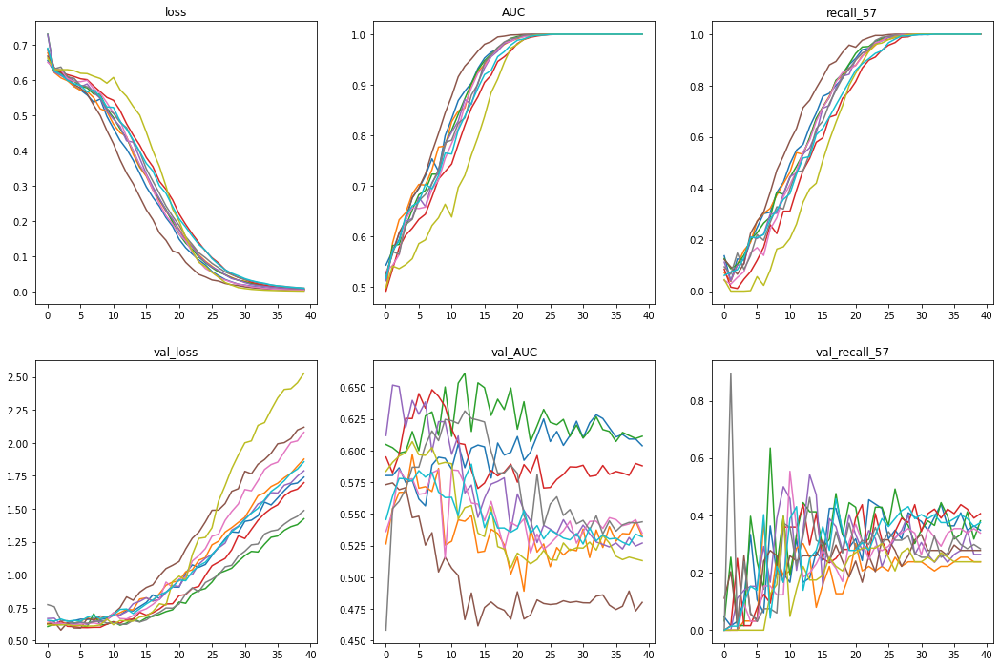

In [31]:
plot_performance(cnn_14_performance)

In [20]:
# n_dense 12 -> 8
cnn_15 = keras.wrappers.scikit_learn.KerasClassifier(build_fn = build_cnn, filters = 48, n_units = 3, unit_size = 2, n_dense = 1, dense_dim = 8, dense_dropout = False,
                                                    conv_dropout = False)

cnn_15_performance = cross_validate(cnn_15, X_train, y_train, K = 10, epochs = 40)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 128, 862, 48)      1248      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 64, 431, 48)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 64, 431, 32)       13856     
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 64, 431, 32)       9248      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 32, 215, 32)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 32, 215, 32)       9248      
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 32, 215, 32)       9

Epoch 35/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.0190 - AUC: 1.0000 - recall: 1.0000 - val_loss: 1.4689 - val_AUC: 0.6051 - val_recall: 0.3636
Epoch 36/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.0158 - AUC: 1.0000 - recall: 1.0000 - val_loss: 1.5169 - val_AUC: 0.6032 - val_recall: 0.3485
Epoch 37/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.0136 - AUC: 1.0000 - recall: 1.0000 - val_loss: 1.5926 - val_AUC: 0.5964 - val_recall: 0.3485
Epoch 38/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.0112 - AUC: 1.0000 - recall: 1.0000 - val_loss: 1.6261 - val_AUC: 0.6012 - val_recall: 0.3333
Epoch 39/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.0095 - AUC: 1.0000 - recall: 1.0000 - val_loss: 1.6722 - val_AUC: 0.6016 - val_recall: 0.3333
Epoch 40/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.0082 - AUC: 1.0000 - recall: 1.0000 - 

1800/1800 [==============================] - 15s 8ms/sample - loss: 0.1818 - AUC: 0.9883 - recall_2: 0.8618 - val_loss: 0.9410 - val_AUC: 0.6003 - val_recall_2: 0.4127
Epoch 22/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.1449 - AUC: 0.9937 - recall_2: 0.9164 - val_loss: 0.9978 - val_AUC: 0.6021 - val_recall_2: 0.3492
Epoch 23/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.1212 - AUC: 0.9969 - recall_2: 0.9386 - val_loss: 1.1128 - val_AUC: 0.6139 - val_recall_2: 0.5079
Epoch 24/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.0969 - AUC: 0.9986 - recall_2: 0.9573 - val_loss: 1.1458 - val_AUC: 0.6090 - val_recall_2: 0.4603
Epoch 25/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.0759 - AUC: 0.9996 - recall_2: 0.9778 - val_loss: 1.2814 - val_AUC: 0.6049 - val_recall_2: 0.5079
Epoch 26/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.0593 - AUC: 0.9999 - recall_2:

Epoch 14/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.5080 - AUC: 0.7918 - recall_3: 0.4034 - val_loss: 0.6606 - val_AUC: 0.5719 - val_recall_3: 0.3281
Epoch 15/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.4778 - AUC: 0.8192 - recall_3: 0.4872 - val_loss: 0.6412 - val_AUC: 0.5938 - val_recall_3: 0.2812
Epoch 16/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.4365 - AUC: 0.8585 - recall_3: 0.5333 - val_loss: 0.6965 - val_AUC: 0.5829 - val_recall_3: 0.4062
Epoch 17/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.4035 - AUC: 0.8788 - recall_3: 0.6137 - val_loss: 0.7304 - val_AUC: 0.5436 - val_recall_3: 0.2969
Epoch 18/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.3572 - AUC: 0.9138 - recall_3: 0.6786 - val_loss: 0.7823 - val_AUC: 0.5278 - val_recall_3: 0.1875
Epoch 19/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.3028 - AUC: 0.9464

Epoch 7/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.5876 - AUC: 0.6635 - recall_4: 0.2218 - val_loss: 0.6434 - val_AUC: 0.6189 - val_recall_4: 0.3194
Epoch 8/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.5635 - AUC: 0.7025 - recall_4: 0.2808 - val_loss: 0.6809 - val_AUC: 0.5871 - val_recall_4: 0.1111
Epoch 9/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.5353 - AUC: 0.7496 - recall_4: 0.3397 - val_loss: 0.6845 - val_AUC: 0.5816 - val_recall_4: 0.3472
Epoch 10/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.5046 - AUC: 0.7875 - recall_4: 0.4021 - val_loss: 0.6979 - val_AUC: 0.5930 - val_recall_4: 0.3056
Epoch 11/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.4684 - AUC: 0.8263 - recall_4: 0.4610 - val_loss: 0.8129 - val_AUC: 0.5144 - val_recall_4: 0.0556
Epoch 12/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.4529 - AUC: 0.8385 - 

1800/1800 [==============================] - 17s 10ms/sample - loss: 0.6417 - AUC: 0.5216 - recall_5: 0.0050 - val_loss: 0.6221 - val_AUC: 0.5893 - val_recall_5: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6358 - AUC: 0.5488 - recall_5: 0.0017 - val_loss: 0.5883 - val_AUC: 0.6016 - val_recall_5: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6235 - AUC: 0.5978 - recall_5: 0.0050 - val_loss: 0.5773 - val_AUC: 0.5826 - val_recall_5: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6266 - AUC: 0.5857 - recall_5: 0.0605 - val_loss: 0.5824 - val_AUC: 0.6019 - val_recall_5: 0.0185
Epoch 5/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6153 - AUC: 0.6168 - recall_5: 0.0689 - val_loss: 0.6182 - val_AUC: 0.5811 - val_recall_5: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6049 - AUC: 0.6516

1800/1800 [==============================] - 17s 10ms/sample - loss: 0.6481 - AUC: 0.5337 - recall_6: 0.0651 - val_loss: 0.6208 - val_AUC: 0.5965 - val_recall_6: 0.0769
Epoch 2/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6185 - AUC: 0.5953 - recall_6: 0.0822 - val_loss: 0.6582 - val_AUC: 0.6162 - val_recall_6: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6221 - AUC: 0.5943 - recall_6: 0.1216 - val_loss: 0.6158 - val_AUC: 0.6165 - val_recall_6: 0.2154
Epoch 4/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6116 - AUC: 0.6155 - recall_6: 0.1644 - val_loss: 0.6376 - val_AUC: 0.5924 - val_recall_6: 0.0308
Epoch 5/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.5947 - AUC: 0.6492 - recall_6: 0.1952 - val_loss: 0.6223 - val_AUC: 0.6082 - val_recall_6: 0.0769
Epoch 6/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.5832 - AUC: 0.6759 - recall_6:

1800/1800 [==============================] - 18s 10ms/sample - loss: 0.6881 - AUC: 0.4995 - recall_7: 0.0601 - val_loss: 0.6429 - val_AUC: 0.5237 - val_recall_7: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6254 - AUC: 0.5623 - recall_7: 0.0344 - val_loss: 0.6324 - val_AUC: 0.5618 - val_recall_7: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6225 - AUC: 0.5753 - recall_7: 0.0361 - val_loss: 0.6450 - val_AUC: 0.5371 - val_recall_7: 0.1045
Epoch 4/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6128 - AUC: 0.6116 - recall_7: 0.0395 - val_loss: 0.6296 - val_AUC: 0.5732 - val_recall_7: 0.0299
Epoch 5/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6086 - AUC: 0.6247 - recall_7: 0.0928 - val_loss: 0.6312 - val_AUC: 0.5858 - val_recall_7: 0.1194
Epoch 6/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6109 - AUC: 0.6213 - recal

1800/1800 [==============================] - 17s 10ms/sample - loss: 0.6673 - AUC: 0.5065 - recall_8: 0.0836 - val_loss: 0.6220 - val_AUC: 0.5456 - val_recall_8: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6196 - AUC: 0.5904 - recall_8: 0.0171 - val_loss: 0.6145 - val_AUC: 0.5876 - val_recall_8: 0.0159
Epoch 3/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6121 - AUC: 0.6070 - recall_8: 0.0904 - val_loss: 0.6143 - val_AUC: 0.5790 - val_recall_8: 0.0317
Epoch 4/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6120 - AUC: 0.6169 - recall_8: 0.1263 - val_loss: 0.6134 - val_AUC: 0.5740 - val_recall_8: 0.0476
Epoch 5/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6191 - AUC: 0.6101 - recall_8: 0.1911 - val_loss: 0.6147 - val_AUC: 0.5727 - val_recall_8: 0.0476
Epoch 6/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.5892 - AUC: 0.6699 - recall_8:

1800/1800 [==============================] - 17s 10ms/sample - loss: 0.6733 - AUC: 0.5246 - recall_9: 0.0485 - val_loss: 0.6699 - val_AUC: 0.6003 - val_recall_9: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6342 - AUC: 0.5304 - recall_9: 0.0243 - val_loss: 0.6435 - val_AUC: 0.5905 - val_recall_9: 0.0139
Epoch 3/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6198 - AUC: 0.5848 - recall_9: 0.0745 - val_loss: 0.6729 - val_AUC: 0.5847 - val_recall_9: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6108 - AUC: 0.6078 - recall_9: 0.0953 - val_loss: 0.6505 - val_AUC: 0.5409 - val_recall_9: 0.0556
Epoch 5/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6062 - AUC: 0.6194 - recall_9: 0.1109 - val_loss: 0.6564 - val_AUC: 0.5611 - val_recall_9: 0.1944
Epoch 6/40
1800/1800 [==============================] - 15s 8ms/sample - loss: 0.5859 - AUC: 0.6674 - recal

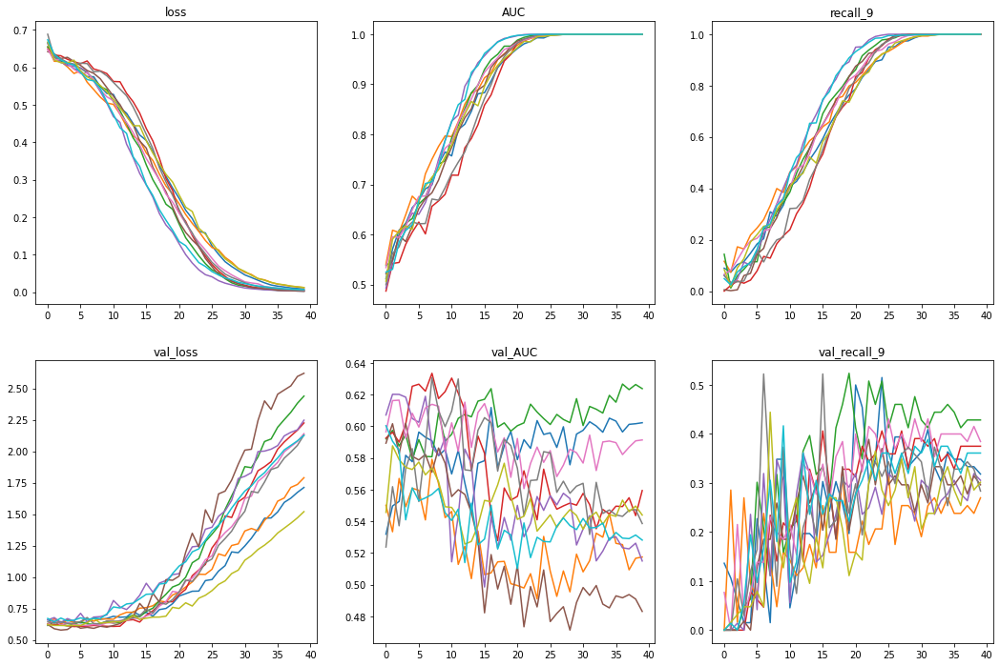

In [21]:
plot_performance(cnn_15_performance)

In [24]:
# filters 48 -> 32, n_units 3 -> 4
cnn_16 = keras.wrappers.scikit_learn.KerasClassifier(build_fn = build_cnn, filters = 32, n_units = 4, unit_size = 2, n_dense = 1, 
                                                     dense_dim = 8, dense_dropout = False, conv_dropout = False)

cnn_16_performance = cross_validate(cnn_16, X_train, y_train, K = 10, epochs = 40)

Model: "sequential_20"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_140 (Conv2D)          (None, 128, 862, 32)      832       
_________________________________________________________________
max_pooling2d_80 (MaxPooling (None, 64, 431, 32)       0         
_________________________________________________________________
conv2d_141 (Conv2D)          (None, 64, 431, 64)       18496     
_________________________________________________________________
conv2d_142 (Conv2D)          (None, 64, 431, 64)       36928     
_________________________________________________________________
max_pooling2d_81 (MaxPooling (None, 32, 215, 64)       0         
_________________________________________________________________
conv2d_143 (Conv2D)          (None, 32, 215, 32)       18464     
_________________________________________________________________
conv2d_144 (Conv2D)          (None, 32, 215, 32)     

1800/1800 [==============================] - 16s 9ms/sample - loss: 0.3270 - AUC: 0.9391 - recall_21: 0.7031 - val_loss: 0.7970 - val_AUC: 0.5466 - val_recall_21: 0.2381
Epoch 22/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.3086 - AUC: 0.9501 - recall_21: 0.7082 - val_loss: 0.7999 - val_AUC: 0.5485 - val_recall_21: 0.3651
Epoch 23/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.2802 - AUC: 0.9622 - recall_21: 0.7594 - val_loss: 0.8049 - val_AUC: 0.5647 - val_recall_21: 0.3492
Epoch 24/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.2638 - AUC: 0.9694 - recall_21: 0.7935 - val_loss: 0.8685 - val_AUC: 0.5518 - val_recall_21: 0.3651
Epoch 25/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.2313 - AUC: 0.9796 - recall_21: 0.8345 - val_loss: 0.8848 - val_AUC: 0.5447 - val_recall_21: 0.2698
Epoch 26/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.2148 - AUC: 0.9840 -

1800/1800 [==============================] - 18s 10ms/sample - loss: 0.6877 - AUC: 0.5079 - recall_23: 0.1077 - val_loss: 0.6551 - val_AUC: 0.5714 - val_recall_23: 0.2031
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6320 - AUC: 0.5520 - recall_23: 0.0393 - val_loss: 0.6225 - val_AUC: 0.5826 - val_recall_23: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6264 - AUC: 0.5739 - recall_23: 0.0444 - val_loss: 0.6188 - val_AUC: 0.5928 - val_recall_23: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6203 - AUC: 0.5957 - recall_23: 0.0308 - val_loss: 0.6110 - val_AUC: 0.6305 - val_recall_23: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6184 - AUC: 0.5973 - recall_23: 0.0769 - val_loss: 0.6210 - val_AUC: 0.6217 - val_recall_23: 0.1719
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6146 - AUC: 

1800/1800 [==============================] - 18s 10ms/sample - loss: 0.6521 - AUC: 0.5087 - recall_24: 0.0607 - val_loss: 0.7439 - val_AUC: 0.5339 - val_recall_24: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6293 - AUC: 0.5368 - recall_24: 0.0069 - val_loss: 0.6449 - val_AUC: 0.6227 - val_recall_24: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6295 - AUC: 0.5582 - recall_24: 0.0468 - val_loss: 0.6480 - val_AUC: 0.5854 - val_recall_24: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6280 - AUC: 0.5522 - recall_24: 0.0416 - val_loss: 0.6378 - val_AUC: 0.6260 - val_recall_24: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6282 - AUC: 0.5717 - recall_24: 0.0797 - val_loss: 0.6397 - val_AUC: 0.6351 - val_recall_24: 0.3472
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6210 - A

1800/1800 [==============================] - 19s 10ms/sample - loss: 0.6747 - AUC: 0.5112 - recall_25: 0.0924 - val_loss: 0.5783 - val_AUC: 0.5635 - val_recall_25: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6443 - AUC: 0.5218 - recall_25: 0.0269 - val_loss: 0.6389 - val_AUC: 0.5515 - val_recall_25: 0.0741
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6326 - AUC: 0.5604 - recall_25: 0.0555 - val_loss: 0.5786 - val_AUC: 0.5491 - val_recall_25: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6405 - AUC: 0.5494 - recall_25: 0.0908 - val_loss: 0.6164 - val_AUC: 0.5699 - val_recall_25: 0.0556
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6194 - AUC: 0.6008 - recall_25: 0.0706 - val_loss: 0.5808 - val_AUC: 0.5746 - val_recall_25: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6148 - AUC: 

1800/1800 [==============================] - 18s 10ms/sample - loss: 0.6462 - AUC: 0.4978 - recall_26: 0.0137 - val_loss: 0.6299 - val_AUC: 0.5860 - val_recall_26: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6333 - AUC: 0.5179 - recall_26: 0.0017 - val_loss: 0.6369 - val_AUC: 0.5189 - val_recall_26: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6344 - AUC: 0.5173 - recall_26: 0.0086 - val_loss: 0.6265 - val_AUC: 0.5629 - val_recall_26: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6271 - AUC: 0.5464 - recall_26: 0.0171 - val_loss: 0.6329 - val_AUC: 0.5075 - val_recall_26: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6143 - AUC: 0.6083 - recall_26: 0.0497 - val_loss: 0.6360 - val_AUC: 0.5568 - val_recall_26: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6240

1800/1800 [==============================] - 19s 11ms/sample - loss: 0.6578 - AUC: 0.5005 - recall_27: 0.0498 - val_loss: 0.6397 - val_AUC: 0.5311 - val_recall_27: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6342 - AUC: 0.5198 - recall_27: 0.0000e+00 - val_loss: 0.6542 - val_AUC: 0.5976 - val_recall_27: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6255 - AUC: 0.5536 - recall_27: 0.0069 - val_loss: 0.6406 - val_AUC: 0.6285 - val_recall_27: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6285 - AUC: 0.5446 - recall_27: 0.0017 - val_loss: 0.6309 - val_AUC: 0.5858 - val_recall_27: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6216 - AUC: 0.5748 - recall_27: 0.0017 - val_loss: 0.6288 - val_AUC: 0.6041 - val_recall_27: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.

1800/1800 [==============================] - 18s 10ms/sample - loss: 0.6403 - AUC: 0.5273 - recall_28: 0.0392 - val_loss: 0.6519 - val_AUC: 0.4944 - val_recall_28: 0.0159
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6227 - AUC: 0.5819 - recall_28: 0.0324 - val_loss: 0.6649 - val_AUC: 0.5247 - val_recall_28: 0.2381
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6233 - AUC: 0.5759 - recall_28: 0.0614 - val_loss: 0.6267 - val_AUC: 0.5294 - val_recall_28: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6124 - AUC: 0.6104 - recall_28: 0.1058 - val_loss: 0.6326 - val_AUC: 0.5305 - val_recall_28: 0.0635
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6234 - AUC: 0.6012 - recall_28: 0.1502 - val_loss: 0.6277 - val_AUC: 0.5311 - val_recall_28: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.5979 - AUC: 0.65

1800/1800 [==============================] - 19s 10ms/sample - loss: 0.6384 - AUC: 0.5219 - recall_29: 0.0277 - val_loss: 0.6509 - val_AUC: 0.5661 - val_recall_29: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6271 - AUC: 0.5542 - recall_29: 0.0208 - val_loss: 0.6896 - val_AUC: 0.5549 - val_recall_29: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6150 - AUC: 0.5935 - recall_29: 0.0364 - val_loss: 0.6609 - val_AUC: 0.5452 - val_recall_29: 0.1667
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6120 - AUC: 0.6021 - recall_29: 0.0503 - val_loss: 0.6519 - val_AUC: 0.5489 - val_recall_29: 0.0417
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6070 - AUC: 0.6186 - recall_29: 0.0901 - val_loss: 0.6463 - val_AUC: 0.5732 - val_recall_29: 0.0556
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6016 - AUC: 0.63

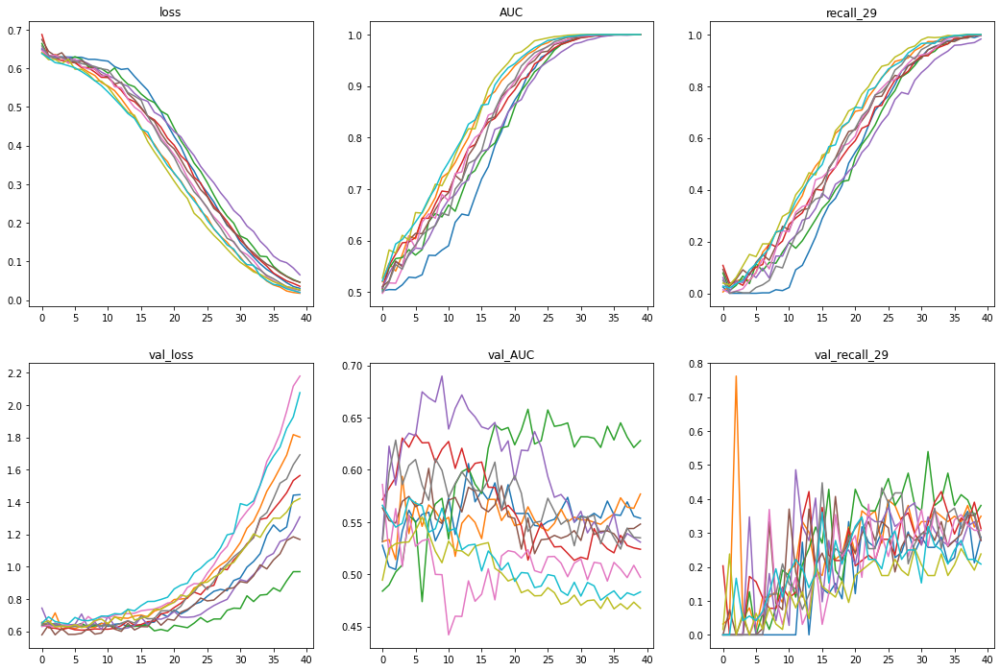

In [25]:
plot_performance(cnn_16_performance)

In [26]:
# n_dense 1 -> 2, dense_dropout False -> True
cnn_17 = keras.wrappers.scikit_learn.KerasClassifier(build_fn = build_cnn, filters = 32, n_units = 4, unit_size = 2, n_dense = 2, 
                                                     dense_dim = 8, dense_dropout = True, conv_dropout = False)

cnn_17_performance = cross_validate(cnn_17, X_train, y_train, K = 10, epochs = 40)

Model: "sequential_30"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_230 (Conv2D)          (None, 128, 862, 32)      832       
_________________________________________________________________
max_pooling2d_130 (MaxPoolin (None, 64, 431, 32)       0         
_________________________________________________________________
conv2d_231 (Conv2D)          (None, 64, 431, 64)       18496     
_________________________________________________________________
conv2d_232 (Conv2D)          (None, 64, 431, 64)       36928     
_________________________________________________________________
max_pooling2d_131 (MaxPoolin (None, 32, 215, 64)       0         
_________________________________________________________________
conv2d_233 (Conv2D)          (None, 32, 215, 32)       18464     
_________________________________________________________________
conv2d_234 (Conv2D)          (None, 32, 215, 32)     

1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6252 - AUC: 0.6347 - recall_31: 0.3652 - val_loss: 0.6670 - val_AUC: 0.5538 - val_recall_31: 0.1905
Epoch 18/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6409 - AUC: 0.6118 - recall_31: 0.3498 - val_loss: 0.7163 - val_AUC: 0.5812 - val_recall_31: 0.0317
Epoch 19/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6152 - AUC: 0.6515 - recall_31: 0.3584 - val_loss: 0.6752 - val_AUC: 0.5823 - val_recall_31: 0.1905
Epoch 20/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6156 - AUC: 0.6493 - recall_31: 0.3840 - val_loss: 0.7100 - val_AUC: 0.5477 - val_recall_31: 0.0794
Epoch 21/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.5985 - AUC: 0.6704 - recall_31: 0.3874 - val_loss: 0.6958 - val_AUC: 0.5641 - val_recall_31: 0.1111
Epoch 22/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.5964 - AUC: 0.6831 -

1800/1800 [==============================] - 19s 11ms/sample - loss: 0.6837 - AUC: 0.5207 - recall_33: 0.1009 - val_loss: 0.8237 - val_AUC: 0.4796 - val_recall_33: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6850 - AUC: 0.4884 - recall_33: 0.0051 - val_loss: 0.7398 - val_AUC: 0.5214 - val_recall_33: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6815 - AUC: 0.4769 - recall_33: 0.0017 - val_loss: 0.8079 - val_AUC: 0.5636 - val_recall_33: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6637 - AUC: 0.5143 - recall_33: 0.0393 - val_loss: 0.7322 - val_AUC: 0.5640 - val_recall_33: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6635 - AUC: 0.5180 - recall_33: 0.0393 - val_loss: 0.7373 - val_AUC: 0.5896 - val_recall_33: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6547

1800/1800 [==============================] - 18s 10ms/sample - loss: 0.6616 - AUC: 0.4669 - recall_34: 0.0832 - val_loss: 0.6534 - val_AUC: 0.4785 - val_recall_34: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6463 - AUC: 0.5023 - recall_34: 0.0589 - val_loss: 0.7498 - val_AUC: 0.5286 - val_recall_34: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6457 - AUC: 0.5237 - recall_34: 0.0745 - val_loss: 0.6531 - val_AUC: 0.5298 - val_recall_34: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6502 - AUC: 0.4758 - recall_34: 0.0416 - val_loss: 0.6533 - val_AUC: 0.5708 - val_recall_34: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6444 - AUC: 0.4977 - recall_34: 0.0451 - val_loss: 0.6547 - val_AUC: 0.5590 - val_recall_34: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6407

1800/1800 [==============================] - 19s 11ms/sample - loss: 0.7693 - AUC: 0.5049 - recall_35: 0.3059 - val_loss: 0.5792 - val_AUC: 0.6173 - val_recall_35: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7492 - AUC: 0.4895 - recall_35: 0.2471 - val_loss: 0.5789 - val_AUC: 0.6162 - val_recall_35: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7487 - AUC: 0.4828 - recall_35: 0.2403 - val_loss: 0.5773 - val_AUC: 0.6220 - val_recall_35: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7302 - AUC: 0.5172 - recall_35: 0.2739 - val_loss: 0.6650 - val_AUC: 0.5892 - val_recall_35: 0.4444
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7158 - AUC: 0.5209 - recall_35: 0.2975 - val_loss: 0.5723 - val_AUC: 0.6237 - val_recall_35: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7230 - A

1800/1800 [==============================] - 18s 10ms/sample - loss: 0.6527 - AUC: 0.5166 - recall_36: 0.0993 - val_loss: 0.6315 - val_AUC: 0.5742 - val_recall_36: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6474 - AUC: 0.4956 - recall_36: 0.1541 - val_loss: 0.6490 - val_AUC: 0.5500 - val_recall_36: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6488 - AUC: 0.4996 - recall_36: 0.0702 - val_loss: 0.6306 - val_AUC: 0.5160 - val_recall_36: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6478 - AUC: 0.5009 - recall_36: 0.0582 - val_loss: 0.6423 - val_AUC: 0.6011 - val_recall_36: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6469 - AUC: 0.4979 - recall_36: 0.0479 - val_loss: 0.6297 - val_AUC: 0.5828 - val_recall_36: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6403

1800/1800 [==============================] - 19s 11ms/sample - loss: 0.6616 - AUC: 0.5077 - recall_37: 0.0498 - val_loss: 0.6526 - val_AUC: 0.4600 - val_recall_37: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6495 - AUC: 0.5150 - recall_37: 0.0241 - val_loss: 0.6546 - val_AUC: 0.4939 - val_recall_37: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6543 - AUC: 0.4904 - recall_37: 0.0275 - val_loss: 0.6387 - val_AUC: 0.5527 - val_recall_37: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6487 - AUC: 0.5195 - recall_37: 0.0412 - val_loss: 0.6395 - val_AUC: 0.5192 - val_recall_37: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6513 - AUC: 0.4942 - recall_37: 0.0172 - val_loss: 0.6486 - val_AUC: 0.5336 - val_recall_37: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6426

1800/1800 [==============================] - 18s 10ms/sample - loss: 0.7227 - AUC: 0.4969 - recall_38: 0.3072 - val_loss: 0.6447 - val_AUC: 0.4889 - val_recall_38: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7036 - AUC: 0.5084 - recall_38: 0.2679 - val_loss: 0.6219 - val_AUC: 0.5257 - val_recall_38: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7149 - AUC: 0.4954 - recall_38: 0.2628 - val_loss: 0.6206 - val_AUC: 0.5658 - val_recall_38: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7116 - AUC: 0.4933 - recall_38: 0.2440 - val_loss: 0.6231 - val_AUC: 0.5276 - val_recall_38: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7058 - AUC: 0.5038 - recall_38: 0.2457 - val_loss: 0.6218 - val_AUC: 0.5382 - val_recall_38: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6893

1800/1800 [==============================] - 19s 11ms/sample - loss: 0.7022 - AUC: 0.5001 - recall_39: 0.1802 - val_loss: 0.6631 - val_AUC: 0.5068 - val_recall_39: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6752 - AUC: 0.5102 - recall_39: 0.1560 - val_loss: 0.6767 - val_AUC: 0.5116 - val_recall_39: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6889 - AUC: 0.4834 - recall_39: 0.1629 - val_loss: 0.6561 - val_AUC: 0.5339 - val_recall_39: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6775 - AUC: 0.5044 - recall_39: 0.1733 - val_loss: 0.7329 - val_AUC: 0.5257 - val_recall_39: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6702 - AUC: 0.5097 - recall_39: 0.1161 - val_loss: 0.6901 - val_AUC: 0.5303 - val_recall_39: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6619

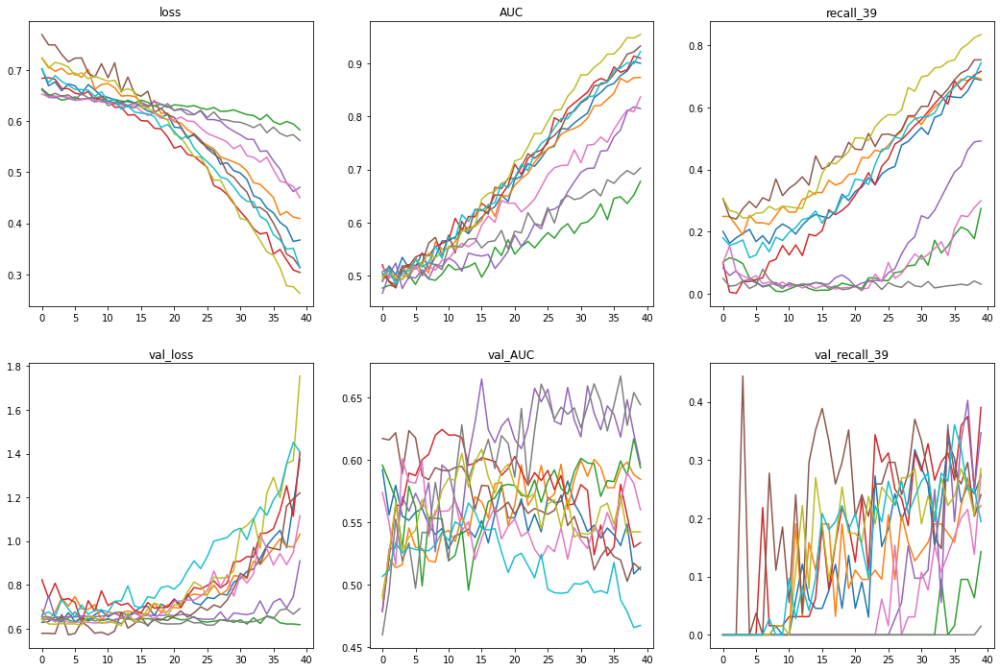

In [27]:
plot_performance(cnn_17_performance)

In [30]:
# dense_dim 8 -> 16, dropout -> false, unit_size -> 1
cnn_18 = keras.wrappers.scikit_learn.KerasClassifier(build_fn = build_cnn, filters = 32, n_units = 4, unit_size = 1, n_dense = 2, 
                                                     dense_dim = 16, dense_dropout = False, conv_dropout = False)

cnn_18_performance = cross_validate(cnn_18, X_train, y_train, K = 10, epochs = 40)

Model: "sequential_50"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_410 (Conv2D)          (None, 128, 862, 32)      832       
_________________________________________________________________
max_pooling2d_230 (MaxPoolin (None, 64, 431, 32)       0         
_________________________________________________________________
conv2d_411 (Conv2D)          (None, 64, 431, 64)       18496     
_________________________________________________________________
max_pooling2d_231 (MaxPoolin (None, 32, 215, 64)       0         
_________________________________________________________________
conv2d_412 (Conv2D)          (None, 32, 215, 32)       18464     
_________________________________________________________________
max_pooling2d_232 (MaxPoolin (None, 16, 107, 32)       0         
_________________________________________________________________
conv2d_413 (Conv2D)          (None, 16, 107, 32)     

1800/1800 [==============================] - 11s 6ms/sample - loss: 0.3143 - AUC: 0.9524 - recall_51: 0.7372 - val_loss: 0.7044 - val_AUC: 0.5751 - val_recall_51: 0.2381
Epoch 26/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.2971 - AUC: 0.9553 - recall_51: 0.7491 - val_loss: 0.7148 - val_AUC: 0.5846 - val_recall_51: 0.2063
Epoch 27/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.2810 - AUC: 0.9625 - recall_51: 0.7986 - val_loss: 0.7358 - val_AUC: 0.5831 - val_recall_51: 0.2381
Epoch 28/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.2573 - AUC: 0.9718 - recall_51: 0.8072 - val_loss: 0.7351 - val_AUC: 0.5884 - val_recall_51: 0.2857
Epoch 29/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.2333 - AUC: 0.9780 - recall_51: 0.8464 - val_loss: 0.7454 - val_AUC: 0.5881 - val_recall_51: 0.2857
Epoch 30/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.2134 - AUC: 0.9835 -

Epoch 18/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.4835 - AUC: 0.8250 - recall_52: 0.4590 - val_loss: 0.6346 - val_AUC: 0.5927 - val_recall_52: 0.2540
Epoch 19/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.4666 - AUC: 0.8436 - recall_52: 0.4693 - val_loss: 0.6333 - val_AUC: 0.6119 - val_recall_52: 0.2857
Epoch 20/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.4556 - AUC: 0.8513 - recall_52: 0.4915 - val_loss: 0.6321 - val_AUC: 0.6207 - val_recall_52: 0.2698
Epoch 21/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.4393 - AUC: 0.8703 - recall_52: 0.5137 - val_loss: 0.6458 - val_AUC: 0.6183 - val_recall_52: 0.3651
Epoch 22/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.4231 - AUC: 0.8813 - recall_52: 0.5478 - val_loss: 0.6602 - val_AUC: 0.6230 - val_recall_52: 0.4286
Epoch 23/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.4032 - A

Epoch 3/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6201 - AUC: 0.5722 - recall_54: 0.0069 - val_loss: 0.6299 - val_AUC: 0.6531 - val_recall_54: 0.0417
Epoch 4/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6217 - AUC: 0.5685 - recall_54: 0.0624 - val_loss: 0.6862 - val_AUC: 0.6242 - val_recall_54: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6135 - AUC: 0.5996 - recall_54: 0.0537 - val_loss: 0.6387 - val_AUC: 0.6291 - val_recall_54: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6075 - AUC: 0.6148 - recall_54: 0.0797 - val_loss: 0.6259 - val_AUC: 0.6472 - val_recall_54: 0.1389
Epoch 7/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6017 - AUC: 0.6319 - recall_54: 0.1248 - val_loss: 0.6497 - val_AUC: 0.6484 - val_recall_54: 0.0000e+00
Epoch 8/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.59

1800/1800 [==============================] - 13s 7ms/sample - loss: 0.6468 - AUC: 0.5025 - recall_55: 0.0101 - val_loss: 0.5995 - val_AUC: 0.4958 - val_recall_55: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6354 - AUC: 0.5416 - recall_55: 0.0252 - val_loss: 0.6047 - val_AUC: 0.5195 - val_recall_55: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6269 - AUC: 0.5727 - recall_55: 0.0118 - val_loss: 0.5911 - val_AUC: 0.5310 - val_recall_55: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6166 - AUC: 0.6227 - recall_55: 0.0151 - val_loss: 0.5942 - val_AUC: 0.5476 - val_recall_55: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6189 - AUC: 0.6074 - recall_55: 0.0639 - val_loss: 0.5862 - val_AUC: 0.5592 - val_recall_55: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6090 

1800/1800 [==============================] - 13s 7ms/sample - loss: 0.6341 - AUC: 0.5380 - recall_56: 0.0308 - val_loss: 0.6293 - val_AUC: 0.5814 - val_recall_56: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6279 - AUC: 0.5549 - recall_56: 0.0034 - val_loss: 0.6212 - val_AUC: 0.6025 - val_recall_56: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6310 - AUC: 0.5426 - recall_56: 0.0205 - val_loss: 0.6258 - val_AUC: 0.5889 - val_recall_56: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6229 - AUC: 0.5743 - recall_56: 0.0274 - val_loss: 0.6199 - val_AUC: 0.5999 - val_recall_56: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6160 - AUC: 0.6012 - recall_56: 0.0240 - val_loss: 0.6211 - val_AUC: 0.5804 - val_recall_56: 0.0462
Epoch 6/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6118 - AU

1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6387 - AUC: 0.5129 - recall_57: 0.0258 - val_loss: 0.6496 - val_AUC: 0.5309 - val_recall_57: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6320 - AUC: 0.5456 - recall_57: 0.0223 - val_loss: 0.6601 - val_AUC: 0.5221 - val_recall_57: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6262 - AUC: 0.5576 - recall_57: 0.0155 - val_loss: 0.6395 - val_AUC: 0.5408 - val_recall_57: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6155 - AUC: 0.6052 - recall_57: 0.0172 - val_loss: 0.6515 - val_AUC: 0.5587 - val_recall_57: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6171 - AUC: 0.5964 - recall_57: 0.0344 - val_loss: 0.6343 - val_AUC: 0.5768 - val_recall_57: 0.0149
Epoch 6/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6078 - AU

1800/1800 [==============================] - 13s 7ms/sample - loss: 0.6422 - AUC: 0.5359 - recall_58: 0.0341 - val_loss: 0.6348 - val_AUC: 0.6120 - val_recall_58: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6301 - AUC: 0.5405 - recall_58: 0.0000e+00 - val_loss: 0.6172 - val_AUC: 0.5725 - val_recall_58: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6280 - AUC: 0.5701 - recall_58: 0.0188 - val_loss: 0.6296 - val_AUC: 0.6006 - val_recall_58: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6262 - AUC: 0.5658 - recall_58: 0.0085 - val_loss: 0.6302 - val_AUC: 0.6148 - val_recall_58: 0.0635
Epoch 5/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6269 - AUC: 0.5662 - recall_58: 0.0427 - val_loss: 0.6112 - val_AUC: 0.5951 - val_recall_58: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6164 

1800/1800 [==============================] - 13s 7ms/sample - loss: 0.6432 - AUC: 0.5255 - recall_59: 0.0641 - val_loss: 0.6588 - val_AUC: 0.5369 - val_recall_59: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6248 - AUC: 0.5654 - recall_59: 0.0035 - val_loss: 0.6602 - val_AUC: 0.5368 - val_recall_59: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6204 - AUC: 0.5704 - recall_59: 0.0017 - val_loss: 0.6703 - val_AUC: 0.5572 - val_recall_59: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6196 - AUC: 0.5801 - recall_59: 0.0260 - val_loss: 0.6689 - val_AUC: 0.5514 - val_recall_59: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6057 - AUC: 0.6266 - recall_59: 0.0555 - val_loss: 0.6600 - val_AUC: 0.5805 - val_recall_59: 0.0278
Epoch 6/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6034 - AU

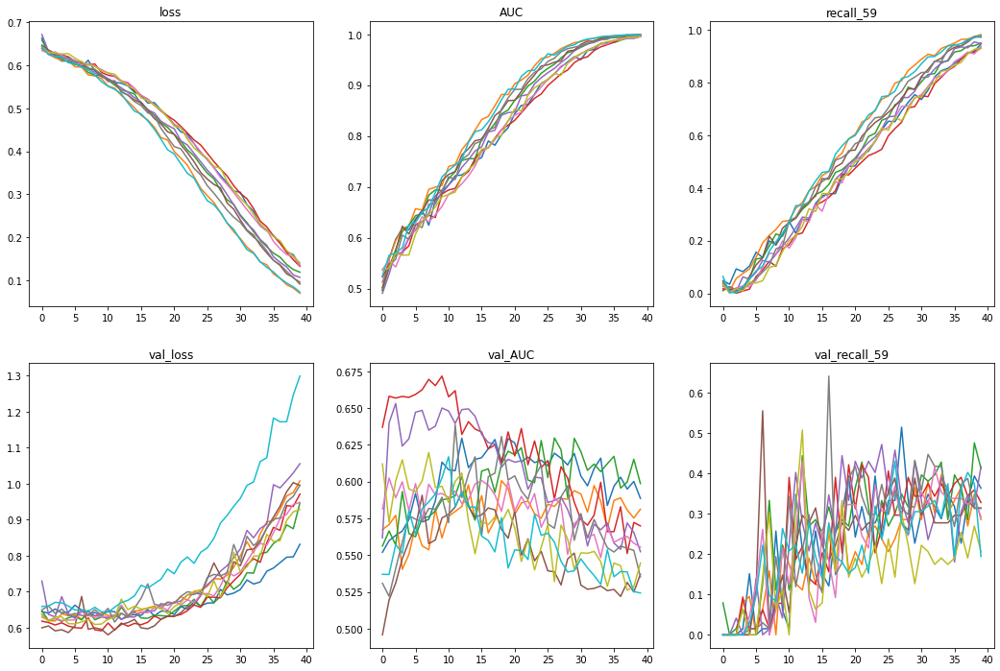

In [32]:
plot_performance(cnn_18_performance)

In [33]:
# dense_dropout false -> true, learning_rate 0.0001 -> 0.001
cnn_19 = keras.wrappers.scikit_learn.KerasClassifier(build_fn = build_cnn, filters = 32, n_units = 4, unit_size = 1, n_dense = 2, 
                                                     dense_dim = 16, dense_dropout = True, conv_dropout = False, learning_rate = 0.001)

cnn_19_performance = cross_validate(cnn_19, X_train, y_train, K = 10, epochs = 40)

Model: "sequential_60"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_460 (Conv2D)          (None, 128, 862, 32)      832       
_________________________________________________________________
max_pooling2d_280 (MaxPoolin (None, 64, 431, 32)       0         
_________________________________________________________________
conv2d_461 (Conv2D)          (None, 64, 431, 64)       18496     
_________________________________________________________________
max_pooling2d_281 (MaxPoolin (None, 32, 215, 64)       0         
_________________________________________________________________
conv2d_462 (Conv2D)          (None, 32, 215, 32)       18464     
_________________________________________________________________
max_pooling2d_282 (MaxPoolin (None, 16, 107, 32)       0         
_________________________________________________________________
conv2d_463 (Conv2D)          (None, 16, 107, 32)     

1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6318 - AUC: 0.5110 - recall_61: 0.0000e+00 - val_loss: 0.6233 - val_AUC: 0.4922 - val_recall_61: 0.0000e+00
Epoch 22/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6325 - AUC: 0.5045 - recall_61: 0.0000e+00 - val_loss: 0.6263 - val_AUC: 0.5213 - val_recall_61: 0.0000e+00
Epoch 23/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6314 - AUC: 0.5035 - recall_61: 0.0000e+00 - val_loss: 0.6273 - val_AUC: 0.5115 - val_recall_61: 0.0000e+00
Epoch 24/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6325 - AUC: 0.4903 - recall_61: 0.0000e+00 - val_loss: 0.6272 - val_AUC: 0.5147 - val_recall_61: 0.0000e+00
Epoch 25/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6325 - AUC: 0.4985 - recall_61: 0.0000e+00 - val_loss: 0.6240 - val_AUC: 0.5010 - val_recall_61: 0.0000e+00
Epoch 26/40
1800/1800 [==============================] - 11s 6

1800/1800 [==============================] - 13s 7ms/sample - loss: 0.7192 - AUC: 0.4992 - recall_63: 0.2000 - val_loss: 0.6291 - val_AUC: 0.5362 - val_recall_63: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6795 - AUC: 0.4986 - recall_63: 0.1692 - val_loss: 0.6416 - val_AUC: 0.5647 - val_recall_63: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6665 - AUC: 0.4878 - recall_63: 0.0872 - val_loss: 0.6341 - val_AUC: 0.5580 - val_recall_63: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6548 - AUC: 0.4932 - recall_63: 0.0855 - val_loss: 0.6284 - val_AUC: 0.5600 - val_recall_63: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6446 - AUC: 0.5141 - recall_63: 0.0427 - val_loss: 0.6491 - val_AUC: 0.4532 - val_recall_63: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6440 

1800/1800 [==============================] - 13s 7ms/sample - loss: 0.7590 - AUC: 0.4897 - recall_64: 0.1906 - val_loss: 0.6741 - val_AUC: 0.5000 - val_recall_64: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6825 - AUC: 0.5187 - recall_64: 0.2149 - val_loss: 0.6883 - val_AUC: 0.5000 - val_recall_64: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6868 - AUC: 0.4892 - recall_64: 0.1768 - val_loss: 0.7214 - val_AUC: 0.5000 - val_recall_64: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6761 - AUC: 0.4899 - recall_64: 0.1317 - val_loss: 0.6842 - val_AUC: 0.5000 - val_recall_64: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6662 - AUC: 0.4939 - recall_64: 0.1040 - val_loss: 0.6619 - val_AUC: 0.5000 - val_recall_64: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6500 

1800/1800 [==============================] - 15s 8ms/sample - loss: 0.7773 - AUC: 0.4791 - recall_65: 0.2605 - val_loss: 0.5875 - val_AUC: 0.4653 - val_recall_65: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.7020 - AUC: 0.5120 - recall_65: 0.2387 - val_loss: 1.1199 - val_AUC: 0.4157 - val_recall_65: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.7170 - AUC: 0.5020 - recall_65: 0.2555 - val_loss: 0.5925 - val_AUC: 0.5000 - val_recall_65: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6778 - AUC: 0.5002 - recall_65: 0.2370 - val_loss: 0.5887 - val_AUC: 0.5000 - val_recall_65: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6792 - AUC: 0.4870 - recall_65: 0.1445 - val_loss: 0.5833 - val_AUC: 0.5000 - val_recall_65: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6563 

1800/1800 [==============================] - 13s 7ms/sample - loss: 0.6615 - AUC: 0.5049 - recall_66: 0.1164 - val_loss: 0.7217 - val_AUC: 0.4568 - val_recall_66: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6984 - AUC: 0.4950 - recall_66: 0.0445 - val_loss: 0.6381 - val_AUC: 0.4857 - val_recall_66: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6432 - AUC: 0.5012 - recall_66: 0.0360 - val_loss: 0.6455 - val_AUC: 0.5499 - val_recall_66: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6479 - AUC: 0.4983 - recall_66: 0.0274 - val_loss: 0.6421 - val_AUC: 0.5076 - val_recall_66: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6391 - AUC: 0.4928 - recall_66: 0.0205 - val_loss: 0.6471 - val_AUC: 0.4719 - val_recall_66: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6360 

1800/1800 [==============================] - 13s 7ms/sample - loss: 0.6574 - AUC: 0.5148 - recall_67: 0.0979 - val_loss: 0.6430 - val_AUC: 0.4482 - val_recall_67: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6423 - AUC: 0.5040 - recall_67: 0.0464 - val_loss: 0.6442 - val_AUC: 0.4891 - val_recall_67: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6540 - AUC: 0.4992 - recall_67: 0.0790 - val_loss: 0.6486 - val_AUC: 0.4414 - val_recall_67: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6375 - AUC: 0.4892 - recall_67: 0.0206 - val_loss: 0.6443 - val_AUC: 0.4666 - val_recall_67: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6368 - AUC: 0.4881 - recall_67: 0.0292 - val_loss: 0.6561 - val_AUC: 0.5000 - val_recall_67: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6357 

1800/1800 [==============================] - 13s 7ms/sample - loss: 0.7689 - AUC: 0.5229 - recall_68: 0.3038 - val_loss: 0.6870 - val_AUC: 0.4407 - val_recall_68: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 12s 6ms/sample - loss: 0.7235 - AUC: 0.4600 - recall_68: 0.2099 - val_loss: 0.6318 - val_AUC: 0.5115 - val_recall_68: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6865 - AUC: 0.4981 - recall_68: 0.2423 - val_loss: 0.6293 - val_AUC: 0.4650 - val_recall_68: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6682 - AUC: 0.5045 - recall_68: 0.1980 - val_loss: 0.6453 - val_AUC: 0.5459 - val_recall_68: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6591 - AUC: 0.5108 - recall_68: 0.1826 - val_loss: 0.6226 - val_AUC: 0.5489 - val_recall_68: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6562 

1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6627 - AUC: 0.4962 - recall_69: 0.0607 - val_loss: 0.7620 - val_AUC: 0.5326 - val_recall_69: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6420 - AUC: 0.4842 - recall_69: 0.0156 - val_loss: 0.6653 - val_AUC: 0.4562 - val_recall_69: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.8262 - AUC: 0.5054 - recall_69: 0.0433 - val_loss: 0.7034 - val_AUC: 0.4534 - val_recall_69: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6373 - AUC: 0.4985 - recall_69: 0.0035 - val_loss: 0.6834 - val_AUC: 0.4840 - val_recall_69: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6327 - AUC: 0.4915 - recall_69: 0.0035 - val_loss: 0.6747 - val_AUC: 0.5352 - val_recall_69: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6319 

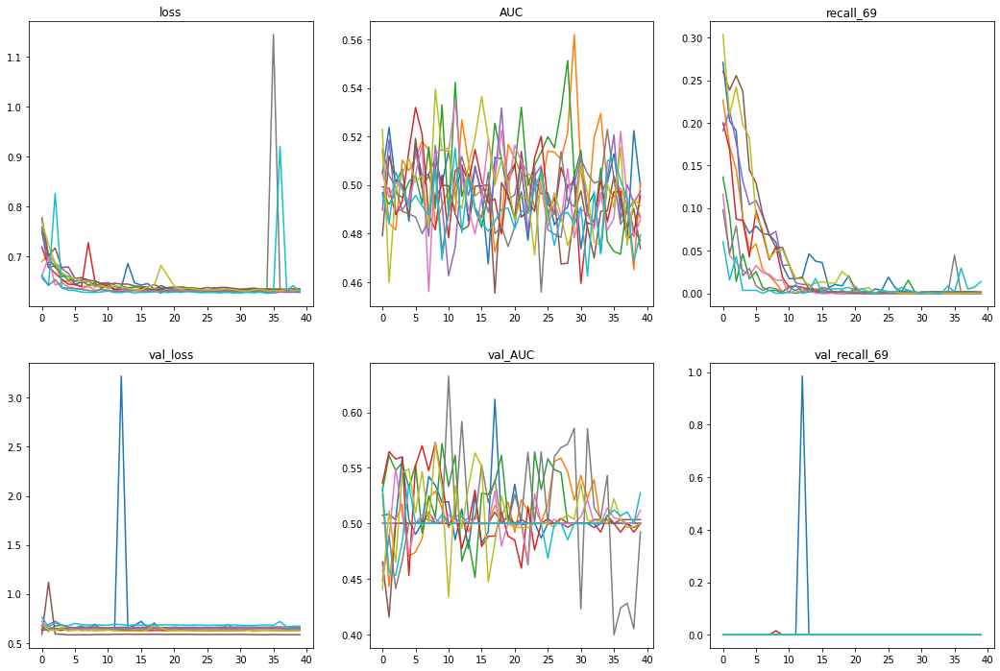

In [34]:
plot_performance(cnn_19_performance)

In [35]:
# dense_dropout true -> false
cnn_20 = keras.wrappers.scikit_learn.KerasClassifier(build_fn = build_cnn, filters = 32, n_units = 4, unit_size = 1, n_dense = 2, 
                                                     dense_dim = 16, dense_dropout = False, conv_dropout = False, learning_rate = 0.001)

cnn_20_performance = cross_validate(cnn_20, X_train, y_train, K = 10, epochs = 40)

Model: "sequential_70"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_510 (Conv2D)          (None, 128, 862, 32)      832       
_________________________________________________________________
max_pooling2d_330 (MaxPoolin (None, 64, 431, 32)       0         
_________________________________________________________________
conv2d_511 (Conv2D)          (None, 64, 431, 64)       18496     
_________________________________________________________________
max_pooling2d_331 (MaxPoolin (None, 32, 215, 64)       0         
_________________________________________________________________
conv2d_512 (Conv2D)          (None, 32, 215, 32)       18464     
_________________________________________________________________
max_pooling2d_332 (MaxPoolin (None, 16, 107, 32)       0         
_________________________________________________________________
conv2d_513 (Conv2D)          (None, 16, 107, 32)     

Epoch 33/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6303 - AUC: 0.4981 - recall_70: 0.0017 - val_loss: 0.6375 - val_AUC: 0.4963 - val_recall_70: 0.0000e+00
Epoch 34/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6304 - AUC: 0.4832 - recall_70: 0.0017 - val_loss: 0.6350 - val_AUC: 0.4963 - val_recall_70: 0.0000e+00
Epoch 35/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6300 - AUC: 0.4909 - recall_70: 0.0017 - val_loss: 0.6345 - val_AUC: 0.4963 - val_recall_70: 0.0000e+00
Epoch 36/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6301 - AUC: 0.4975 - recall_70: 0.0017 - val_loss: 0.6347 - val_AUC: 0.4963 - val_recall_70: 0.0000e+00
Epoch 37/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6308 - AUC: 0.4501 - recall_70: 0.0017 - val_loss: 0.6346 - val_AUC: 0.4963 - val_recall_70: 0.0000e+00
Epoch 38/40
1800/1800 [==============================] - 11s 6ms/sampl

1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6551 - AUC: 0.4835 - recall_72: 0.0256 - val_loss: 0.6292 - val_AUC: 0.5510 - val_recall_72: 0.0000e+00
Epoch 18/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6354 - AUC: 0.5116 - recall_72: 0.0051 - val_loss: 0.6223 - val_AUC: 0.6044 - val_recall_72: 0.0000e+00
Epoch 19/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6403 - AUC: 0.5115 - recall_72: 0.0000e+00 - val_loss: 0.6595 - val_AUC: 0.5977 - val_recall_72: 0.0000e+00
Epoch 20/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6418 - AUC: 0.5031 - recall_72: 0.0000e+00 - val_loss: 0.6222 - val_AUC: 0.5651 - val_recall_72: 0.0000e+00
Epoch 21/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6346 - AUC: 0.4954 - recall_72: 0.0000e+00 - val_loss: 0.6246 - val_AUC: 0.4868 - val_recall_72: 0.0000e+00
Epoch 22/40
1800/1800 [==============================] - 11s 6ms/sampl

Epoch 9/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6323 - AUC: 0.4752 - recall_73: 0.0000e+00 - val_loss: 0.6257 - val_AUC: 0.5717 - val_recall_73: 0.0000e+00
Epoch 10/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6326 - AUC: 0.5047 - recall_73: 0.0000e+00 - val_loss: 0.6268 - val_AUC: 0.5078 - val_recall_73: 0.0000e+00
Epoch 11/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6314 - AUC: 0.4986 - recall_73: 0.0000e+00 - val_loss: 0.6266 - val_AUC: 0.5198 - val_recall_73: 0.0000e+00
Epoch 12/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6310 - AUC: 0.4981 - recall_73: 0.0000e+00 - val_loss: 0.6252 - val_AUC: 0.6008 - val_recall_73: 0.0000e+00
Epoch 13/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6342 - AUC: 0.4673 - recall_73: 0.0000e+00 - val_loss: 0.6282 - val_AUC: 0.5259 - val_recall_73: 0.0000e+00
Epoch 14/40
1800/1800 [============================

1800/1800 [==============================] - 13s 7ms/sample - loss: 0.6924 - AUC: 0.5135 - recall_74: 0.0849 - val_loss: 0.6866 - val_AUC: 0.4868 - val_recall_74: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6302 - AUC: 0.4939 - recall_74: 0.0000e+00 - val_loss: 0.6632 - val_AUC: 0.5000 - val_recall_74: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6283 - AUC: 0.4956 - recall_74: 0.0000e+00 - val_loss: 0.6558 - val_AUC: 0.5000 - val_recall_74: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6281 - AUC: 0.4822 - recall_74: 0.0000e+00 - val_loss: 0.6578 - val_AUC: 0.5000 - val_recall_74: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6301 - AUC: 0.4656 - recall_74: 0.0000e+00 - val_loss: 0.6573 - val_AUC: 0.5000 - val_recall_74: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 11s 6ms/sample

1800/1800 [==============================] - 13s 7ms/sample - loss: 0.7007 - AUC: 0.5088 - recall_75: 0.0420 - val_loss: 0.5850 - val_AUC: 0.5507 - val_recall_75: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6367 - AUC: 0.4702 - recall_75: 0.0000e+00 - val_loss: 0.5901 - val_AUC: 0.4126 - val_recall_75: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6357 - AUC: 0.4730 - recall_75: 0.0000e+00 - val_loss: 0.5919 - val_AUC: 0.4578 - val_recall_75: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6349 - AUC: 0.4941 - recall_75: 0.0000e+00 - val_loss: 0.5908 - val_AUC: 0.5476 - val_recall_75: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6358 - AUC: 0.5072 - recall_75: 0.0000e+00 - val_loss: 0.5967 - val_AUC: 0.5174 - val_recall_75: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 11s 6ms/sample

1800/1800 [==============================] - 13s 7ms/sample - loss: 0.7185 - AUC: 0.5089 - recall_76: 0.1164 - val_loss: 0.6318 - val_AUC: 0.4938 - val_recall_76: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6449 - AUC: 0.4868 - recall_76: 0.0017 - val_loss: 0.6468 - val_AUC: 0.4954 - val_recall_76: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6396 - AUC: 0.5134 - recall_76: 0.0017 - val_loss: 0.6497 - val_AUC: 0.5332 - val_recall_76: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6361 - AUC: 0.5124 - recall_76: 0.0017 - val_loss: 0.6373 - val_AUC: 0.5583 - val_recall_76: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6278 - AUC: 0.5481 - recall_76: 0.0068 - val_loss: 0.6236 - val_AUC: 0.5894 - val_recall_76: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6246 

1800/1800 [==============================] - 13s 7ms/sample - loss: 0.7377 - AUC: 0.5007 - recall_77: 0.1392 - val_loss: 0.7582 - val_AUC: 0.5614 - val_recall_77: 1.0000
Epoch 2/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6757 - AUC: 0.5031 - recall_77: 0.0945 - val_loss: 0.6379 - val_AUC: 0.5733 - val_recall_77: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6479 - AUC: 0.4937 - recall_77: 0.0447 - val_loss: 0.6365 - val_AUC: 0.6075 - val_recall_77: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6287 - AUC: 0.5524 - recall_77: 0.0241 - val_loss: 0.6304 - val_AUC: 0.5861 - val_recall_77: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6273 - AUC: 0.5476 - recall_77: 0.0206 - val_loss: 0.6334 - val_AUC: 0.5718 - val_recall_77: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6203 - AU

1800/1800 [==============================] - 15s 8ms/sample - loss: 0.6929 - AUC: 0.5042 - recall_78: 0.1041 - val_loss: 0.6670 - val_AUC: 0.5367 - val_recall_78: 0.1270
Epoch 2/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6528 - AUC: 0.5060 - recall_78: 0.0751 - val_loss: 0.6245 - val_AUC: 0.5623 - val_recall_78: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6330 - AUC: 0.5330 - recall_78: 0.0017 - val_loss: 0.6187 - val_AUC: 0.5614 - val_recall_78: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6236 - AUC: 0.5706 - recall_78: 0.0273 - val_loss: 0.6210 - val_AUC: 0.5784 - val_recall_78: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6152 - AUC: 0.5995 - recall_78: 0.0853 - val_loss: 0.6170 - val_AUC: 0.5718 - val_recall_78: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6089 - AU

1800/1800 [==============================] - 13s 7ms/sample - loss: 0.6382 - AUC: 0.4794 - recall_79: 0.0000e+00 - val_loss: 0.6586 - val_AUC: 0.4919 - val_recall_79: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6292 - AUC: 0.4727 - recall_79: 0.0000e+00 - val_loss: 0.6549 - val_AUC: 0.5000 - val_recall_79: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6288 - AUC: 0.4824 - recall_79: 0.0000e+00 - val_loss: 0.6622 - val_AUC: 0.5303 - val_recall_79: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6291 - AUC: 0.4810 - recall_79: 0.0000e+00 - val_loss: 0.6609 - val_AUC: 0.5329 - val_recall_79: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6288 - AUC: 0.5050 - recall_79: 0.0000e+00 - val_loss: 0.6534 - val_AUC: 0.4962 - val_recall_79: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 11s 6ms/sa

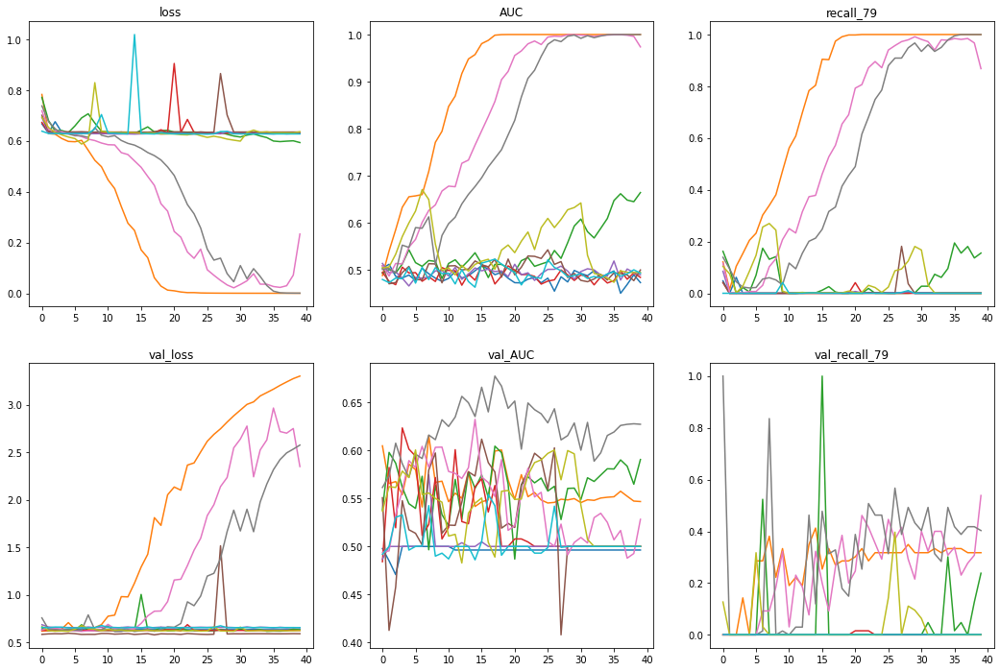

In [36]:
plot_performance(cnn_20_performance)

In [21]:
# learning_rate 0.001 -> 0.0001, dataset unbalanced -> balanced
cnn_21 = keras.wrappers.scikit_learn.KerasClassifier(build_fn = build_cnn, filters = 32, n_units = 4, unit_size = 1, n_dense = 2, 
                                                     dense_dim = 16, dense_dropout = False, conv_dropout = False, learning_rate = 0.0001)

cnn_21_performance = cross_validate(cnn_21, X_train, y_train, K = 10, epochs = 40)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 128, 862, 32)      832       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 64, 431, 32)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 64, 431, 64)       18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 32, 215, 64)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 32, 215, 32)       18464     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 16, 107, 32)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 16, 107, 32)       9

Epoch 35/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.1512 - AUC: 0.9943 - recall: 0.9443 - val_loss: 0.7585 - val_AUC: 0.7474 - val_recall: 0.5980
Epoch 36/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.1359 - AUC: 0.9953 - recall: 0.9510 - val_loss: 0.7378 - val_AUC: 0.7469 - val_recall: 0.6863
Epoch 37/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.1212 - AUC: 0.9965 - recall: 0.9666 - val_loss: 0.7936 - val_AUC: 0.7399 - val_recall: 0.6471
Epoch 38/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.1081 - AUC: 0.9978 - recall: 0.9644 - val_loss: 0.8056 - val_AUC: 0.7475 - val_recall: 0.6863
Epoch 39/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.0978 - AUC: 0.9983 - recall: 0.9722 - val_loss: 0.8416 - val_AUC: 0.7311 - val_recall: 0.6373UC: 0
Epoch 40/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.0875 - AUC: 0.9988 - recall: 0.97

1800/1800 [==============================] - 11s 6ms/sample - loss: 0.3245 - AUC: 0.9476 - recall_2: 0.8428 - val_loss: 0.6250 - val_AUC: 0.7385 - val_recall_2: 0.5728
Epoch 22/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.3032 - AUC: 0.9589 - recall_2: 0.8450 - val_loss: 0.6104 - val_AUC: 0.7611 - val_recall_2: 0.6990
Epoch 23/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.2811 - AUC: 0.9667 - recall_2: 0.8606 - val_loss: 0.6471 - val_AUC: 0.7462 - val_recall_2: 0.7476
Epoch 24/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.2584 - AUC: 0.9749 - recall_2: 0.8751 - val_loss: 0.6401 - val_AUC: 0.7532 - val_recall_2: 0.6893
Epoch 25/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.2436 - AUC: 0.9785 - recall_2: 0.8941 - val_loss: 0.6490 - val_AUC: 0.7500 - val_recall_2: 0.6893
Epoch 26/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.2252 - AUC: 0.9832 - recall_2:

1800/1800 [==============================] - 11s 6ms/sample - loss: 0.5976 - AUC: 0.7391 - recall_4: 0.6293 - val_loss: 0.6136 - val_AUC: 0.7246 - val_recall_4: 0.5888
Epoch 8/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.5816 - AUC: 0.7584 - recall_4: 0.6405 - val_loss: 0.6121 - val_AUC: 0.7170 - val_recall_4: 0.6168
Epoch 9/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.5590 - AUC: 0.7826 - recall_4: 0.6260 - val_loss: 0.6027 - val_AUC: 0.7269 - val_recall_4: 0.7196
Epoch 10/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.5504 - AUC: 0.7902 - recall_4: 0.6674 - val_loss: 0.5995 - val_AUC: 0.7376 - val_recall_4: 0.7850
Epoch 11/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.5297 - AUC: 0.8049 - recall_4: 0.6663 - val_loss: 0.5994 - val_AUC: 0.7327 - val_recall_4: 0.7757
Epoch 12/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.5064 - AUC: 0.8317 - recall_4: 0

1800/1800 [==============================] - 13s 7ms/sample - loss: 0.6929 - AUC: 0.5503 - recall_5: 0.5912 - val_loss: 0.6562 - val_AUC: 0.7090 - val_recall_5: 0.6632
Epoch 2/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6671 - AUC: 0.6228 - recall_5: 0.5978 - val_loss: 0.6472 - val_AUC: 0.7191 - val_recall_5: 0.2421
Epoch 3/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6548 - AUC: 0.6488 - recall_5: 0.5790 - val_loss: 0.6211 - val_AUC: 0.7404 - val_recall_5: 0.3263
Epoch 4/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6467 - AUC: 0.6592 - recall_5: 0.5558 - val_loss: 0.6110 - val_AUC: 0.7387 - val_recall_5: 0.7158
Epoch 5/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6177 - AUC: 0.7057 - recall_5: 0.5923 - val_loss: 0.6097 - val_AUC: 0.7295 - val_recall_5: 0.3789
Epoch 6/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6000 - AUC: 0.7365 - recall_5: 0.57

1800/1800 [==============================] - 13s 7ms/sample - loss: 0.7114 - AUC: 0.5243 - recall_6: 0.5553 - val_loss: 0.7025 - val_AUC: 0.5575 - val_recall_6: 1.0000
Epoch 2/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6774 - AUC: 0.5952 - recall_6: 0.5730 - val_loss: 0.6731 - val_AUC: 0.6020 - val_recall_6: 0.3750
Epoch 3/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6615 - AUC: 0.6412 - recall_6: 0.5498 - val_loss: 0.6654 - val_AUC: 0.6185 - val_recall_6: 0.4896
Epoch 4/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6485 - AUC: 0.6585 - recall_6: 0.5586 - val_loss: 0.6501 - val_AUC: 0.6582 - val_recall_6: 0.5000
Epoch 5/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6240 - AUC: 0.7025 - recall_6: 0.5852 - val_loss: 0.6446 - val_AUC: 0.6798 - val_recall_6: 0.4271
Epoch 6/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6202 - AUC: 0.7063 - recall_6: 0.58

1800/1800 [==============================] - 13s 7ms/sample - loss: 0.6905 - AUC: 0.5593 - recall_7: 0.5515 - val_loss: 0.6853 - val_AUC: 0.6857 - val_recall_7: 0.1226
Epoch 2/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6783 - AUC: 0.5960 - recall_7: 0.4732 - val_loss: 0.6497 - val_AUC: 0.7238 - val_recall_7: 0.8019
Epoch 3/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6652 - AUC: 0.6326 - recall_7: 0.5380 - val_loss: 0.6335 - val_AUC: 0.7336 - val_recall_7: 0.6132
Epoch 4/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6513 - AUC: 0.6594 - recall_7: 0.5347 - val_loss: 0.6213 - val_AUC: 0.7436 - val_recall_7: 0.8208
Epoch 5/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6390 - AUC: 0.6773 - recall_7: 0.5738 - val_loss: 0.6146 - val_AUC: 0.7454 - val_recall_7: 0.6415
Epoch 6/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6202 - AUC: 0.7108 - recall_7: 0.58

1800/1800 [==============================] - 13s 7ms/sample - loss: 0.6992 - AUC: 0.5308 - recall_8: 0.4593 - val_loss: 0.6920 - val_AUC: 0.5720 - val_recall_8: 0.8261
Epoch 2/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6738 - AUC: 0.6103 - recall_8: 0.6178 - val_loss: 0.6721 - val_AUC: 0.5983 - val_recall_8: 0.4565
Epoch 3/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6570 - AUC: 0.6392 - recall_8: 0.5463 - val_loss: 0.6654 - val_AUC: 0.6045 - val_recall_8: 0.3370
Epoch 4/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6422 - AUC: 0.6677 - recall_8: 0.5815 - val_loss: 0.6612 - val_AUC: 0.6347 - val_recall_8: 0.2500
Epoch 5/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6245 - AUC: 0.7000 - recall_8: 0.6035 - val_loss: 0.6743 - val_AUC: 0.6154 - val_recall_8: 0.5870
Epoch 6/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6143 - AUC: 0.7136 - recall_8: 0.59

1800/1800 [==============================] - 13s 7ms/sample - loss: 0.7007 - AUC: 0.5297 - recall_9: 0.5117 - val_loss: 0.7211 - val_AUC: 0.5482 - val_recall_9: 0.1068
Epoch 2/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6640 - AUC: 0.6298 - recall_9: 0.5028 - val_loss: 0.6703 - val_AUC: 0.5643 - val_recall_9: 0.5049
Epoch 3/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6361 - AUC: 0.6815 - recall_9: 0.5641 - val_loss: 0.6663 - val_AUC: 0.5790 - val_recall_9: 0.5728
Epoch 4/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.6151 - AUC: 0.7147 - recall_9: 0.5909 - val_loss: 0.6690 - val_AUC: 0.6058 - val_recall_9: 0.3204
Epoch 5/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.5944 - AUC: 0.7396 - recall_9: 0.6020 - val_loss: 0.6450 - val_AUC: 0.6133 - val_recall_9: 0.4757
Epoch 6/40
1800/1800 [==============================] - 11s 6ms/sample - loss: 0.5772 - AUC: 0.7614 - recall_9: 0.62

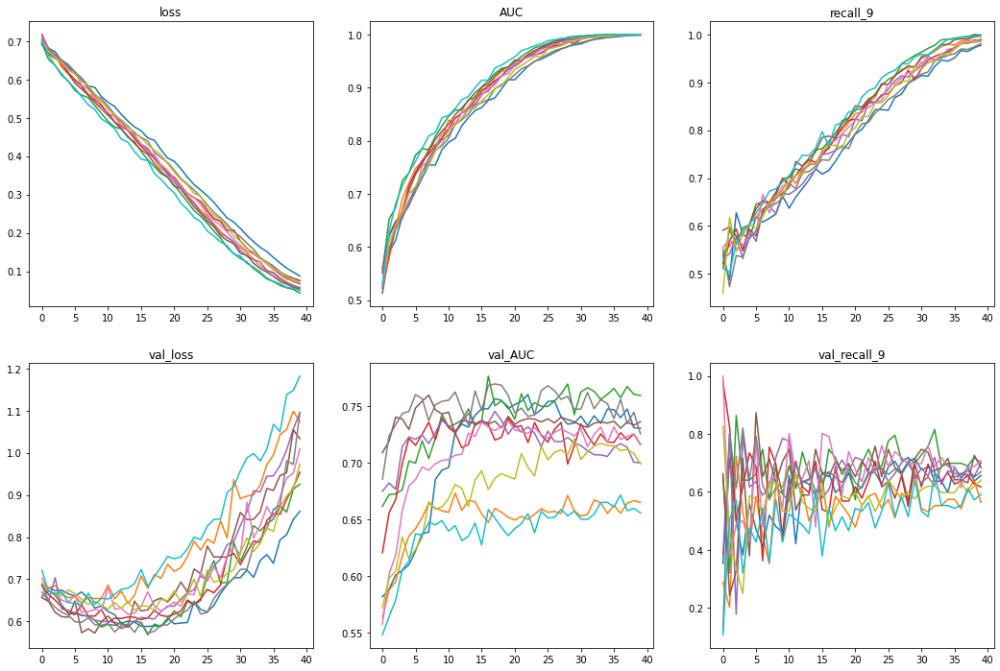

In [22]:
plot_performance(cnn_21_performance)

In [24]:
# unit_size 1 -> 2, dense_dim 16 -> 24, dense_dropout false -> true
cnn_22 = keras.wrappers.scikit_learn.KerasClassifier(build_fn = build_cnn, filters = 32, n_units = 4, unit_size = 2, n_dense = 2, 
                                                     dense_dim = 24, dense_dropout = True, conv_dropout = False, learning_rate = 0.0001)

cnn_22_performance = cross_validate(cnn_22, X_train, y_train, K = 10, epochs = 40)

Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_50 (Conv2D)           (None, 128, 862, 32)      832       
_________________________________________________________________
max_pooling2d_50 (MaxPooling (None, 64, 431, 32)       0         
_________________________________________________________________
conv2d_51 (Conv2D)           (None, 64, 431, 64)       18496     
_________________________________________________________________
conv2d_52 (Conv2D)           (None, 64, 431, 64)       36928     
_________________________________________________________________
max_pooling2d_51 (MaxPooling (None, 32, 215, 64)       0         
_________________________________________________________________
conv2d_53 (Conv2D)           (None, 32, 215, 32)       18464     
_________________________________________________________________
conv2d_54 (Conv2D)           (None, 32, 215, 32)     

1800/1800 [==============================] - 16s 9ms/sample - loss: 0.4766 - AUC: 0.8430 - recall_11: 0.6976 - val_loss: 0.6464 - val_AUC: 0.7260 - val_recall_11: 0.5957
Epoch 18/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.4619 - AUC: 0.8509 - recall_11: 0.6865 - val_loss: 0.6904 - val_AUC: 0.7144 - val_recall_11: 0.5851
Epoch 19/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.4406 - AUC: 0.8662 - recall_11: 0.7053 - val_loss: 0.7337 - val_AUC: 0.7022 - val_recall_11: 0.6064
Epoch 20/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.4345 - AUC: 0.8737 - recall_11: 0.7296 - val_loss: 0.8221 - val_AUC: 0.7168 - val_recall_11: 0.5957
Epoch 21/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.3979 - AUC: 0.8994 - recall_11: 0.7616 - val_loss: 0.7988 - val_AUC: 0.7146 - val_recall_11: 0.5638
Epoch 22/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.3962 - AUC: 0.8956 -

1800/1800 [==============================] - 19s 11ms/sample - loss: 0.7835 - AUC: 0.5108 - recall_13: 0.5434 - val_loss: 0.6890 - val_AUC: 0.5577 - val_recall_13: 0.8824
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7505 - AUC: 0.4927 - recall_13: 0.5579 - val_loss: 0.7112 - val_AUC: 0.6182 - val_recall_13: 1.0000
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7398 - AUC: 0.5180 - recall_13: 0.6147 - val_loss: 0.6783 - val_AUC: 0.6520 - val_recall_13: 0.8922
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7476 - AUC: 0.4982 - recall_13: 0.5702 - val_loss: 0.6730 - val_AUC: 0.6417 - val_recall_13: 0.8529
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7285 - AUC: 0.5374 - recall_13: 0.5668 - val_loss: 0.6897 - val_AUC: 0.6447 - val_recall_13: 0.9020
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7200 - AUC: 0.5422 - rec

1800/1800 [==============================] - 19s 11ms/sample - loss: 0.8291 - AUC: 0.5049 - recall_14: 0.4681 - val_loss: 0.7507 - val_AUC: 0.5962 - val_recall_14: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.8121 - AUC: 0.4881 - recall_14: 0.4793 - val_loss: 0.7369 - val_AUC: 0.6045 - val_recall_14: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.8049 - AUC: 0.4950 - recall_14: 0.4502 - val_loss: 0.7442 - val_AUC: 0.6642 - val_recall_14: 0.0187
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7973 - AUC: 0.5119 - recall_14: 0.4446 - val_loss: 0.7961 - val_AUC: 0.6430 - val_recall_14: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7769 - AUC: 0.5177 - recall_14: 0.4882 - val_loss: 0.6925 - val_AUC: 0.6369 - val_recall_14: 0.2710
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7708 - AUC: 

1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7171 - AUC: 0.4975 - recall_15: 0.4464 - val_loss: 0.7234 - val_AUC: 0.6864 - val_recall_15: 1.0000
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6994 - AUC: 0.5253 - recall_15: 0.5569 - val_loss: 0.7004 - val_AUC: 0.6953 - val_recall_15: 1.0000
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7031 - AUC: 0.4997 - recall_15: 0.4210 - val_loss: 0.7096 - val_AUC: 0.7122 - val_recall_15: 1.0000
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6987 - AUC: 0.5249 - recall_15: 0.5061 - val_loss: 0.6868 - val_AUC: 0.7058 - val_recall_15: 1.0000
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6884 - AUC: 0.5610 - recall_15: 0.4906 - val_loss: 0.6595 - val_AUC: 0.6830 - val_recall_15: 0.5474
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6709 - AUC: 0.6163 - rec

1800/1800 [==============================] - 18s 10ms/sample - loss: 0.7199 - AUC: 0.5191 - recall_16: 0.5675 - val_loss: 0.7249 - val_AUC: 0.5200 - val_recall_16: 1.0000
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7090 - AUC: 0.5062 - recall_16: 0.6029 - val_loss: 0.7036 - val_AUC: 0.5718 - val_recall_16: 1.0000
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7028 - AUC: 0.5188 - recall_16: 0.6117 - val_loss: 0.6883 - val_AUC: 0.5654 - val_recall_16: 0.3333
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6963 - AUC: 0.5354 - recall_16: 0.6029 - val_loss: 0.7008 - val_AUC: 0.5787 - val_recall_16: 1.0000
Epoch 5/40
1800/1800 [==============================] - 17s 9ms/sample - loss: 0.6972 - AUC: 0.5468 - recall_16: 0.6261 - val_loss: 0.6993 - val_AUC: 0.5608 - val_recall_16: 0.8854
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6788 - AUC: 0.5999 - rec

1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7354 - AUC: 0.5135 - recall_17: 0.4720 - val_loss: 0.6786 - val_AUC: 0.6848 - val_recall_17: 1.0000
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7323 - AUC: 0.4794 - recall_17: 0.4362 - val_loss: 0.7315 - val_AUC: 0.6812 - val_recall_17: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7187 - AUC: 0.5152 - recall_17: 0.5201 - val_loss: 0.7211 - val_AUC: 0.5659 - val_recall_17: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7348 - AUC: 0.4728 - recall_17: 0.3579 - val_loss: 0.6965 - val_AUC: 0.4176 - val_recall_17: 0.1415
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7107 - AUC: 0.5174 - recall_17: 0.5101 - val_loss: 0.6876 - val_AUC: 0.6703 - val_recall_17: 0.1321
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7161 - AUC: 0.51

1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7915 - AUC: 0.4924 - recall_18: 0.4515 - val_loss: 0.6892 - val_AUC: 0.5850 - val_recall_18: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7551 - AUC: 0.4937 - recall_18: 0.4593 - val_loss: 0.6961 - val_AUC: 0.5926 - val_recall_18: 1.0000
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7562 - AUC: 0.5005 - recall_18: 0.4901 - val_loss: 0.6826 - val_AUC: 0.6251 - val_recall_18: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7340 - AUC: 0.5239 - recall_18: 0.4824 - val_loss: 0.7129 - val_AUC: 0.5828 - val_recall_18: 0.9348
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7451 - AUC: 0.5193 - recall_18: 0.5330 - val_loss: 0.6997 - val_AUC: 0.5550 - val_recall_18: 0.9891
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7244 - AUC: 0.54

1800/1800 [==============================] - 19s 11ms/sample - loss: 0.7374 - AUC: 0.5301 - recall_19: 0.5362 - val_loss: 0.7228 - val_AUC: 0.5683 - val_recall_19: 1.0000
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7269 - AUC: 0.5211 - recall_19: 0.5373 - val_loss: 0.7046 - val_AUC: 0.5737 - val_recall_19: 1.0000
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7105 - AUC: 0.5496 - recall_19: 0.5708 - val_loss: 0.7356 - val_AUC: 0.5559 - val_recall_19: 1.0000
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7120 - AUC: 0.5459 - recall_19: 0.5708 - val_loss: 0.6903 - val_AUC: 0.5660 - val_recall_19: 0.5146
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7113 - AUC: 0.5668 - recall_19: 0.5819 - val_loss: 0.7074 - val_AUC: 0.5530 - val_recall_19: 0.6990
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6864 - AUC: 0.6017 - rec

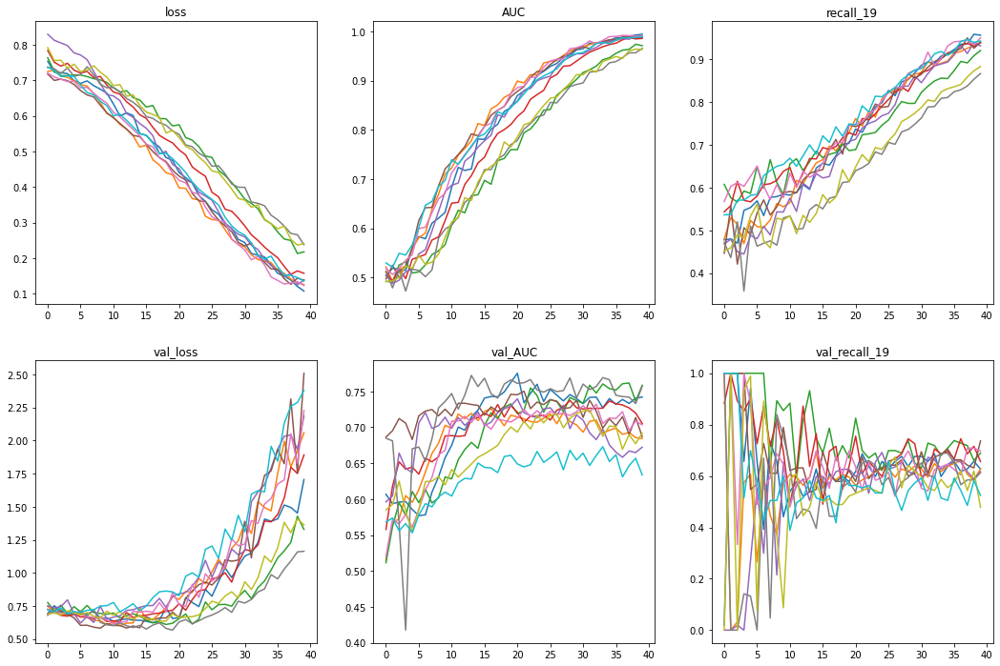

In [25]:
plot_performance(cnn_22_performance)

In [26]:
# n_dense 2 -> 3
cnn_23 = keras.wrappers.scikit_learn.KerasClassifier(build_fn = build_cnn, filters = 32, n_units = 4, unit_size = 2, n_dense = 3, 
                                                     dense_dim = 24, dense_dropout = True, conv_dropout = False, learning_rate = 0.0001)

cnn_23_performance = cross_validate(cnn_23, X_train, y_train, K = 10, epochs = 40)

Model: "sequential_20"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_140 (Conv2D)          (None, 128, 862, 32)      832       
_________________________________________________________________
max_pooling2d_100 (MaxPoolin (None, 64, 431, 32)       0         
_________________________________________________________________
conv2d_141 (Conv2D)          (None, 64, 431, 64)       18496     
_________________________________________________________________
conv2d_142 (Conv2D)          (None, 64, 431, 64)       36928     
_________________________________________________________________
max_pooling2d_101 (MaxPoolin (None, 32, 215, 64)       0         
_________________________________________________________________
conv2d_143 (Conv2D)          (None, 32, 215, 32)       18464     
_________________________________________________________________
conv2d_144 (Conv2D)          (None, 32, 215, 32)     

Epoch 28/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.5197 - AUC: 0.8010 - recall_20: 0.6258 - val_loss: 0.6953 - val_AUC: 0.7201 - val_recall_20: 0.5784
Epoch 29/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.5153 - AUC: 0.8103 - recall_20: 0.6682 - val_loss: 0.6716 - val_AUC: 0.7318 - val_recall_20: 0.5588
Epoch 30/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.5018 - AUC: 0.8155 - recall_20: 0.6693 - val_loss: 0.8029 - val_AUC: 0.7220 - val_recall_20: 0.5294
Epoch 31/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.4914 - AUC: 0.8250 - recall_20: 0.6526 - val_loss: 0.7320 - val_AUC: 0.7429 - val_recall_20: 0.5392
Epoch 32/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.4699 - AUC: 0.8417 - recall_20: 0.6704 - val_loss: 0.8572 - val_AUC: 0.7409 - val_recall_20: 0.6471
Epoch 33/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.4496 - A

Epoch 15/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7415 - AUC: 0.6027 - recall_21: 0.6115 - val_loss: 0.7654 - val_AUC: 0.6248 - val_recall_21: 0.7447
Epoch 16/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7242 - AUC: 0.6151 - recall_21: 0.6004 - val_loss: 0.7173 - val_AUC: 0.6369 - val_recall_21: 0.7128
Epoch 17/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7048 - AUC: 0.6417 - recall_21: 0.6435 - val_loss: 0.6820 - val_AUC: 0.6605 - val_recall_21: 0.6809
Epoch 18/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6939 - AUC: 0.6515 - recall_21: 0.6291 - val_loss: 0.6915 - val_AUC: 0.6815 - val_recall_21: 0.7660
Epoch 19/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6751 - AUC: 0.6666 - recall_21: 0.6413 - val_loss: 0.7089 - val_AUC: 0.6537 - val_recall_21: 0.6596
Epoch 20/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.6879 - A

Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7741 - AUC: 0.5110 - recall_22: 0.5496 - val_loss: 0.6972 - val_AUC: 0.4403 - val_recall_22: 1.0000
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7838 - AUC: 0.5044 - recall_22: 0.5173 - val_loss: 0.7204 - val_AUC: 0.4243 - val_recall_22: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7583 - AUC: 0.5142 - recall_22: 0.4682 - val_loss: 0.6988 - val_AUC: 0.4383 - val_recall_22: 0.6408
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7729 - AUC: 0.4995 - recall_22: 0.4404 - val_loss: 0.6991 - val_AUC: 0.4365 - val_recall_22: 0.0097
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7554 - AUC: 0.5163 - recall_22: 0.4638 - val_loss: 0.7011 - val_AUC: 0.4251 - val_recall_22: 0.3398
Epoch 7/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7412 - AUC

1800/1800 [==============================] - 19s 10ms/sample - loss: 0.8458 - AUC: 0.4890 - recall_23: 0.5590 - val_loss: 0.6976 - val_AUC: 0.4809 - val_recall_23: 1.0000
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.8074 - AUC: 0.5001 - recall_23: 0.5356 - val_loss: 0.7487 - val_AUC: 0.5978 - val_recall_23: 1.0000
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7808 - AUC: 0.5236 - recall_23: 0.5312 - val_loss: 0.7113 - val_AUC: 0.5782 - val_recall_23: 0.0098
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7989 - AUC: 0.4892 - recall_23: 0.5256 - val_loss: 0.7224 - val_AUC: 0.6179 - val_recall_23: 1.0000
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.8172 - AUC: 0.4679 - recall_23: 0.5234 - val_loss: 0.6980 - val_AUC: 0.6066 - val_recall_23: 1.0000
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7780 - AUC: 0.5214 - rec

1800/1800 [==============================] - 19s 11ms/sample - loss: 0.7585 - AUC: 0.5039 - recall_24: 0.5106 - val_loss: 0.7193 - val_AUC: 0.5755 - val_recall_24: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7574 - AUC: 0.4832 - recall_24: 0.5487 - val_loss: 0.7333 - val_AUC: 0.5877 - val_recall_24: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7618 - AUC: 0.4734 - recall_24: 0.4905 - val_loss: 0.6820 - val_AUC: 0.6052 - val_recall_24: 0.4393
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7429 - AUC: 0.5018 - recall_24: 0.5409 - val_loss: 0.7544 - val_AUC: 0.6387 - val_recall_24: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7408 - AUC: 0.5038 - recall_24: 0.4468 - val_loss: 0.7331 - val_AUC: 0.6352 - val_recall_24: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7233 - A

1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7558 - AUC: 0.5002 - recall_25: 0.6033 - val_loss: 0.6950 - val_AUC: 0.5297 - val_recall_25: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7462 - AUC: 0.4769 - recall_25: 0.5691 - val_loss: 0.6951 - val_AUC: 0.5995 - val_recall_25: 1.0000
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7291 - AUC: 0.5089 - recall_25: 0.6442 - val_loss: 0.6866 - val_AUC: 0.6491 - val_recall_25: 0.1053
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7380 - AUC: 0.4947 - recall_25: 0.6409 - val_loss: 0.6890 - val_AUC: 0.6147 - val_recall_25: 0.8632
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7204 - AUC: 0.5204 - recall_25: 0.6166 - val_loss: 0.7093 - val_AUC: 0.6595 - val_recall_25: 1.0000
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7350 - AUC: 0.4936 -

Train on 1800 samples, validate on 200 samples
Epoch 1/40
1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7525 - AUC: 0.5186 - recall_26: 0.4580 - val_loss: 0.7014 - val_AUC: 0.5934 - val_recall_26: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7491 - AUC: 0.5119 - recall_26: 0.4591 - val_loss: 0.6881 - val_AUC: 0.5980 - val_recall_26: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7486 - AUC: 0.5095 - recall_26: 0.4845 - val_loss: 0.6930 - val_AUC: 0.4458 - val_recall_26: 0.0104
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7565 - AUC: 0.4861 - recall_26: 0.4303 - val_loss: 0.6869 - val_AUC: 0.5879 - val_recall_26: 0.1250
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7377 - AUC: 0.5318 - recall_26: 0.4436 - val_loss: 0.6996 - val_AUC: 0.5849 - val_recall_26: 1.0000
Epoch 6/40
1800/1800 [=================

1800/1800 [==============================] - 19s 11ms/sample - loss: 0.7673 - AUC: 0.4991 - recall_27: 0.3434 - val_loss: 0.7432 - val_AUC: 0.6335 - val_recall_27: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7643 - AUC: 0.5009 - recall_27: 0.3098 - val_loss: 0.7941 - val_AUC: 0.5954 - val_recall_27: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7395 - AUC: 0.5111 - recall_27: 0.2651 - val_loss: 0.7352 - val_AUC: 0.6482 - val_recall_27: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7362 - AUC: 0.4861 - recall_27: 0.2550 - val_loss: 0.7399 - val_AUC: 0.5558 - val_recall_27: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7276 - AUC: 0.5067 - recall_27: 0.2763 - val_loss: 0.7277 - val_AUC: 0.5929 - val_recall_27: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7278

1800/1800 [==============================] - 19s 10ms/sample - loss: 0.7324 - AUC: 0.5066 - recall_28: 0.4482 - val_loss: 0.7007 - val_AUC: 0.5059 - val_recall_28: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7283 - AUC: 0.4962 - recall_28: 0.4548 - val_loss: 0.6904 - val_AUC: 0.5243 - val_recall_28: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7252 - AUC: 0.5044 - recall_28: 0.4923 - val_loss: 0.6889 - val_AUC: 0.5963 - val_recall_28: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7293 - AUC: 0.4837 - recall_28: 0.4758 - val_loss: 0.6886 - val_AUC: 0.5806 - val_recall_28: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7245 - AUC: 0.4925 - recall_28: 0.4262 - val_loss: 0.6947 - val_AUC: 0.5986 - val_recall_28: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7054

1800/1800 [==============================] - 19s 11ms/sample - loss: 0.7732 - AUC: 0.4996 - recall_29: 0.5819 - val_loss: 0.7017 - val_AUC: 0.4970 - val_recall_29: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7441 - AUC: 0.5101 - recall_29: 0.5463 - val_loss: 0.6960 - val_AUC: 0.4964 - val_recall_29: 1.0000
Epoch 3/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7533 - AUC: 0.4776 - recall_29: 0.5072 - val_loss: 0.6971 - val_AUC: 0.5562 - val_recall_29: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7314 - AUC: 0.5052 - recall_29: 0.5396 - val_loss: 0.6977 - val_AUC: 0.4595 - val_recall_29: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7405 - AUC: 0.5027 - recall_29: 0.5117 - val_loss: 0.6989 - val_AUC: 0.5633 - val_recall_29: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 16s 9ms/sample - loss: 0.7418 - A

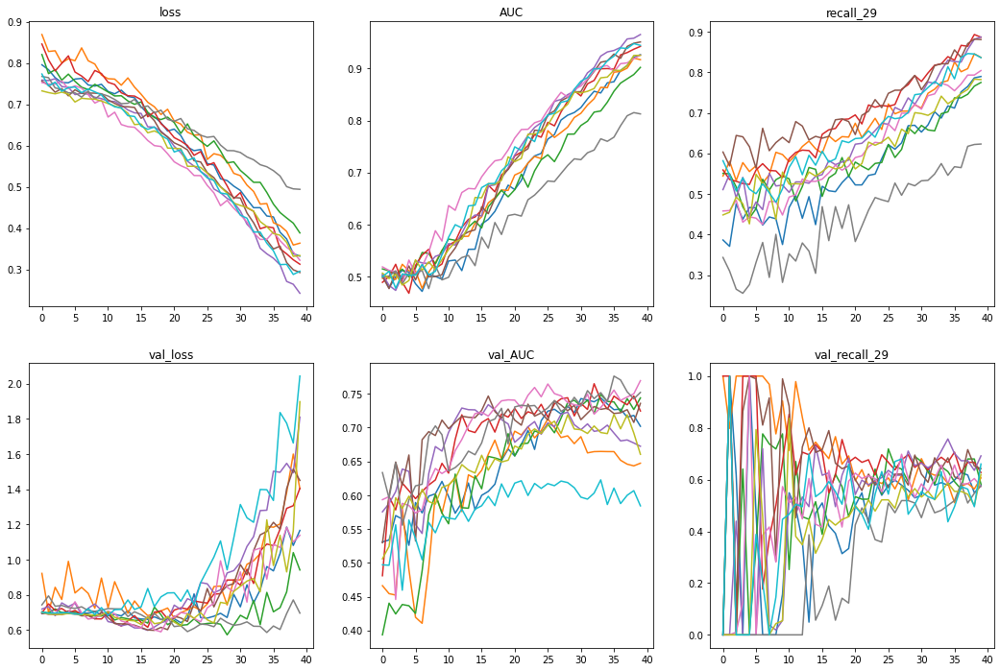

In [27]:
plot_performance(cnn_23_performance)

In [31]:
# dropout_p 0.2 -> 0.5, kernel_size 3 -> 4, changed n_filters -2 to -1
cnn_24 = keras.wrappers.scikit_learn.KerasClassifier(build_fn = build_cnn, filters = 32, n_units = 4, unit_size = 2, n_dense = 3, 
                                                     dense_dim = 24, dense_dropout = True, conv_dropout = False, learning_rate = 0.0001,
                                                    dropout_p = 0.5, kernel_size = 4)

cnn_24_performance = cross_validate(cnn_24, X_train, y_train, K = 10, epochs = 40)

Model: "sequential_30"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_230 (Conv2D)          (None, 128, 862, 32)      1184      
_________________________________________________________________
max_pooling2d_150 (MaxPoolin (None, 64, 431, 32)       0         
_________________________________________________________________
conv2d_231 (Conv2D)          (None, 64, 431, 96)       49248     
_________________________________________________________________
conv2d_232 (Conv2D)          (None, 64, 431, 96)       147552    
_________________________________________________________________
max_pooling2d_151 (MaxPoolin (None, 32, 215, 96)       0         
_________________________________________________________________
conv2d_233 (Conv2D)          (None, 32, 215, 64)       98368     
_________________________________________________________________
conv2d_234 (Conv2D)          (None, 32, 215, 64)     

Epoch 28/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7312 - AUC: 0.5143 - recall_30: 0.6292 - val_loss: 0.8125 - val_AUC: 0.4861 - val_recall_30: 1.0000
Epoch 29/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7284 - AUC: 0.5207 - recall_30: 0.6169 - val_loss: 0.7952 - val_AUC: 0.5401 - val_recall_30: 1.0000
Epoch 30/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7321 - AUC: 0.5146 - recall_30: 0.6136 - val_loss: 0.7708 - val_AUC: 0.4471 - val_recall_30: 1.0000
Epoch 31/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7382 - AUC: 0.5026 - recall_30: 0.6359 - val_loss: 0.7736 - val_AUC: 0.5000 - val_recall_30: 1.0000
Epoch 32/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7407 - AUC: 0.4952 - recall_30: 0.6214 - val_loss: 0.8213 - val_AUC: 0.5000 - val_recall_30: 1.0000
Epoch 33/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.74

1800/1800 [==============================] - 33s 18ms/sample - loss: 0.8163 - AUC: 0.4935 - recall_32: 0.5217 - val_loss: 0.8136 - val_AUC: 0.5548 - val_recall_32: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7860 - AUC: 0.5122 - recall_32: 0.5329 - val_loss: 0.7120 - val_AUC: 0.5150 - val_recall_32: 1.0000
Epoch 3/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7887 - AUC: 0.5062 - recall_32: 0.5217 - val_loss: 0.7294 - val_AUC: 0.5461 - val_recall_32: 1.0000
Epoch 4/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7849 - AUC: 0.4985 - recall_32: 0.5028 - val_loss: 0.7208 - val_AUC: 0.5272 - val_recall_32: 1.0000
Epoch 5/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7872 - AUC: 0.4936 - recall_32: 0.5084 - val_loss: 0.6930 - val_AUC: 0.5493 - val_recall_32: 0.2330
Epoch 6/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7921 - AUC: 0.4

1800/1800 [==============================] - 33s 18ms/sample - loss: 0.8760 - AUC: 0.4929 - recall_33: 0.5924 - val_loss: 0.6950 - val_AUC: 0.5068 - val_recall_33: 1.0000
Epoch 2/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.8421 - AUC: 0.5164 - recall_33: 0.6036 - val_loss: 0.6966 - val_AUC: 0.4451 - val_recall_33: 0.0098
Epoch 3/40
1800/1800 [==============================] - 30s 16ms/sample - loss: 0.8504 - AUC: 0.5102 - recall_33: 0.6047 - val_loss: 0.7106 - val_AUC: 0.4505 - val_recall_33: 1.0000
Epoch 4/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.8370 - AUC: 0.5074 - recall_33: 0.6036 - val_loss: 0.7080 - val_AUC: 0.4771 - val_recall_33: 1.0000
Epoch 5/40
1800/1800 [==============================] - 30s 16ms/sample - loss: 0.8432 - AUC: 0.4904 - recall_33: 0.5757 - val_loss: 0.6931 - val_AUC: 0.4359 - val_recall_33: 1.0000
Epoch 6/40
1800/1800 [==============================] - 30s 16ms/sample - loss: 0.8413 - AUC: 0.4960 

1800/1800 [==============================] - 33s 18ms/sample - loss: 0.9246 - AUC: 0.4791 - recall_34: 0.3617 - val_loss: 1.4727 - val_AUC: 0.5783 - val_recall_34: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.9096 - AUC: 0.4894 - recall_34: 0.3158 - val_loss: 1.4506 - val_AUC: 0.6180 - val_recall_34: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.8925 - AUC: 0.4942 - recall_34: 0.3695 - val_loss: 1.6765 - val_AUC: 0.5822 - val_recall_34: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.8711 - AUC: 0.5078 - recall_34: 0.3796 - val_loss: 1.5094 - val_AUC: 0.5262 - val_recall_34: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.8618 - AUC: 0.5140 - recall_34: 0.3830 - val_loss: 1.1489 - val_AUC: 0.5495 - val_recall_34: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0

1800/1800 [==============================] - 33s 19ms/sample - loss: 0.8195 - AUC: 0.4778 - recall_35: 0.4133 - val_loss: 0.8565 - val_AUC: 0.5122 - val_recall_35: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 30s 16ms/sample - loss: 0.7908 - AUC: 0.4899 - recall_35: 0.3901 - val_loss: 0.9285 - val_AUC: 0.5959 - val_recall_35: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7779 - AUC: 0.5037 - recall_35: 0.3956 - val_loss: 0.8433 - val_AUC: 0.5103 - val_recall_35: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 30s 16ms/sample - loss: 0.7789 - AUC: 0.4996 - recall_35: 0.4055 - val_loss: 0.7795 - val_AUC: 0.5304 - val_recall_35: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7750 - AUC: 0.4987 - recall_35: 0.4099 - val_loss: 0.8655 - val_AUC: 0.5453 - val_recall_35: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 30s 16ms/sample - loss: 0

1800/1800 [==============================] - 33s 18ms/sample - loss: 0.9173 - AUC: 0.5007 - recall_36: 0.6029 - val_loss: 1.7083 - val_AUC: 0.5091 - val_recall_36: 1.0000
Epoch 2/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.9198 - AUC: 0.4985 - recall_36: 0.6515 - val_loss: 2.1850 - val_AUC: 0.4768 - val_recall_36: 1.0000
Epoch 3/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.9179 - AUC: 0.4768 - recall_36: 0.6139 - val_loss: 1.4658 - val_AUC: 0.4565 - val_recall_36: 1.0000
Epoch 4/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.9151 - AUC: 0.4821 - recall_36: 0.6283 - val_loss: 1.5407 - val_AUC: 0.4988 - val_recall_36: 1.0000
Epoch 5/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.8697 - AUC: 0.5083 - recall_36: 0.6493 - val_loss: 1.8541 - val_AUC: 0.5116 - val_recall_36: 1.0000
Epoch 6/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.8502 - AUC: 0.5218 

1800/1800 [==============================] - 32s 18ms/sample - loss: 0.8016 - AUC: 0.5025 - recall_37: 0.5917 - val_loss: 0.8145 - val_AUC: 0.3119 - val_recall_37: 1.0000
Epoch 2/40
1800/1800 [==============================] - 30s 16ms/sample - loss: 0.8017 - AUC: 0.4887 - recall_37: 0.5783 - val_loss: 0.8088 - val_AUC: 0.5736 - val_recall_37: 1.0000
Epoch 3/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7949 - AUC: 0.4944 - recall_37: 0.6018 - val_loss: 0.7917 - val_AUC: 0.5103 - val_recall_37: 1.0000
Epoch 4/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7765 - AUC: 0.5174 - recall_37: 0.6141 - val_loss: 0.8911 - val_AUC: 0.3858 - val_recall_37: 1.0000
Epoch 5/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7880 - AUC: 0.5020 - recall_37: 0.5828 - val_loss: 0.7964 - val_AUC: 0.6218 - val_recall_37: 1.0000
Epoch 6/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7882 - AUC: 0.4983 

1800/1800 [==============================] - 34s 19ms/sample - loss: 0.8616 - AUC: 0.4949 - recall_38: 0.5848 - val_loss: 0.6979 - val_AUC: 0.5315 - val_recall_38: 1.0000
Epoch 2/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.8146 - AUC: 0.5062 - recall_38: 0.5683 - val_loss: 0.7261 - val_AUC: 0.5361 - val_recall_38: 1.0000
Epoch 3/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7931 - AUC: 0.5093 - recall_38: 0.6013 - val_loss: 0.6985 - val_AUC: 0.5714 - val_recall_38: 1.0000
Epoch 4/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.8330 - AUC: 0.4807 - recall_38: 0.5683 - val_loss: 0.7737 - val_AUC: 0.4200 - val_recall_38: 1.0000
Epoch 5/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.8215 - AUC: 0.4916 - recall_38: 0.5705 - val_loss: 0.7758 - val_AUC: 0.4937 - val_recall_38: 1.0000
Epoch 6/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7921 - AUC: 0.5005 

1800/1800 [==============================] - 33s 18ms/sample - loss: 0.8128 - AUC: 0.5021 - recall_39: 0.4103 - val_loss: 1.0273 - val_AUC: 0.4602 - val_recall_39: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.8106 - AUC: 0.4815 - recall_39: 0.4058 - val_loss: 0.9865 - val_AUC: 0.4970 - val_recall_39: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7721 - AUC: 0.5238 - recall_39: 0.4459 - val_loss: 0.7856 - val_AUC: 0.4341 - val_recall_39: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7970 - AUC: 0.4977 - recall_39: 0.4214 - val_loss: 0.9545 - val_AUC: 0.4748 - val_recall_39: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7806 - AUC: 0.5074 - recall_39: 0.4359 - val_loss: 1.0513 - val_AUC: 0.5450 - val_recall_39: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 30s 16ms/sample - loss: 0

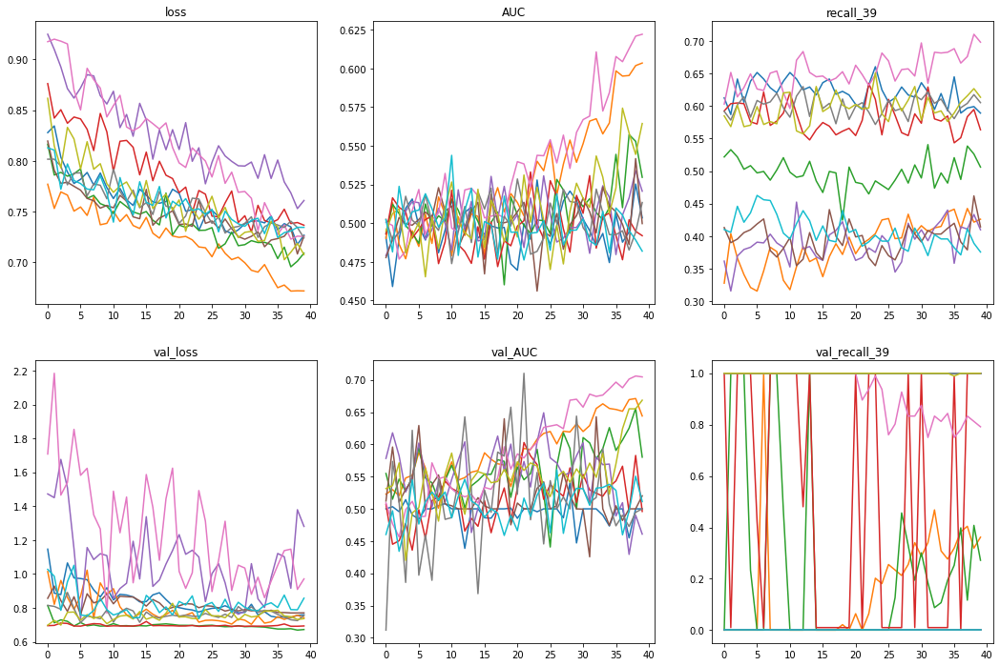

In [32]:
plot_performance(cnn_24_performance)

In [34]:
# dropout_p 0.5 -> 0.2
cnn_25 = keras.wrappers.scikit_learn.KerasClassifier(build_fn = build_cnn, filters = 32, n_units = 4, unit_size = 2, n_dense = 3, 
                                                     dense_dim = 24, dense_dropout = True, conv_dropout = False, learning_rate = 0.0001,
                                                     kernel_size = 4)

cnn_25_performance = cross_validate(cnn_25, X_train, y_train, K = 10, epochs = 40)

Model: "sequential_40"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_320 (Conv2D)          (None, 128, 862, 32)      1184      
_________________________________________________________________
max_pooling2d_200 (MaxPoolin (None, 64, 431, 32)       0         
_________________________________________________________________
conv2d_321 (Conv2D)          (None, 64, 431, 96)       49248     
_________________________________________________________________
conv2d_322 (Conv2D)          (None, 64, 431, 96)       147552    
_________________________________________________________________
max_pooling2d_201 (MaxPoolin (None, 32, 215, 96)       0         
_________________________________________________________________
conv2d_323 (Conv2D)          (None, 32, 215, 64)       98368     
_________________________________________________________________
conv2d_324 (Conv2D)          (None, 32, 215, 64)     

Epoch 28/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.4117 - AUC: 0.8805 - recall_40: 0.7372 - val_loss: 1.0499 - val_AUC: 0.7276 - val_recall_40: 0.6275
Epoch 29/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.4122 - AUC: 0.8832 - recall_40: 0.7494 - val_loss: 0.9975 - val_AUC: 0.7318 - val_recall_40: 0.6275
Epoch 30/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.3774 - AUC: 0.9030 - recall_40: 0.7739 - val_loss: 1.1917 - val_AUC: 0.7347 - val_recall_40: 0.6569
Epoch 31/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.3556 - AUC: 0.9116 - recall_40: 0.7951 - val_loss: 1.2834 - val_AUC: 0.7085 - val_recall_40: 0.6569
Epoch 32/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.3524 - AUC: 0.9130 - recall_40: 0.7795 - val_loss: 1.4679 - val_AUC: 0.7285 - val_recall_40: 0.6471
Epoch 33/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.33

1800/1800 [==============================] - 32s 18ms/sample - loss: 0.7720 - AUC: 0.5079 - recall_42: 0.6455 - val_loss: 0.7602 - val_AUC: 0.5058 - val_recall_42: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 30s 16ms/sample - loss: 0.7534 - AUC: 0.5230 - recall_42: 0.6377 - val_loss: 0.7592 - val_AUC: 0.5204 - val_recall_42: 1.0000
Epoch 3/40
1800/1800 [==============================] - 30s 16ms/sample - loss: 0.7801 - AUC: 0.4697 - recall_42: 0.6499 - val_loss: 0.7169 - val_AUC: 0.5391 - val_recall_42: 1.0000
Epoch 4/40
1800/1800 [==============================] - 30s 16ms/sample - loss: 0.7439 - AUC: 0.5094 - recall_42: 0.5864 - val_loss: 0.7535 - val_AUC: 0.5107 - val_recall_42: 1.0000
Epoch 5/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7542 - AUC: 0.4932 - recall_42: 0.7113 - val_loss: 0.6878 - val_AUC: 0.5602 - val_recall_42: 0.9612
Epoch 6/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7430 - AUC: 0.5

1800/1800 [==============================] - 34s 19ms/sample - loss: 0.8279 - AUC: 0.4793 - recall_43: 0.4889 - val_loss: 0.6950 - val_AUC: 0.5545 - val_recall_43: 0.0196
Epoch 2/40
1800/1800 [==============================] - 30s 16ms/sample - loss: 0.7867 - AUC: 0.5179 - recall_43: 0.4911 - val_loss: 0.6875 - val_AUC: 0.6022 - val_recall_43: 0.5392
Epoch 3/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.7857 - AUC: 0.5083 - recall_43: 0.5223 - val_loss: 0.6887 - val_AUC: 0.5740 - val_recall_43: 0.5882
Epoch 4/40
1800/1800 [==============================] - 30s 16ms/sample - loss: 0.7907 - AUC: 0.4986 - recall_43: 0.5056 - val_loss: 0.7075 - val_AUC: 0.6319 - val_recall_43: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7838 - AUC: 0.4990 - recall_43: 0.4822 - val_loss: 0.6766 - val_AUC: 0.6377 - val_recall_43: 0.4706
Epoch 6/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7698 - AUC: 0.5

1800/1800 [==============================] - 33s 18ms/sample - loss: 0.7559 - AUC: 0.4819 - recall_44: 0.4166 - val_loss: 0.7066 - val_AUC: 0.5233 - val_recall_44: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7300 - AUC: 0.5034 - recall_44: 0.4826 - val_loss: 0.7520 - val_AUC: 0.5836 - val_recall_44: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7360 - AUC: 0.5012 - recall_44: 0.4636 - val_loss: 0.7114 - val_AUC: 0.5196 - val_recall_44: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7241 - AUC: 0.5114 - recall_44: 0.5218 - val_loss: 0.7062 - val_AUC: 0.4809 - val_recall_44: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7340 - AUC: 0.4978 - recall_44: 0.5476 - val_loss: 0.7357 - val_AUC: 0.5079 - val_recall_44: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0

1800/1800 [==============================] - 33s 18ms/sample - loss: 0.7546 - AUC: 0.4985 - recall_45: 0.4298 - val_loss: 0.6924 - val_AUC: 0.4949 - val_recall_45: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7358 - AUC: 0.4958 - recall_45: 0.4088 - val_loss: 0.6977 - val_AUC: 0.5684 - val_recall_45: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7275 - AUC: 0.5087 - recall_45: 0.4519 - val_loss: 0.6946 - val_AUC: 0.5523 - val_recall_45: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7285 - AUC: 0.4854 - recall_45: 0.3680 - val_loss: 0.6943 - val_AUC: 0.5078 - val_recall_45: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7175 - AUC: 0.5016 - recall_45: 0.3580 - val_loss: 0.6962 - val_AUC: 0.6203 - val_recall_45: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 30s 16ms/sample - loss: 0

1800/1800 [==============================] - 34s 19ms/sample - loss: 0.7748 - AUC: 0.4916 - recall_46: 0.4900 - val_loss: 0.6944 - val_AUC: 0.4908 - val_recall_46: 1.0000
Epoch 2/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7630 - AUC: 0.5047 - recall_46: 0.5509 - val_loss: 0.6926 - val_AUC: 0.5000 - val_recall_46: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 30s 16ms/sample - loss: 0.7532 - AUC: 0.5131 - recall_46: 0.5619 - val_loss: 0.6925 - val_AUC: 0.4996 - val_recall_46: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7435 - AUC: 0.5112 - recall_46: 0.5310 - val_loss: 0.6927 - val_AUC: 0.5253 - val_recall_46: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7460 - AUC: 0.5033 - recall_46: 0.4978 - val_loss: 0.6926 - val_AUC: 0.4659 - val_recall_46: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.746

1800/1800 [==============================] - 33s 18ms/sample - loss: 0.8658 - AUC: 0.4930 - recall_47: 0.4933 - val_loss: 0.6998 - val_AUC: 0.5243 - val_recall_47: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.8217 - AUC: 0.4928 - recall_47: 0.4709 - val_loss: 0.7261 - val_AUC: 0.5895 - val_recall_47: 0.0000e+00
Epoch 3/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.8156 - AUC: 0.4994 - recall_47: 0.4888 - val_loss: 0.7233 - val_AUC: 0.6445 - val_recall_47: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.8010 - AUC: 0.5058 - recall_47: 0.4217 - val_loss: 0.7077 - val_AUC: 0.7013 - val_recall_47: 0.0000e+00
Epoch 5/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7896 - AUC: 0.5238 - recall_47: 0.5291 - val_loss: 0.7565 - val_AUC: 0.6451 - val_recall_47: 0.0000e+00
Epoch 6/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0

1800/1800 [==============================] - 33s 18ms/sample - loss: 0.8243 - AUC: 0.4947 - recall_48: 0.4923 - val_loss: 0.7047 - val_AUC: 0.5357 - val_recall_48: 0.0000e+00
Epoch 2/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7925 - AUC: 0.5072 - recall_48: 0.4747 - val_loss: 0.6984 - val_AUC: 0.5354 - val_recall_48: 1.0000
Epoch 3/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.8011 - AUC: 0.4956 - recall_48: 0.4559 - val_loss: 0.7046 - val_AUC: 0.4515 - val_recall_48: 0.0000e+00
Epoch 4/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7852 - AUC: 0.5125 - recall_48: 0.5066 - val_loss: 0.7415 - val_AUC: 0.5683 - val_recall_48: 1.0000
Epoch 5/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7823 - AUC: 0.5102 - recall_48: 0.4923 - val_loss: 0.8353 - val_AUC: 0.4526 - val_recall_48: 1.0000
Epoch 6/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7707 - AUC:

1800/1800 [==============================] - 34s 19ms/sample - loss: 0.8121 - AUC: 0.5144 - recall_49: 0.6054 - val_loss: 0.7627 - val_AUC: 0.5041 - val_recall_49: 1.0000
Epoch 2/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7931 - AUC: 0.5146 - recall_49: 0.6109 - val_loss: 0.7060 - val_AUC: 0.4273 - val_recall_49: 1.0000
Epoch 3/40
1800/1800 [==============================] - 29s 16ms/sample - loss: 0.7771 - AUC: 0.5366 - recall_49: 0.5719 - val_loss: 0.7607 - val_AUC: 0.5405 - val_recall_49: 1.0000
Epoch 4/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7868 - AUC: 0.5106 - recall_49: 0.5474 - val_loss: 0.7712 - val_AUC: 0.5654 - val_recall_49: 1.0000
Epoch 5/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7964 - AUC: 0.4900 - recall_49: 0.5485 - val_loss: 0.7300 - val_AUC: 0.4555 - val_recall_49: 1.0000
Epoch 6/40
1800/1800 [==============================] - 30s 17ms/sample - loss: 0.7918 - AUC: 0.5080 

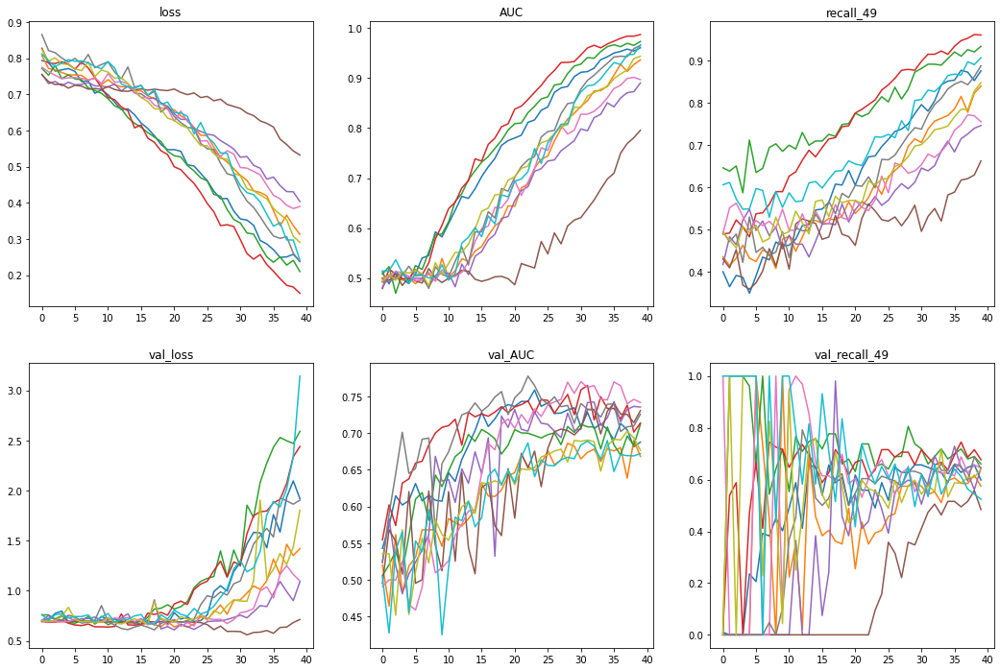

In [35]:
plot_performance(cnn_25_performance)

### Fine-tune best model

In [21]:
param_grid = {
    'hidden_activation' : ['selu','elu'],
    'final_activation' : ['sigmoid'],
    'filters' : [32],
    'n_units' : [4],
    'unit_size' : [2],
    'n_dense' : [2],
    'dense_dim' : [24],
    'kernel_size' : [3],
    'dense_dropout' : [True],
    'optimiser' : ['Adam', 'Adamax']
}

cnn = keras.wrappers.scikit_learn.KerasClassifier(build_cnn)

grid_search_1 = model_selection.GridSearchCV(cnn, param_grid, scoring = ["roc_auc", "recall"], refit = "roc_auc", cv=5,
                                            return_train_score = True)
grid_search_1.fit(X_train, y_train, epochs = 30)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 128, 862, 32)      832       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 64, 431, 32)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 64, 431, 96)       27744     
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 64, 431, 96)       83040     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 32, 215, 96)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 32, 215, 64)       55360     
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 32, 215, 64)       3

1600/1600 [==============================] - 31s 19ms/sample - loss: 0.7536 - AUC: 0.4834 - recall_1: 0.5358
Epoch 2/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.7206 - AUC: 0.4917 - recall_1: 0.6370
Epoch 3/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.7051 - AUC: 0.5082 - recall_1: 0.5667
Epoch 4/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.7129 - AUC: 0.5067 - recall_1: 0.5556
Epoch 5/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.7041 - AUC: 0.5174 - recall_1: 0.6198
Epoch 6/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.6990 - AUC: 0.5375 - recall_1: 0.5877
Epoch 7/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.7015 - AUC: 0.5478 - recall_1: 0.6185
Epoch 8/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.6949 - AUC: 0.5644 - recall_1: 0.6654
Epoch 9/30
1600/1600 [=============================

Epoch 14/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.6089 - AUC: 0.7216 - recall_2: 0.5805
Epoch 15/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.6043 - AUC: 0.7328 - recall_2: 0.6180
Epoch 16/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.5750 - AUC: 0.7575 - recall_2: 0.6205
Epoch 17/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.5392 - AUC: 0.7931 - recall_2: 0.6841
Epoch 18/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.5343 - AUC: 0.7983 - recall_2: 0.6592
Epoch 19/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.5155 - AUC: 0.8122 - recall_2: 0.6767
Epoch 20/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.4925 - AUC: 0.8310 - recall_2: 0.6966
Epoch 21/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.4475 - AUC: 0.8663 - recall_2: 0.7391
Epoch 22/30
1600/1600 [=========

1600/1600 [==============================] - 16s 10ms/sample - loss: 0.4062 - AUC: 0.8952 - recall_3: 0.7831
Epoch 27/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.3857 - AUC: 0.9049 - recall_3: 0.7918
Epoch 28/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.3642 - AUC: 0.9176 - recall_3: 0.8005
Epoch 29/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.3549 - AUC: 0.9218 - recall_3: 0.8166
Epoch 30/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.3371 - AUC: 0.9300 - recall_3: 0.8265
Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_36 (Conv2D)           (None, 128, 862, 32)      832       
_________________________________________________________________
max_pooling2d_20 (MaxPooling (None, 64, 431, 32)       0         
_______________________________________________________

1600/1600 [==============================] - 30s 19ms/sample - loss: 0.7907 - AUC: 0.4942 - recall_5: 0.5229
Epoch 2/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.7694 - AUC: 0.4961 - recall_5: 0.5153
Epoch 3/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.7579 - AUC: 0.5226 - recall_5: 0.5280
Epoch 4/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.7540 - AUC: 0.5236 - recall_5: 0.5534
Epoch 5/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.7380 - AUC: 0.5392 - recall_5: 0.5840
Epoch 6/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.7371 - AUC: 0.5422 - recall_5: 0.5560
Epoch 7/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.7304 - AUC: 0.5494 - recall_5: 0.5712
Epoch 8/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.7378 - AUC: 0.5435 - recall_5: 0.5445
Epoch 9/30
1600/1600 [=============================

Epoch 14/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.6850 - AUC: 0.6444 - recall_6: 0.5580
Epoch 15/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.7018 - AUC: 0.6307 - recall_6: 0.5358
Epoch 16/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.6908 - AUC: 0.6437 - recall_6: 0.5519
Epoch 17/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.7143 - AUC: 0.6156 - recall_6: 0.5506
Epoch 18/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.6825 - AUC: 0.6542 - recall_6: 0.5716
Epoch 19/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.6697 - AUC: 0.6667 - recall_6: 0.5765
Epoch 20/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.6490 - AUC: 0.6846 - recall_6: 0.5741
Epoch 21/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.6461 - AUC: 0.6954 - recall_6: 0.6074
Epoch 22/30
1600/1600 [=========

1600/1600 [==============================] - 16s 10ms/sample - loss: 0.6199 - AUC: 0.7061 - recall_7: 0.6679
Epoch 27/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.6090 - AUC: 0.7182 - recall_7: 0.6629
Epoch 28/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.6137 - AUC: 0.7124 - recall_7: 0.6342
Epoch 29/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.5964 - AUC: 0.7388 - recall_7: 0.6779
Epoch 30/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.5892 - AUC: 0.7448 - recall_7: 0.6854
Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_72 (Conv2D)           (None, 128, 862, 32)      832       
_________________________________________________________________
max_pooling2d_40 (MaxPooling (None, 64, 431, 32)       0         
_______________________________________________________

1600/1600 [==============================] - 29s 18ms/sample - loss: 0.8231 - AUC: 0.4796 - recall_9: 0.4435
Epoch 2/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.7515 - AUC: 0.5081 - recall_9: 0.4849
Epoch 3/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.7511 - AUC: 0.5050 - recall_9: 0.4611
Epoch 4/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.7363 - AUC: 0.5241 - recall_9: 0.4987
Epoch 5/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.7354 - AUC: 0.5203 - recall_9: 0.4849
Epoch 6/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.7504 - AUC: 0.4863 - recall_9: 0.4573
Epoch 7/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.7349 - AUC: 0.5158 - recall_9: 0.4410
Epoch 8/30
1600/1600 [==============================] - 16s 10ms/sample - loss: 0.7257 - AUC: 0.5385 - recall_9: 0.4673
Epoch 9/30
1600/1600 [=============================

Epoch 14/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.5505 - AUC: 0.7850 - recall_10: 0.6247
Epoch 15/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.5271 - AUC: 0.8066 - recall_10: 0.6756
Epoch 16/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.4869 - AUC: 0.8405 - recall_10: 0.7099
Epoch 17/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.4765 - AUC: 0.8487 - recall_10: 0.7036
Epoch 18/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.4638 - AUC: 0.8566 - recall_10: 0.7316
Epoch 19/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.4455 - AUC: 0.8721 - recall_10: 0.7506
Epoch 20/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.4277 - AUC: 0.8807 - recall_10: 0.7646
Epoch 21/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.3966 - AUC: 0.9051 - recall_10: 0.7595
Epoch 22/30
1600/1600 [=========

1600/1600 [==============================] - 10s 6ms/sample - loss: 0.1975 - AUC: 0.9814 - recall_11: 0.9160
Epoch 27/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.1794 - AUC: 0.9851 - recall_11: 0.9358
Epoch 28/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.1753 - AUC: 0.9858 - recall_11: 0.9309
Epoch 29/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.1497 - AUC: 0.9904 - recall_11: 0.9469
Epoch 30/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.1341 - AUC: 0.9933 - recall_11: 0.9469
Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_108 (Conv2D)          (None, 124, 858, 32)      832       
_________________________________________________________________
max_pooling2d_60 (MaxPooling (None, 62, 429, 32)       0         
______________________________________________________

1600/1600 [==============================] - 12s 8ms/sample - loss: 0.7814 - AUC: 0.4975 - recall_13: 0.5378
Epoch 2/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.7349 - AUC: 0.5128 - recall_13: 0.5750
Epoch 3/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.7235 - AUC: 0.5372 - recall_13: 0.5675
Epoch 4/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.6863 - AUC: 0.6021 - recall_13: 0.6121
Epoch 5/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.6973 - AUC: 0.5928 - recall_13: 0.5713
Epoch 6/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.6801 - AUC: 0.6256 - recall_13: 0.6245
Epoch 7/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.6473 - AUC: 0.6727 - recall_13: 0.6406
Epoch 8/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.6493 - AUC: 0.6719 - recall_13: 0.6406
Epoch 9/30
1600/1600 [=============================

Epoch 14/30
1600/1600 [==============================] - 10s 7ms/sample - loss: 0.5239 - AUC: 0.8031 - recall_14: 0.6658
Epoch 15/30
1600/1600 [==============================] - 10s 7ms/sample - loss: 0.5175 - AUC: 0.8100 - recall_14: 0.6972
Epoch 16/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.4992 - AUC: 0.8248 - recall_14: 0.6922
Epoch 17/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.4711 - AUC: 0.8512 - recall_14: 0.7349
Epoch 18/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.4625 - AUC: 0.8542 - recall_14: 0.7224
Epoch 19/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.4332 - AUC: 0.8756 - recall_14: 0.7563
Epoch 20/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.4106 - AUC: 0.8901 - recall_14: 0.7638
Epoch 21/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.3947 - AUC: 0.8985 - recall_14: 0.7764
Epoch 22/30
1600/1600 [=========

1600/1600 [==============================] - 10s 6ms/sample - loss: 0.5248 - AUC: 0.8103 - recall_15: 0.6705
Epoch 27/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.4950 - AUC: 0.8458 - recall_15: 0.7099
Epoch 28/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.4924 - AUC: 0.8445 - recall_15: 0.6972
Epoch 29/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.4739 - AUC: 0.8599 - recall_15: 0.7328
Epoch 30/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.4643 - AUC: 0.8655 - recall_15: 0.7188
Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_144 (Conv2D)          (None, 124, 858, 32)      832       
_________________________________________________________________
max_pooling2d_80 (MaxPooling (None, 62, 429, 32)       0         
______________________________________________________

1600/1600 [==============================] - 12s 7ms/sample - loss: 0.7566 - AUC: 0.5050 - recall_17: 0.5281
Epoch 2/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.7079 - AUC: 0.5601 - recall_17: 0.5381
Epoch 3/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.6978 - AUC: 0.5848 - recall_17: 0.57939s - 
Epoch 4/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.6735 - AUC: 0.6185 - recall_17: 0.5793
Epoch 5/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.6883 - AUC: 0.6070 - recall_17: 0.5893
Epoch 6/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.6685 - AUC: 0.6259 - recall_17: 0.5393
Epoch 7/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.6576 - AUC: 0.6495 - recall_17: 0.6117
Epoch 8/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.6599 - AUC: 0.6408 - recall_17: 0.5306
Epoch 9/30
1600/1600 [========================

1600/1600 [==============================] - 10s 6ms/sample - loss: 0.5927 - AUC: 0.7403 - recall_18: 0.6196
Epoch 14/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.5839 - AUC: 0.7525 - recall_18: 0.6394
Epoch 15/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.5686 - AUC: 0.7668 - recall_18: 0.6766
Epoch 16/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.5713 - AUC: 0.7619 - recall_18: 0.6679
Epoch 17/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.5649 - AUC: 0.7673 - recall_18: 0.6332
Epoch 18/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.5576 - AUC: 0.7785 - recall_18: 0.6914
Epoch 19/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.5378 - AUC: 0.8046 - recall_18: 0.6741
Epoch 20/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.5511 - AUC: 0.7838 - recall_18: 0.6803
Epoch 21/30
1600/1600 [=====================

1600/1600 [==============================] - 10s 6ms/sample - loss: 0.5099 - AUC: 0.8279 - recall_19: 0.6910
Epoch 26/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.4987 - AUC: 0.8369 - recall_19: 0.7073
Epoch 27/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.4975 - AUC: 0.8322 - recall_19: 0.6784
Epoch 28/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.4726 - AUC: 0.8539 - recall_19: 0.7198
Epoch 29/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.4824 - AUC: 0.8475 - recall_19: 0.7098
Epoch 30/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.4712 - AUC: 0.8599 - recall_19: 0.7274
Model: "sequential_20"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_180 (Conv2D)          (None, 124, 858, 32)      832       
_________________________________________________________________

GridSearchCV(cv=5,
             estimator=<tensorflow.python.keras.wrappers.scikit_learn.KerasClassifier object at 0x000002AD0306E848>,
             param_grid={'dense_dim': [24], 'dense_dropout': [True],
                         'filters': [32], 'final_activation': ['sigmoid'],
                         'hidden_activation': ['selu', 'elu'],
                         'kernel_size': [3], 'n_dense': [2], 'n_units': [4],
                         'optimiser': ['Adam', 'Adamax'], 'unit_size': [2]},
             refit='roc_auc', return_train_score=True,
             scoring=['roc_auc', 'recall'])

In [22]:
grid_search_1.best_params_

{'dense_dim': 24,
 'dense_dropout': True,
 'filters': 32,
 'final_activation': 'sigmoid',
 'hidden_activation': 'elu',
 'kernel_size': 3,
 'n_dense': 2,
 'n_units': 4,
 'optimiser': 'Adam',
 'unit_size': 2}

In [23]:
grid_search_1.cv_results_

{'mean_fit_time': array([503.93347211, 500.61562219, 304.80862842, 304.24375134]),
 'std_fit_time': array([2.53765207, 0.58090167, 0.77213316, 0.29210631]),
 'mean_score_time': array([3.57340274, 3.43596845, 2.13028021, 2.05730515]),
 'std_score_time': array([0.14418633, 0.01303705, 0.14186533, 0.00388941]),
 'param_dense_dim': masked_array(data=[24, 24, 24, 24],
              mask=[False, False, False, False],
        fill_value='?',
             dtype=object),
 'param_dense_dropout': masked_array(data=[True, True, True, True],
              mask=[False, False, False, False],
        fill_value='?',
             dtype=object),
 'param_filters': masked_array(data=[32, 32, 32, 32],
              mask=[False, False, False, False],
        fill_value='?',
             dtype=object),
 'param_final_activation': masked_array(data=['sigmoid', 'sigmoid', 'sigmoid', 'sigmoid'],
              mask=[False, False, False, False],
        fill_value='?',
             dtype=object),
 'param_hidden_ac

In [35]:
param_grid = {
    'hidden_activation' : ['elu'],
    'final_activation' : ['sigmoid'],
    'filters' : [32],
    'n_units' : [4],
    'unit_size' : [2],
    'n_dense' : [2],
    'dense_dim' : [24],
    'kernel_size' : [3],
    'dense_dropout' : [True],
    'optimiser' : ['Adam']
}

cnn = keras.wrappers.scikit_learn.KerasClassifier(build_cnn)

grid_search_2 = model_selection.GridSearchCV(cnn, param_grid, scoring = ["roc_auc", "recall"], refit = "roc_auc", cv=5,
                                            return_train_score = True)
grid_search_2.fit(X_train, y_train, epochs = 30)

Model: "sequential_21"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_189 (Conv2D)          (None, 124, 858, 32)      832       
_________________________________________________________________
max_pooling2d_105 (MaxPoolin (None, 62, 429, 32)       0         
_________________________________________________________________
conv2d_190 (Conv2D)          (None, 62, 429, 96)       27744     
_________________________________________________________________
conv2d_191 (Conv2D)          (None, 62, 429, 96)       83040     
_________________________________________________________________
max_pooling2d_106 (MaxPoolin (None, 31, 214, 96)       0         
_________________________________________________________________
conv2d_192 (Conv2D)          (None, 31, 214, 64)       55360     
_________________________________________________________________
conv2d_193 (Conv2D)          (None, 31, 214, 64)     

1600/1600 [==============================] - 12s 7ms/sample - loss: 0.7603 - AUC: 0.5085 - recall_22: 0.5111
Epoch 2/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.7247 - AUC: 0.5204 - recall_22: 0.5469
Epoch 3/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.7120 - AUC: 0.5556 - recall_22: 0.5914
Epoch 4/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.6897 - AUC: 0.5840 - recall_22: 0.5728
Epoch 5/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.6727 - AUC: 0.6212 - recall_22: 0.5988
Epoch 6/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.6481 - AUC: 0.6609 - recall_22: 0.6173
Epoch 7/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.6385 - AUC: 0.6778 - recall_22: 0.5951
Epoch 8/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.6243 - AUC: 0.7023 - recall_22: 0.6469
Epoch 9/30
1600/1600 [=============================

Epoch 14/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.5644 - AUC: 0.7717 - recall_23: 0.6629
Epoch 15/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.5435 - AUC: 0.7931 - recall_23: 0.6654
Epoch 16/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.5199 - AUC: 0.8111 - recall_23: 0.6916
Epoch 17/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.4942 - AUC: 0.8351 - recall_23: 0.7091
Epoch 18/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.4821 - AUC: 0.8419 - recall_23: 0.7228
Epoch 19/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.4503 - AUC: 0.8650 - recall_23: 0.7466
Epoch 20/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.4450 - AUC: 0.8707 - recall_23: 0.7528
Epoch 21/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.4154 - AUC: 0.8916 - recall_23: 0.7628
Epoch 22/30
1600/1600 [=========

1600/1600 [==============================] - 10s 6ms/sample - loss: 0.2763 - AUC: 0.9557 - recall_24: 0.8525
Epoch 27/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.2598 - AUC: 0.9642 - recall_24: 0.8872
Epoch 28/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.2328 - AUC: 0.9704 - recall_24: 0.8922
Epoch 29/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.2195 - AUC: 0.9752 - recall_24: 0.9009
Epoch 30/30
1600/1600 [==============================] - 10s 6ms/sample - loss: 0.1915 - AUC: 0.9833 - recall_24: 0.9207
Model: "sequential_25"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_225 (Conv2D)          (None, 124, 858, 32)      832       
_________________________________________________________________
max_pooling2d_125 (MaxPoolin (None, 62, 429, 32)       0         
______________________________________________________

2000/2000 [==============================] - 15s 8ms/sample - loss: 0.7856 - AUC: 0.5115 - recall_26: 0.4720
Epoch 2/30
2000/2000 [==============================] - 13s 6ms/sample - loss: 0.7350 - AUC: 0.5473 - recall_26: 0.4900
Epoch 3/30
2000/2000 [==============================] - 13s 6ms/sample - loss: 0.7098 - AUC: 0.5826 - recall_26: 0.5250
Epoch 4/30
2000/2000 [==============================] - 13s 6ms/sample - loss: 0.7008 - AUC: 0.6014 - recall_26: 0.5490
Epoch 5/30
2000/2000 [==============================] - 13s 6ms/sample - loss: 0.6859 - AUC: 0.6233 - recall_26: 0.5850
Epoch 6/30
2000/2000 [==============================] - 13s 6ms/sample - loss: 0.6451 - AUC: 0.6790 - recall_26: 0.5510
Epoch 7/30
2000/2000 [==============================] - 13s 6ms/sample - loss: 0.6349 - AUC: 0.6894 - recall_26: 0.5940
Epoch 8/30
2000/2000 [==============================] - 13s 6ms/sample - loss: 0.6167 - AUC: 0.7152 - recall_26: 0.6420
Epoch 9/30
2000/2000 [=============================

GridSearchCV(cv=5,
             estimator=<tensorflow.python.keras.wrappers.scikit_learn.KerasClassifier object at 0x000002AE7CFCE5C8>,
             param_grid={'dense_dim': [24], 'dense_dropout': [True],
                         'filters': [32], 'final_activation': ['sigmoid'],
                         'hidden_activation': ['elu'], 'kernel_size': [3],
                         'n_dense': [2], 'n_units': [4], 'optimiser': ['Adam'],
                         'unit_size': [2]},
             refit='roc_auc', return_train_score=True,
             scoring=['roc_auc', 'recall'])

In [36]:
grid_search_2.best_params_

{'dense_dim': 24,
 'dense_dropout': True,
 'filters': 32,
 'final_activation': 'sigmoid',
 'hidden_activation': 'elu',
 'kernel_size': 3,
 'n_dense': 2,
 'n_units': 4,
 'optimiser': 'Adam',
 'unit_size': 2}

In [37]:
grid_search_2.cv_results_

{'mean_fit_time': array([304.05498557]),
 'std_fit_time': array([0.18981223]),
 'mean_score_time': array([2.215306]),
 'std_score_time': array([0.31621743]),
 'param_dense_dim': masked_array(data=[24],
              mask=[False],
        fill_value='?',
             dtype=object),
 'param_dense_dropout': masked_array(data=[True],
              mask=[False],
        fill_value='?',
             dtype=object),
 'param_filters': masked_array(data=[32],
              mask=[False],
        fill_value='?',
             dtype=object),
 'param_final_activation': masked_array(data=['sigmoid'],
              mask=[False],
        fill_value='?',
             dtype=object),
 'param_hidden_activation': masked_array(data=['elu'],
              mask=[False],
        fill_value='?',
             dtype=object),
 'param_kernel_size': masked_array(data=[3],
              mask=[False],
        fill_value='?',
             dtype=object),
 'param_n_dense': masked_array(data=[2],
              mask=[False],

#### Evaluate Performance

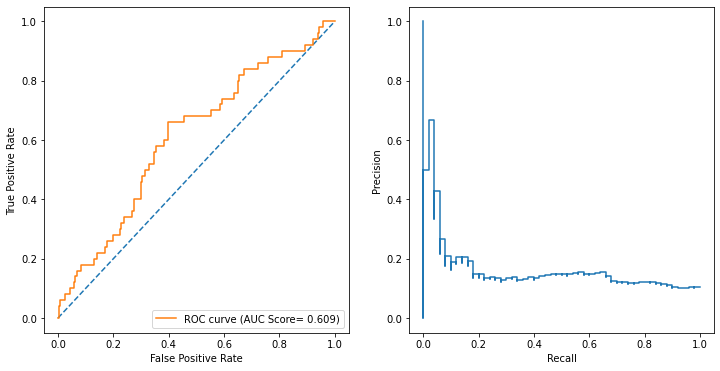

              precision    recall  f1-score   support

           0      0.914     0.709     0.798       450
           1      0.132     0.400     0.199        50

    accuracy                          0.678       500
   macro avg      0.523     0.554     0.499       500
weighted avg      0.836     0.678     0.739       500



[]

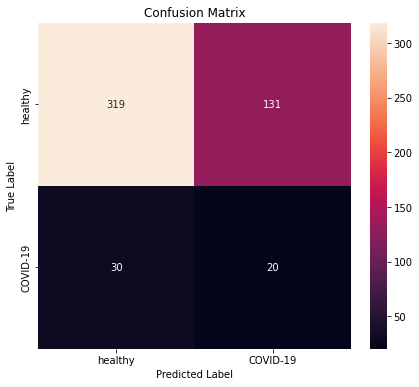

In [38]:
model = grid_search_2.best_estimator_.model

y_test_pred = model.predict_classes(X_test).reshape(-1)
y_test_probs = model.predict_proba(X_test).reshape(-1)

# ROC and ROC AUC score 
auc_score = roc_auc_score(y_test, y_test_probs)

fig, (ax1, ax2) = plt.subplots(1,2,figsize=(12,6))

prec, recall, _ = precision_recall_curve(y_test, y_test_probs)
pr_display = PrecisionRecallDisplay(precision=prec, recall=recall)

fpr, tpr, _ = roc_curve(y_test, y_test_probs)
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr)

ax1.plot([0,1], [0,1], linestyle='--')
roc_display.plot(ax=ax1, label = f"ROC curve (AUC Score= {round(auc_score, 3)})")
pr_display.plot(ax=ax2)
plt.show()

# CLASSIFICATION REPORT
print(classification_report(y_test, y_test_pred, digits=3))

# CONFUSION MATRIX
conf_mat = confusion_matrix(y_test, y_test_pred)

fig, ax = plt.subplots(figsize = (7,6))
sns.heatmap(conf_mat, annot=True, fmt='g')
ax.set_title('Confusion Matrix')
ax.set_ylabel('True Label')
ax.set_xlabel('Predicted Label')
ax.xaxis.set_ticklabels(['healthy', 'COVID-19'])
ax.yaxis.set_ticklabels(['healthy', 'COVID-19'])
plt.plot() 

### Hyper-parameter tuning

(500,)

## MFCC

### Define training and testing data, and model building function

In [29]:
X_train = train_mfccs
X_test = test_mfccs

In [31]:
def build_cnn(
    hidden_activation = 'relu',
    final_activation = 'sigmoid',
    filters = 32,
    n_hidden = 1,
    kernel_size = 3,
    dropout = False,
    dropout_p = 0.2,
    optimiser = 'Adam',
    kernel_initialiser = 'he_normal',
    learning_rate = 0.0001):
    
    model = keras.models.Sequential()

    # first layer:
    if hidden_activation == 'leaky_relu':
        model.add(keras.layers.Conv2D(filters=filters, kernel_size = (kernel_size,kernel_size), input_shape = (20,862,1), kernel_initializer=kernel_initialiser))
        keras.layers.LeakyReLU(alpha=0.2),
    elif hidden_activation == 'selu':
        model.add(keras.layers.Conv2D(filters=filters, kernel_size=(kernel_size, kernel_size), activation='selu', padding = 'same', input_shape=(20,862,1), kernel_initializer='lecun_normal'))
    else:
        model.add(keras.layers.Conv2D(filters=filters, kernel_size = (kernel_size,kernel_size), activation=hidden_activation, input_shape = (20,862,1), kernel_initializer=kernel_initialiser))

    model.add(keras.layers.MaxPool2D(pool_size=(2, 2)))  # add maxpooling layer

    if dropout:
        model.add(keras.layers.Dropout(dropout_p))

    if n_hidden > 1:
        for layer in range(n_hidden - 1):
            if hidden_activation == 'leaky_relu':
                model.add(keras.layers.Conv2D(filters=filters, kernel_size = (kernel_size,kernel_size), padding = 'same', kernel_initializer=kernel_initialiser))
                keras.layers.LeakyReLU(alpha=0.2)
                model.add(keras.layers.MaxPool2D(pool_size=(2, 2)))  # add maxpooling layer
            elif hidden_activation == 'selu':
                model.add(keras.layers.Conv2D(filters=filters, kernel_size = (kernel_size,kernel_size), activation='selu', padding = 'same', kernel_initializer='lecun_normal'))
                model.add(keras.layers.MaxPool2D(pool_size=(2, 2)))  # add maxpooling layer
            else:
                model.add(keras.layers.Conv2D(filters=filters, kernel_size = (kernel_size,kernel_size), activation=hidden_activation, padding = 'same', kernel_initializer=kernel_initialiser))
                model.add(keras.layers.MaxPool2D(pool_size=(2, 2)))  # add maxpooling layer
            
            if dropout:
                model.add(keras.layers.Dropout(dropout_p))


    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(1, activation = final_activation))

    if optimiser == 'SGD':
        opt = keras.optimizers.SGD(learning_rate=learning_rate)
    elif optimiser == 'momentum':
        opt = keras.optimizers.SGD(learning_rate=learning_rate, momentum = 0.9)
    elif optimiser == 'Adam':
        opt = keras.optimizers.Adam(learning_rate = learning_rate)
    elif optimiser == 'Adamax':
        opt = keras.optimizers.Adamax(learning_rate=learning_rate, beta_1=0.9, beta_2=0.999)
    elif optimiser == 'Adagrad':
        opt = keras.optimizers.Adagrad(learning_rate = learning_rate)

    model.compile(loss = 'binary_crossentropy', optimizer = opt, metrics = ["AUC"])
    print(model.summary())
    return model

cnn = keras.wrappers.scikit_learn.KerasClassifier(build_cnn)

### Baseline Model

In [33]:
# 3 hours + to run

param_dist= {
    'n_hidden' : [1, 2, 3, 4],
    'filters' : [16, 24, 32],
    'batch_size' : [16, 32],
    'kernel_size' : [3, 4, 5],
    'kernel_initialiser' : ['he_normal', 'lecun_normal', 'he_uniform'],
    'hidden_activation' : ['relu', 'elu', 'selu', 'sigmoid','hard_sigmoid'],
    'final_activation' : ['sigmoid','hard_sigmoid'],
    'optimiser' : ['momentum', 'Adam', 'Adamax'],
    'learning_rate' : [0.00005]
}


rnd_search_cv = model_selection.RandomizedSearchCV(cnn, param_dist, n_iter = 12, cv=5, scoring = 'roc_auc', random_state = random_state)
rnd_search_cv.fit(X_train, y_train, epochs = 100)

Model: "sequential_41"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_161 (Conv2D)          (None, 17, 859, 16)       272       
_________________________________________________________________
max_pooling2d_161 (MaxPoolin (None, 8, 429, 16)        0         
_________________________________________________________________
conv2d_162 (Conv2D)          (None, 8, 429, 16)        4112      
_________________________________________________________________
max_pooling2d_162 (MaxPoolin (None, 4, 214, 16)        0         
_________________________________________________________________
conv2d_163 (Conv2D)          (None, 4, 214, 16)        4112      
_________________________________________________________________
max_pooling2d_163 (MaxPoolin (None, 2, 107, 16)        0         
_________________________________________________________________
flatten_41 (Flatten)         (None, 3424)            

1600/1600 [==============================] - 1s 371us/sample - loss: 0.6933 - AUC: 0.4833
Epoch 32/100
1600/1600 [==============================] - 1s 371us/sample - loss: 0.6932 - AUC: 0.4911
Epoch 33/100
1600/1600 [==============================] - 1s 372us/sample - loss: 0.6932 - AUC: 0.4880
Epoch 34/100
1600/1600 [==============================] - 1s 371us/sample - loss: 0.6933 - AUC: 0.4859
Epoch 35/100
1600/1600 [==============================] - 1s 374us/sample - loss: 0.6934 - AUC: 0.4800
Epoch 36/100
1600/1600 [==============================] - 1s 369us/sample - loss: 0.6932 - AUC: 0.4929
Epoch 37/100
1600/1600 [==============================] - 1s 370us/sample - loss: 0.6932 - AUC: 0.4821
Epoch 38/100
1600/1600 [==============================] - 1s 373us/sample - loss: 0.6933 - AUC: 0.4830
Epoch 39/100
1600/1600 [==============================] - 1s 370us/sample - loss: 0.6934 - AUC: 0.4709
Epoch 40/100
1600/1600 [==============================] - 1s 374us/sample - loss: 0.69

1600/1600 [==============================] - 1s 881us/sample - loss: 0.6941 - AUC: 0.4930
Epoch 2/100
1600/1600 [==============================] - 1s 374us/sample - loss: 0.6945 - AUC: 0.4835
Epoch 3/100
1600/1600 [==============================] - 1s 374us/sample - loss: 0.6938 - AUC: 0.4823
Epoch 4/100
1600/1600 [==============================] - 1s 378us/sample - loss: 0.6938 - AUC: 0.4801
Epoch 5/100
1600/1600 [==============================] - 1s 379us/sample - loss: 0.6935 - AUC: 0.4958
Epoch 6/100
1600/1600 [==============================] - 1s 375us/sample - loss: 0.6932 - AUC: 0.5103
Epoch 7/100
1600/1600 [==============================] - 1s 375us/sample - loss: 0.6938 - AUC: 0.4924
Epoch 8/100
1600/1600 [==============================] - 1s 375us/sample - loss: 0.6941 - AUC: 0.4889
Epoch 9/100
1600/1600 [==============================] - 1s 376us/sample - loss: 0.6940 - AUC: 0.4652
Epoch 10/100
1600/1600 [==============================] - 1s 377us/sample - loss: 0.6944 - AUC

1600/1600 [==============================] - 1s 379us/sample - loss: 0.6932 - AUC: 0.4915
Epoch 46/100
1600/1600 [==============================] - 1s 379us/sample - loss: 0.6932 - AUC: 0.5000
Epoch 47/100
1600/1600 [==============================] - 1s 375us/sample - loss: 0.6932 - AUC: 0.4886
Epoch 48/100
1600/1600 [==============================] - 1s 381us/sample - loss: 0.6932 - AUC: 0.5000
Epoch 49/100
1600/1600 [==============================] - 1s 382us/sample - loss: 0.6932 - AUC: 0.4928
Epoch 50/100
1600/1600 [==============================] - 1s 376us/sample - loss: 0.6932 - AUC: 0.5000
Epoch 51/100
1600/1600 [==============================] - 1s 377us/sample - loss: 0.6932 - AUC: 0.4781
Epoch 52/100
1600/1600 [==============================] - 1s 377us/sample - loss: 0.6932 - AUC: 0.4854
Epoch 53/100
1600/1600 [==============================] - 1s 378us/sample - loss: 0.6933 - AUC: 0.4818
Epoch 54/100
1600/1600 [==============================] - 1s 380us/sample - loss: 0.69

1600/1600 [==============================] - 1s 370us/sample - loss: 0.6933 - AUC: 0.4928
Epoch 90/100
1600/1600 [==============================] - 1s 369us/sample - loss: 0.6932 - AUC: 0.4930
Epoch 91/100
1600/1600 [==============================] - 1s 370us/sample - loss: 0.6932 - AUC: 0.4825
Epoch 92/100
1600/1600 [==============================] - 1s 371us/sample - loss: 0.6933 - AUC: 0.4920
Epoch 93/100
1600/1600 [==============================] - 1s 371us/sample - loss: 0.6933 - AUC: 0.4925
Epoch 94/100
1600/1600 [==============================] - 1s 376us/sample - loss: 0.6932 - AUC: 0.5021
Epoch 95/100
1600/1600 [==============================] - 1s 369us/sample - loss: 0.6932 - AUC: 0.4745
Epoch 96/100
1600/1600 [==============================] - 1s 369us/sample - loss: 0.6932 - AUC: 0.4855
Epoch 97/100
1600/1600 [==============================] - 1s 370us/sample - loss: 0.6933 - AUC: 0.4881
Epoch 98/100
1600/1600 [==============================] - 1s 368us/sample - loss: 0.69

1600/1600 [==============================] - 1s 360us/sample - loss: 0.7016 - AUC: 0.4819
Epoch 30/100
1600/1600 [==============================] - 1s 361us/sample - loss: 0.7036 - AUC: 0.4799
Epoch 31/100
1600/1600 [==============================] - 1s 361us/sample - loss: 0.7010 - AUC: 0.4929
Epoch 32/100
1600/1600 [==============================] - 1s 359us/sample - loss: 0.7046 - AUC: 0.5110
Epoch 33/100
1600/1600 [==============================] - 1s 359us/sample - loss: 0.7083 - AUC: 0.4741
Epoch 34/100
1600/1600 [==============================] - 1s 361us/sample - loss: 0.7013 - AUC: 0.4851
Epoch 35/100
1600/1600 [==============================] - 1s 361us/sample - loss: 0.7091 - AUC: 0.4985
Epoch 36/100
1600/1600 [==============================] - 1s 359us/sample - loss: 0.7062 - AUC: 0.4875
Epoch 37/100
1600/1600 [==============================] - 1s 360us/sample - loss: 0.7028 - AUC: 0.4921
Epoch 38/100
1600/1600 [==============================] - 1s 361us/sample - loss: 0.70

1600/1600 [==============================] - 1s 935us/sample - loss: 0.7094 - AUC: 0.4961
Epoch 2/100
1600/1600 [==============================] - 1s 356us/sample - loss: 0.7087 - AUC: 0.4757
Epoch 3/100
1600/1600 [==============================] - 1s 356us/sample - loss: 0.7219 - AUC: 0.5066
Epoch 4/100
1600/1600 [==============================] - 1s 357us/sample - loss: 0.6992 - AUC: 0.5167
Epoch 5/100
1600/1600 [==============================] - 1s 357us/sample - loss: 0.7026 - AUC: 0.4948
Epoch 6/100
1600/1600 [==============================] - 1s 356us/sample - loss: 0.7102 - AUC: 0.4917
Epoch 7/100
1600/1600 [==============================] - 1s 356us/sample - loss: 0.7105 - AUC: 0.5051
Epoch 8/100
1600/1600 [==============================] - 1s 357us/sample - loss: 0.7175 - AUC: 0.4875
Epoch 9/100
1600/1600 [==============================] - 1s 355us/sample - loss: 0.6981 - AUC: 0.5106
Epoch 10/100
1600/1600 [==============================] - 1s 358us/sample - loss: 0.6993 - AUC

1600/1600 [==============================] - 1s 357us/sample - loss: 0.7073 - AUC: 0.5357
Epoch 51/100
1600/1600 [==============================] - 1s 359us/sample - loss: 0.7164 - AUC: 0.4709
Epoch 52/100
1600/1600 [==============================] - 1s 357us/sample - loss: 0.7060 - AUC: 0.5082
Epoch 53/100
1600/1600 [==============================] - 1s 357us/sample - loss: 0.7206 - AUC: 0.4696
Epoch 54/100
1600/1600 [==============================] - 1s 358us/sample - loss: 0.7024 - AUC: 0.4853
Epoch 55/100
1600/1600 [==============================] - 1s 358us/sample - loss: 0.6993 - AUC: 0.4764
Epoch 56/100
1600/1600 [==============================] - 1s 358us/sample - loss: 0.6972 - AUC: 0.5112
Epoch 57/100
1600/1600 [==============================] - 1s 358us/sample - loss: 0.6963 - AUC: 0.5113
Epoch 58/100
1600/1600 [==============================] - 1s 359us/sample - loss: 0.7020 - AUC: 0.4749
Epoch 59/100
1600/1600 [==============================] - 1s 356us/sample - loss: 0.69

1600/1600 [==============================] - 1s 357us/sample - loss: 0.7076 - AUC: 0.5056
Epoch 100/100
1600/1600 [==============================] - 1s 357us/sample - loss: 0.7071 - AUC: 0.4977
Model: "sequential_51"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_181 (Conv2D)          (None, 17, 859, 16)       272       
_________________________________________________________________
max_pooling2d_181 (MaxPoolin (None, 8, 429, 16)        0         
_________________________________________________________________
conv2d_182 (Conv2D)          (None, 8, 429, 16)        4112      
_________________________________________________________________
max_pooling2d_182 (MaxPoolin (None, 4, 214, 16)        0         
_________________________________________________________________
conv2d_183 (Conv2D)          (None, 4, 214, 16)        4112      
_________________________________________________________

1600/1600 [==============================] - 1s 463us/sample - loss: 0.6943 - AUC: 0.4758
Epoch 30/100
1600/1600 [==============================] - 1s 458us/sample - loss: 0.6937 - AUC: 0.4760
Epoch 31/100
1600/1600 [==============================] - 1s 457us/sample - loss: 0.6958 - AUC: 0.4864
Epoch 32/100
1600/1600 [==============================] - 1s 455us/sample - loss: 0.6936 - AUC: 0.4923
Epoch 33/100
1600/1600 [==============================] - 1s 456us/sample - loss: 0.6948 - AUC: 0.4836
Epoch 34/100
1600/1600 [==============================] - 1s 457us/sample - loss: 0.6938 - AUC: 0.4846
Epoch 35/100
1600/1600 [==============================] - 1s 457us/sample - loss: 0.6946 - AUC: 0.4721
Epoch 36/100
1600/1600 [==============================] - 1s 457us/sample - loss: 0.6939 - AUC: 0.4936
Epoch 37/100
1600/1600 [==============================] - 1s 458us/sample - loss: 0.6942 - AUC: 0.4724
Epoch 38/100
1600/1600 [==============================] - 1s 459us/sample - loss: 0.69

1600/1600 [==============================] - 2s 1ms/sample - loss: 0.7005 - AUC: 0.4817
Epoch 2/100
1600/1600 [==============================] - 1s 453us/sample - loss: 0.6953 - AUC: 0.4765
Epoch 3/100
1600/1600 [==============================] - 1s 453us/sample - loss: 0.6941 - AUC: 0.5038
Epoch 4/100
1600/1600 [==============================] - 1s 455us/sample - loss: 0.6951 - AUC: 0.4883
Epoch 5/100
1600/1600 [==============================] - 1s 453us/sample - loss: 0.6949 - AUC: 0.4652
Epoch 6/100
1600/1600 [==============================] - 1s 455us/sample - loss: 0.6940 - AUC: 0.4962
Epoch 7/100
1600/1600 [==============================] - 1s 455us/sample - loss: 0.6943 - AUC: 0.4836
Epoch 8/100
1600/1600 [==============================] - 1s 454us/sample - loss: 0.6941 - AUC: 0.5000
Epoch 9/100
1600/1600 [==============================] - 1s 453us/sample - loss: 0.6945 - AUC: 0.4773
Epoch 10/100
1600/1600 [==============================] - 1s 453us/sample - loss: 0.6948 - AUC: 

1600/1600 [==============================] - 1s 467us/sample - loss: 0.6944 - AUC: 0.4812
Epoch 46/100
1600/1600 [==============================] - 1s 464us/sample - loss: 0.6942 - AUC: 0.5026
Epoch 47/100
1600/1600 [==============================] - 1s 461us/sample - loss: 0.6932 - AUC: 0.5114
Epoch 48/100
1600/1600 [==============================] - 1s 454us/sample - loss: 0.6949 - AUC: 0.4918
Epoch 49/100
1600/1600 [==============================] - 1s 454us/sample - loss: 0.6959 - AUC: 0.4705
Epoch 50/100
1600/1600 [==============================] - 1s 454us/sample - loss: 0.6941 - AUC: 0.4733
Epoch 51/100
1600/1600 [==============================] - 1s 454us/sample - loss: 0.6939 - AUC: 0.4955
Epoch 52/100
1600/1600 [==============================] - 1s 455us/sample - loss: 0.6944 - AUC: 0.4853
Epoch 53/100
1600/1600 [==============================] - 1s 454us/sample - loss: 0.6944 - AUC: 0.4769
Epoch 54/100
1600/1600 [==============================] - 1s 456us/sample - loss: 0.69

1600/1600 [==============================] - 1s 455us/sample - loss: 0.6938 - AUC: 0.4818
Epoch 90/100
1600/1600 [==============================] - 1s 454us/sample - loss: 0.6941 - AUC: 0.4847
Epoch 91/100
1600/1600 [==============================] - 1s 454us/sample - loss: 0.6947 - AUC: 0.4942
Epoch 92/100
1600/1600 [==============================] - 1s 455us/sample - loss: 0.6936 - AUC: 0.5009
Epoch 93/100
1600/1600 [==============================] - 1s 456us/sample - loss: 0.6945 - AUC: 0.4945
Epoch 94/100
1600/1600 [==============================] - 1s 456us/sample - loss: 0.6944 - AUC: 0.4850
Epoch 95/100
1600/1600 [==============================] - 1s 455us/sample - loss: 0.6943 - AUC: 0.4836
Epoch 96/100
1600/1600 [==============================] - 1s 456us/sample - loss: 0.6940 - AUC: 0.4977
Epoch 97/100
1600/1600 [==============================] - 1s 455us/sample - loss: 0.6943 - AUC: 0.4685
Epoch 98/100
1600/1600 [==============================] - 1s 456us/sample - loss: 0.69

1600/1600 [==============================] - 1s 366us/sample - loss: 0.7370 - AUC: 0.4951
Epoch 30/100
1600/1600 [==============================] - 1s 368us/sample - loss: 0.7225 - AUC: 0.4894
Epoch 31/100
1600/1600 [==============================] - 1s 366us/sample - loss: 0.7138 - AUC: 0.5296
Epoch 32/100
1600/1600 [==============================] - 1s 363us/sample - loss: 0.7173 - AUC: 0.5159
Epoch 33/100
1600/1600 [==============================] - 1s 366us/sample - loss: 0.7162 - AUC: 0.5048
Epoch 34/100
1600/1600 [==============================] - 1s 367us/sample - loss: 0.7305 - AUC: 0.4993
Epoch 35/100
1600/1600 [==============================] - 1s 372us/sample - loss: 0.7304 - AUC: 0.4913
Epoch 36/100
1600/1600 [==============================] - 1s 369us/sample - loss: 0.7208 - AUC: 0.5008
Epoch 37/100
1600/1600 [==============================] - 1s 364us/sample - loss: 0.7210 - AUC: 0.5024
Epoch 38/100
1600/1600 [==============================] - 1s 366us/sample - loss: 0.72

1600/1600 [==============================] - 1s 789us/sample - loss: 0.7463 - AUC: 0.5021
Epoch 2/100
1600/1600 [==============================] - 1s 362us/sample - loss: 0.7184 - AUC: 0.5009
Epoch 3/100
1600/1600 [==============================] - 1s 364us/sample - loss: 0.7067 - AUC: 0.4902
Epoch 4/100
1600/1600 [==============================] - 1s 365us/sample - loss: 0.7166 - AUC: 0.4959
Epoch 5/100
1600/1600 [==============================] - 1s 364us/sample - loss: 0.7222 - AUC: 0.4814
Epoch 6/100
1600/1600 [==============================] - 1s 365us/sample - loss: 6.4692 - AUC: 0.4850
Epoch 7/100
1600/1600 [==============================] - 1s 364us/sample - loss: 7.7221 - AUC: 0.5000
Epoch 8/100
1600/1600 [==============================] - 1s 364us/sample - loss: 7.7221 - AUC: 0.5000
Epoch 9/100
1600/1600 [==============================] - 1s 369us/sample - loss: 7.7221 - AUC: 0.5000
Epoch 10/100
1600/1600 [==============================] - 1s 364us/sample - loss: 7.7221 - AUC

1600/1600 [==============================] - 1s 370us/sample - loss: 0.7089 - AUC: 0.5056
Epoch 51/100
1600/1600 [==============================] - 1s 367us/sample - loss: 0.7390 - AUC: 0.4720
Epoch 52/100
1600/1600 [==============================] - 1s 363us/sample - loss: 0.7078 - AUC: 0.4965
Epoch 53/100
1600/1600 [==============================] - 1s 369us/sample - loss: 0.7423 - AUC: 0.4970
Epoch 54/100
1600/1600 [==============================] - 1s 364us/sample - loss: 0.7186 - AUC: 0.4939
Epoch 55/100
1600/1600 [==============================] - 1s 365us/sample - loss: 0.7295 - AUC: 0.4894
Epoch 56/100
1600/1600 [==============================] - 1s 365us/sample - loss: 0.7676 - AUC: 0.4683
Epoch 57/100
1600/1600 [==============================] - 1s 365us/sample - loss: 0.7144 - AUC: 0.4899
Epoch 58/100
1600/1600 [==============================] - 1s 368us/sample - loss: 0.7115 - AUC: 0.4997
Epoch 59/100
1600/1600 [==============================] - 1s 365us/sample - loss: 0.70

1600/1600 [==============================] - 1s 365us/sample - loss: 7.6739 - AUC: 0.5000
Epoch 100/100
1600/1600 [==============================] - 1s 365us/sample - loss: 7.6739 - AUC: 0.5000
Model: "sequential_61"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_201 (Conv2D)          (None, 20, 862, 32)       320       
_________________________________________________________________
max_pooling2d_201 (MaxPoolin (None, 10, 431, 32)       0         
_________________________________________________________________
conv2d_202 (Conv2D)          (None, 10, 431, 32)       9248      
_________________________________________________________________
max_pooling2d_202 (MaxPoolin (None, 5, 215, 32)        0         
_________________________________________________________________
conv2d_203 (Conv2D)          (None, 5, 215, 32)        9248      
_________________________________________________________

Epoch 62/100
1600/1600 [==============================] - 1s 805us/sample - loss: 0.6938 - AUC: 0.4795
Epoch 63/100
1600/1600 [==============================] - 1s 809us/sample - loss: 0.6939 - AUC: 0.4635
Epoch 64/100
1600/1600 [==============================] - 1s 814us/sample - loss: 0.6935 - AUC: 0.4840
Epoch 65/100
1600/1600 [==============================] - 1s 811us/sample - loss: 0.6938 - AUC: 0.4677
Epoch 66/100
1600/1600 [==============================] - 1s 811us/sample - loss: 0.6941 - AUC: 0.4793
Epoch 67/100
1600/1600 [==============================] - 1s 809us/sample - loss: 0.6939 - AUC: 0.4893
Epoch 68/100
1600/1600 [==============================] - 1s 808us/sample - loss: 0.6933 - AUC: 0.4926
Epoch 69/100
1600/1600 [==============================] - 1s 808us/sample - loss: 0.6940 - AUC: 0.4817
Epoch 70/100
1600/1600 [==============================] - 1s 808us/sample - loss: 0.6934 - AUC: 0.4860
Epoch 71/100
1600/1600 [==============================] - 1s 806us/sample

1600/1600 [==============================] - 1s 811us/sample - loss: 0.6961 - AUC: 0.4853
Epoch 26/100
1600/1600 [==============================] - 1s 810us/sample - loss: 0.6950 - AUC: 0.4961
Epoch 27/100
1600/1600 [==============================] - 1s 812us/sample - loss: 0.6951 - AUC: 0.4809
Epoch 28/100
1600/1600 [==============================] - 1s 812us/sample - loss: 0.6947 - AUC: 0.4920
Epoch 29/100
1600/1600 [==============================] - 1s 810us/sample - loss: 0.6946 - AUC: 0.4755
Epoch 30/100
1600/1600 [==============================] - 1s 809us/sample - loss: 0.6945 - AUC: 0.4835
Epoch 31/100
1600/1600 [==============================] - 1s 810us/sample - loss: 0.6951 - AUC: 0.4916
Epoch 32/100
1600/1600 [==============================] - 1s 810us/sample - loss: 0.6943 - AUC: 0.4928
Epoch 33/100
1600/1600 [==============================] - 1s 812us/sample - loss: 0.6946 - AUC: 0.4738
Epoch 34/100
1600/1600 [==============================] - 1s 813us/sample - loss: 0.69

1600/1600 [==============================] - 4s 2ms/sample - loss: 0.6944 - AUC: 0.5115
Epoch 2/100
1600/1600 [==============================] - 1s 816us/sample - loss: 0.6982 - AUC: 0.4604
Epoch 3/100
1600/1600 [==============================] - 1s 818us/sample - loss: 0.6960 - AUC: 0.4873
Epoch 4/100
1600/1600 [==============================] - 1s 816us/sample - loss: 0.6951 - AUC: 0.4983
Epoch 5/100
1600/1600 [==============================] - 1s 816us/sample - loss: 0.6950 - AUC: 0.5115
Epoch 6/100
1600/1600 [==============================] - 1s 817us/sample - loss: 0.6963 - AUC: 0.4913
Epoch 7/100
1600/1600 [==============================] - 1s 815us/sample - loss: 0.6956 - AUC: 0.4891
Epoch 8/100
1600/1600 [==============================] - 1s 817us/sample - loss: 0.6937 - AUC: 0.5188
Epoch 9/100
1600/1600 [==============================] - 1s 816us/sample - loss: 0.6935 - AUC: 0.5172
Epoch 10/100
1600/1600 [==============================] - 1s 816us/sample - loss: 0.6955 - AUC: 

1600/1600 [==============================] - 1s 810us/sample - loss: 0.6935 - AUC: 0.5113
Epoch 44/100
1600/1600 [==============================] - 1s 811us/sample - loss: 0.6939 - AUC: 0.4848
Epoch 45/100
1600/1600 [==============================] - 1s 810us/sample - loss: 0.6940 - AUC: 0.4942
Epoch 46/100
1600/1600 [==============================] - 1s 808us/sample - loss: 0.6944 - AUC: 0.4916
Epoch 47/100
1600/1600 [==============================] - 1s 810us/sample - loss: 0.6937 - AUC: 0.4895
Epoch 48/100
1600/1600 [==============================] - 1s 809us/sample - loss: 0.6936 - AUC: 0.4760
Epoch 49/100
1600/1600 [==============================] - 1s 811us/sample - loss: 0.6942 - AUC: 0.4697
Epoch 50/100
1600/1600 [==============================] - 1s 808us/sample - loss: 0.6937 - AUC: 0.5010
Epoch 51/100
1600/1600 [==============================] - 1s 809us/sample - loss: 0.6944 - AUC: 0.4844
Epoch 52/100
1600/1600 [==============================] - 1s 810us/sample - loss: 0.69

1600/1600 [==============================] - 1s 813us/sample - loss: 0.6958 - AUC: 0.4818
Epoch 7/100
1600/1600 [==============================] - 1s 811us/sample - loss: 0.6944 - AUC: 0.4699
Epoch 8/100
1600/1600 [==============================] - 1s 812us/sample - loss: 0.6942 - AUC: 0.4776
Epoch 9/100
1600/1600 [==============================] - 1s 812us/sample - loss: 0.6947 - AUC: 0.4876
Epoch 10/100
1600/1600 [==============================] - 1s 813us/sample - loss: 0.6947 - AUC: 0.4713
Epoch 11/100
1600/1600 [==============================] - 1s 810us/sample - loss: 0.6946 - AUC: 0.4631
Epoch 12/100
1600/1600 [==============================] - 1s 811us/sample - loss: 0.6945 - AUC: 0.4905
Epoch 13/100
1600/1600 [==============================] - 1s 812us/sample - loss: 0.6946 - AUC: 0.4782
Epoch 14/100
1600/1600 [==============================] - 1s 811us/sample - loss: 0.6947 - AUC: 0.4825
Epoch 15/100
1600/1600 [==============================] - 1s 811us/sample - loss: 0.6955 

1600/1600 [==============================] - 1s 470us/sample - loss: 0.7648 - AUC: 0.4839
Epoch 56/100
1600/1600 [==============================] - 1s 469us/sample - loss: 0.7827 - AUC: 0.4908
Epoch 57/100
1600/1600 [==============================] - 1s 471us/sample - loss: 0.7688 - AUC: 0.5039
Epoch 58/100
1600/1600 [==============================] - 1s 468us/sample - loss: 0.7323 - AUC: 0.4843
Epoch 59/100
1600/1600 [==============================] - 1s 469us/sample - loss: 0.7306 - AUC: 0.4800
Epoch 60/100
1600/1600 [==============================] - 1s 468us/sample - loss: 0.7533 - AUC: 0.5072
Epoch 61/100
1600/1600 [==============================] - 1s 469us/sample - loss: 0.7293 - AUC: 0.5113
Epoch 62/100
1600/1600 [==============================] - 1s 469us/sample - loss: 0.7233 - AUC: 0.5066
Epoch 63/100
1600/1600 [==============================] - 1s 468us/sample - loss: 0.8119 - AUC: 0.4866
Epoch 64/100
1600/1600 [==============================] - 1s 469us/sample - loss: 0.77

1600/1600 [==============================] - 2s 983us/sample - loss: 0.7368 - AUC: 0.5164
Epoch 2/100
1600/1600 [==============================] - 1s 464us/sample - loss: 0.7284 - AUC: 0.4936
Epoch 3/100
1600/1600 [==============================] - 1s 466us/sample - loss: 0.7322 - AUC: 0.5225
Epoch 4/100
1600/1600 [==============================] - 1s 464us/sample - loss: 0.7845 - AUC: 0.4787
Epoch 5/100
1600/1600 [==============================] - 1s 464us/sample - loss: 0.7535 - AUC: 0.5145
Epoch 6/100
1600/1600 [==============================] - 1s 466us/sample - loss: 0.7516 - AUC: 0.4983
Epoch 7/100
1600/1600 [==============================] - 1s 464us/sample - loss: 0.7481 - AUC: 0.4950
Epoch 8/100
1600/1600 [==============================] - 1s 466us/sample - loss: 0.7160 - AUC: 0.5167
Epoch 9/100
1600/1600 [==============================] - 1s 466us/sample - loss: 0.7421 - AUC: 0.5206
Epoch 10/100
1600/1600 [==============================] - 1s 464us/sample - loss: 0.7331 - AUC

1600/1600 [==============================] - 1s 470us/sample - loss: 0.7930 - AUC: 0.4925
Epoch 51/100
1600/1600 [==============================] - 1s 469us/sample - loss: 0.7458 - AUC: 0.4990
Epoch 52/100
1600/1600 [==============================] - 1s 465us/sample - loss: 0.7366 - AUC: 0.5124
Epoch 53/100
1600/1600 [==============================] - 1s 468us/sample - loss: 0.7391 - AUC: 0.5021
Epoch 54/100
1600/1600 [==============================] - 1s 469us/sample - loss: 0.7433 - AUC: 0.5045
Epoch 55/100
1600/1600 [==============================] - 1s 470us/sample - loss: 0.7456 - AUC: 0.4997
Epoch 56/100
1600/1600 [==============================] - 1s 469us/sample - loss: 0.7903 - AUC: 0.4976
Epoch 57/100
1600/1600 [==============================] - 1s 468us/sample - loss: 0.7405 - AUC: 0.4952
Epoch 58/100
1600/1600 [==============================] - 1s 469us/sample - loss: 0.7361 - AUC: 0.5038
Epoch 59/100
1600/1600 [==============================] - 1s 466us/sample - loss: 0.78

1600/1600 [==============================] - 1s 471us/sample - loss: 0.7918 - AUC: 0.4733
Epoch 100/100
1600/1600 [==============================] - 1s 469us/sample - loss: 0.7196 - AUC: 0.4726
Model: "sequential_71"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_226 (Conv2D)          (None, 20, 862, 32)       544       
_________________________________________________________________
max_pooling2d_226 (MaxPoolin (None, 10, 431, 32)       0         
_________________________________________________________________
conv2d_227 (Conv2D)          (None, 10, 431, 32)       16416     
_________________________________________________________________
max_pooling2d_227 (MaxPoolin (None, 5, 215, 32)        0         
_________________________________________________________________
conv2d_228 (Conv2D)          (None, 5, 215, 32)        16416     
_________________________________________________________

1600/1600 [==============================] - 1s 788us/sample - loss: 0.6952 - AUC: 0.4972
Epoch 30/100
1600/1600 [==============================] - 1s 785us/sample - loss: 0.6942 - AUC: 0.4883
Epoch 31/100
1600/1600 [==============================] - 1s 786us/sample - loss: 0.6937 - AUC: 0.5055
Epoch 32/100
1600/1600 [==============================] - 1s 788us/sample - loss: 0.6942 - AUC: 0.4768
Epoch 33/100
1600/1600 [==============================] - 1s 791us/sample - loss: 0.6939 - AUC: 0.4901
Epoch 34/100
1600/1600 [==============================] - 1s 786us/sample - loss: 0.6949 - AUC: 0.5071
Epoch 35/100
1600/1600 [==============================] - 1s 789us/sample - loss: 0.6939 - AUC: 0.4761
Epoch 36/100
1600/1600 [==============================] - 1s 790us/sample - loss: 0.6940 - AUC: 0.4928
Epoch 37/100
1600/1600 [==============================] - 1s 787us/sample - loss: 0.6941 - AUC: 0.5075
Epoch 38/100
1600/1600 [==============================] - 1s 786us/sample - loss: 0.69

1600/1600 [==============================] - 3s 2ms/sample - loss: 0.6979 - AUC: 0.4970
Epoch 2/100
1600/1600 [==============================] - 1s 786us/sample - loss: 0.6963 - AUC: 0.5059
Epoch 3/100
1600/1600 [==============================] - 1s 786us/sample - loss: 0.6961 - AUC: 0.4847
Epoch 4/100
1600/1600 [==============================] - 1s 788us/sample - loss: 0.6954 - AUC: 0.5148
Epoch 5/100
1600/1600 [==============================] - 1s 785us/sample - loss: 0.6963 - AUC: 0.4849
Epoch 6/100
1600/1600 [==============================] - 1s 788us/sample - loss: 0.6971 - AUC: 0.4974
Epoch 7/100
1600/1600 [==============================] - 1s 786us/sample - loss: 0.7000 - AUC: 0.4794
Epoch 8/100
1600/1600 [==============================] - 1s 788us/sample - loss: 0.6972 - AUC: 0.4924
Epoch 9/100
1600/1600 [==============================] - 1s 789us/sample - loss: 0.6961 - AUC: 0.5007
Epoch 10/100
1600/1600 [==============================] - 1s 788us/sample - loss: 0.6965 - AUC: 

1600/1600 [==============================] - 1s 786us/sample - loss: 0.6939 - AUC: 0.5051
Epoch 46/100
1600/1600 [==============================] - 1s 786us/sample - loss: 0.6942 - AUC: 0.4909
Epoch 47/100
1600/1600 [==============================] - 1s 787us/sample - loss: 0.6941 - AUC: 0.4866
Epoch 48/100
1600/1600 [==============================] - 1s 786us/sample - loss: 0.6939 - AUC: 0.4865
Epoch 49/100
1600/1600 [==============================] - 1s 785us/sample - loss: 0.6945 - AUC: 0.4955
Epoch 50/100
1600/1600 [==============================] - 1s 787us/sample - loss: 0.6947 - AUC: 0.4880
Epoch 51/100
1600/1600 [==============================] - 1s 785us/sample - loss: 0.6950 - AUC: 0.4801
Epoch 52/100
1600/1600 [==============================] - 1s 789us/sample - loss: 0.6937 - AUC: 0.4985
Epoch 53/100
1600/1600 [==============================] - 1s 785us/sample - loss: 0.6941 - AUC: 0.4809
Epoch 54/100
1600/1600 [==============================] - 1s 787us/sample - loss: 0.69

1600/1600 [==============================] - 1s 778us/sample - loss: 0.6948 - AUC: 0.4817
Epoch 90/100
1600/1600 [==============================] - 1s 785us/sample - loss: 0.6949 - AUC: 0.4840
Epoch 91/100
1600/1600 [==============================] - 1s 779us/sample - loss: 0.6936 - AUC: 0.5031
Epoch 92/100
1600/1600 [==============================] - 1s 781us/sample - loss: 0.6934 - AUC: 0.5008
Epoch 93/100
1600/1600 [==============================] - 1s 781us/sample - loss: 0.6946 - AUC: 0.4960
Epoch 94/100
1600/1600 [==============================] - 1s 783us/sample - loss: 0.6959 - AUC: 0.4767
Epoch 95/100
1600/1600 [==============================] - 1s 785us/sample - loss: 0.6944 - AUC: 0.4898
Epoch 96/100
1600/1600 [==============================] - 1s 787us/sample - loss: 0.6934 - AUC: 0.5178
Epoch 97/100
1600/1600 [==============================] - 1s 778us/sample - loss: 0.6948 - AUC: 0.4751
Epoch 98/100
1600/1600 [==============================] - 1s 781us/sample - loss: 0.69

1600/1600 [==============================] - 1s 499us/sample - loss: 0.7001 - AUC: 0.4966
Epoch 26/100
1600/1600 [==============================] - 1s 498us/sample - loss: 0.7012 - AUC: 0.4870
Epoch 27/100
1600/1600 [==============================] - 1s 499us/sample - loss: 0.6974 - AUC: 0.4824
Epoch 28/100
1600/1600 [==============================] - 1s 499us/sample - loss: 0.6966 - AUC: 0.4914
Epoch 29/100
1600/1600 [==============================] - 1s 498us/sample - loss: 0.6959 - AUC: 0.4782
Epoch 30/100
1600/1600 [==============================] - 1s 499us/sample - loss: 0.6950 - AUC: 0.5034
Epoch 31/100
1600/1600 [==============================] - 1s 498us/sample - loss: 0.6974 - AUC: 0.5155
Epoch 32/100
1600/1600 [==============================] - 1s 497us/sample - loss: 0.7015 - AUC: 0.5004
Epoch 33/100
1600/1600 [==============================] - 1s 498us/sample - loss: 0.6942 - AUC: 0.4993
Epoch 34/100
1600/1600 [==============================] - 1s 499us/sample - loss: 0.69

1600/1600 [==============================] - 1s 935us/sample - loss: 0.7199 - AUC: 0.4848
Epoch 2/100
1600/1600 [==============================] - 1s 500us/sample - loss: 0.6980 - AUC: 0.4960
Epoch 3/100
1600/1600 [==============================] - 1s 500us/sample - loss: 0.6984 - AUC: 0.5128
Epoch 4/100
1600/1600 [==============================] - 1s 502us/sample - loss: 0.6989 - AUC: 0.4808
Epoch 5/100
1600/1600 [==============================] - 1s 502us/sample - loss: 0.6998 - AUC: 0.4954
Epoch 6/100
1600/1600 [==============================] - 1s 502us/sample - loss: 0.6983 - AUC: 0.4968
Epoch 7/100
1600/1600 [==============================] - 1s 502us/sample - loss: 0.7057 - AUC: 0.4561
Epoch 8/100
1600/1600 [==============================] - 1s 500us/sample - loss: 0.6991 - AUC: 0.5008
Epoch 9/100
1600/1600 [==============================] - 1s 503us/sample - loss: 0.6973 - AUC: 0.5030
Epoch 10/100
1600/1600 [==============================] - 1s 502us/sample - loss: 0.6986 - AUC

1600/1600 [==============================] - 1s 499us/sample - loss: 0.6959 - AUC: 0.4932
Epoch 49/100
1600/1600 [==============================] - 1s 499us/sample - loss: 0.6979 - AUC: 0.4783
Epoch 50/100
1600/1600 [==============================] - 1s 501us/sample - loss: 0.6955 - AUC: 0.4880
Epoch 51/100
1600/1600 [==============================] - 1s 508us/sample - loss: 0.6950 - AUC: 0.4952
Epoch 52/100
1600/1600 [==============================] - 1s 499us/sample - loss: 0.6955 - AUC: 0.4819
Epoch 53/100
1600/1600 [==============================] - 1s 501us/sample - loss: 0.6988 - AUC: 0.4686
Epoch 54/100
1600/1600 [==============================] - 1s 499us/sample - loss: 0.6960 - AUC: 0.4979
Epoch 55/100
1600/1600 [==============================] - 1s 497us/sample - loss: 0.6965 - AUC: 0.4759
Epoch 56/100
1600/1600 [==============================] - 1s 501us/sample - loss: 0.6949 - AUC: 0.4922
Epoch 57/100
1600/1600 [==============================] - 1s 501us/sample - loss: 0.69

1600/1600 [==============================] - 1s 498us/sample - loss: 0.6940 - AUC: 0.4955
Epoch 96/100
1600/1600 [==============================] - 1s 498us/sample - loss: 0.6948 - AUC: 0.4903
Epoch 97/100
1600/1600 [==============================] - 1s 498us/sample - loss: 0.6935 - AUC: 0.4978
Epoch 98/100
1600/1600 [==============================] - 1s 500us/sample - loss: 0.6950 - AUC: 0.4927
Epoch 99/100
1600/1600 [==============================] - 1s 500us/sample - loss: 0.6947 - AUC: 0.5079
Epoch 100/100
1600/1600 [==============================] - 1s 498us/sample - loss: 0.6949 - AUC: 0.4897
Model: "sequential_81"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_251 (Conv2D)          (None, 20, 862, 16)       160       
_________________________________________________________________
max_pooling2d_251 (MaxPoolin (None, 10, 431, 16)       0         
_________________________________________

1600/1600 [==============================] - 1s 412us/sample - loss: 0.6950 - AUC: 0.4796
Epoch 32/100
1600/1600 [==============================] - 1s 411us/sample - loss: 0.6936 - AUC: 0.5187
Epoch 33/100
1600/1600 [==============================] - 1s 414us/sample - loss: 0.6955 - AUC: 0.4937
Epoch 34/100
1600/1600 [==============================] - 1s 413us/sample - loss: 0.6931 - AUC: 0.5096
Epoch 35/100
1600/1600 [==============================] - 1s 415us/sample - loss: 0.6968 - AUC: 0.4928
Epoch 36/100
1600/1600 [==============================] - 1s 416us/sample - loss: 0.6951 - AUC: 0.4892
Epoch 37/100
1600/1600 [==============================] - 1s 409us/sample - loss: 0.6966 - AUC: 0.4773
Epoch 38/100
1600/1600 [==============================] - 1s 411us/sample - loss: 0.6938 - AUC: 0.5011
Epoch 39/100
1600/1600 [==============================] - 1s 416us/sample - loss: 0.6947 - AUC: 0.4921
Epoch 40/100
1600/1600 [==============================] - 1s 412us/sample - loss: 0.69

1600/1600 [==============================] - 3s 2ms/sample - loss: 0.6995 - AUC: 0.4979
Epoch 2/100
1600/1600 [==============================] - 1s 414us/sample - loss: 0.7052 - AUC: 0.4987
Epoch 3/100
1600/1600 [==============================] - 1s 411us/sample - loss: 0.7047 - AUC: 0.5081
Epoch 4/100
1600/1600 [==============================] - 1s 412us/sample - loss: 0.6973 - AUC: 0.5085
Epoch 5/100
1600/1600 [==============================] - 1s 411us/sample - loss: 0.6957 - AUC: 0.5120
Epoch 6/100
1600/1600 [==============================] - 1s 410us/sample - loss: 0.6986 - AUC: 0.4736
Epoch 7/100
1600/1600 [==============================] - 1s 409us/sample - loss: 0.6977 - AUC: 0.4837
Epoch 8/100
1600/1600 [==============================] - 1s 412us/sample - loss: 0.6963 - AUC: 0.4948
Epoch 9/100
1600/1600 [==============================] - 1s 409us/sample - loss: 0.6952 - AUC: 0.5073
Epoch 10/100
1600/1600 [==============================] - 1s 409us/sample - loss: 0.6992 - AUC: 

1600/1600 [==============================] - 1s 414us/sample - loss: 0.6943 - AUC: 0.5103
Epoch 49/100
1600/1600 [==============================] - 1s 416us/sample - loss: 0.6936 - AUC: 0.4906
Epoch 50/100
1600/1600 [==============================] - 1s 415us/sample - loss: 0.6951 - AUC: 0.4819
Epoch 51/100
1600/1600 [==============================] - 1s 415us/sample - loss: 0.6951 - AUC: 0.4806
Epoch 52/100
1600/1600 [==============================] - 1s 414us/sample - loss: 0.6946 - AUC: 0.4891
Epoch 53/100
1600/1600 [==============================] - 1s 417us/sample - loss: 0.6961 - AUC: 0.4691
Epoch 54/100
1600/1600 [==============================] - 1s 415us/sample - loss: 0.6937 - AUC: 0.5001
Epoch 55/100
1600/1600 [==============================] - 1s 416us/sample - loss: 0.6943 - AUC: 0.4992
Epoch 56/100
1600/1600 [==============================] - 1s 414us/sample - loss: 0.6943 - AUC: 0.4994
Epoch 57/100
1600/1600 [==============================] - 1s 415us/sample - loss: 0.69

1600/1600 [==============================] - 1s 411us/sample - loss: 0.6940 - AUC: 0.4859
Epoch 96/100
1600/1600 [==============================] - 1s 410us/sample - loss: 0.6943 - AUC: 0.4808
Epoch 97/100
1600/1600 [==============================] - 1s 410us/sample - loss: 0.6941 - AUC: 0.4807
Epoch 98/100
1600/1600 [==============================] - 1s 411us/sample - loss: 0.6938 - AUC: 0.4993
Epoch 99/100
1600/1600 [==============================] - 1s 411us/sample - loss: 0.6950 - AUC: 0.4685
Epoch 100/100
1600/1600 [==============================] - 1s 411us/sample - loss: 0.6937 - AUC: 0.4873
Model: "sequential_86"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_261 (Conv2D)          (None, 17, 859, 16)       272       
_________________________________________________________________
max_pooling2d_261 (MaxPoolin (None, 8, 429, 16)        0         
_________________________________________

1600/1600 [==============================] - 1s 388us/sample - loss: 0.6935 - AUC: 0.4785
Epoch 22/100
1600/1600 [==============================] - 1s 390us/sample - loss: 0.6936 - AUC: 0.4817
Epoch 23/100
1600/1600 [==============================] - 1s 386us/sample - loss: 0.6934 - AUC: 0.4859
Epoch 24/100
1600/1600 [==============================] - 1s 389us/sample - loss: 0.6934 - AUC: 0.4877
Epoch 25/100
1600/1600 [==============================] - 1s 389us/sample - loss: 0.6933 - AUC: 0.5022
Epoch 26/100
1600/1600 [==============================] - 1s 385us/sample - loss: 0.6935 - AUC: 0.4735
Epoch 27/100
1600/1600 [==============================] - 1s 388us/sample - loss: 0.6934 - AUC: 0.4777
Epoch 28/100
1600/1600 [==============================] - 1s 390us/sample - loss: 0.6935 - AUC: 0.4844
Epoch 29/100
1600/1600 [==============================] - 1s 389us/sample - loss: 0.6936 - AUC: 0.4787
Epoch 30/100
1600/1600 [==============================] - 1s 386us/sample - loss: 0.69

1600/1600 [==============================] - 1s 392us/sample - loss: 0.6938 - AUC: 0.4838
Epoch 64/100
1600/1600 [==============================] - 1s 388us/sample - loss: 0.6936 - AUC: 0.4790
Epoch 65/100
1600/1600 [==============================] - 1s 390us/sample - loss: 0.6936 - AUC: 0.4750
Epoch 66/100
1600/1600 [==============================] - 1s 388us/sample - loss: 0.6938 - AUC: 0.4820
Epoch 67/100
1600/1600 [==============================] - 1s 390us/sample - loss: 0.6939 - AUC: 0.4749
Epoch 68/100
1600/1600 [==============================] - 1s 388us/sample - loss: 0.6935 - AUC: 0.4853
Epoch 69/100
1600/1600 [==============================] - 1s 393us/sample - loss: 0.6936 - AUC: 0.4581
Epoch 70/100
1600/1600 [==============================] - 1s 388us/sample - loss: 0.6936 - AUC: 0.4712
Epoch 71/100
1600/1600 [==============================] - 1s 389us/sample - loss: 0.6935 - AUC: 0.4918
Epoch 72/100
1600/1600 [==============================] - 1s 387us/sample - loss: 0.69

1600/1600 [==============================] - 1s 928us/sample - loss: 0.6950 - AUC: 0.4869
Epoch 2/100
1600/1600 [==============================] - 1s 389us/sample - loss: 0.6937 - AUC: 0.4782
Epoch 3/100
1600/1600 [==============================] - 1s 391us/sample - loss: 0.6936 - AUC: 0.4909
Epoch 4/100
1600/1600 [==============================] - 1s 391us/sample - loss: 0.6937 - AUC: 0.4740
Epoch 5/100
1600/1600 [==============================] - 1s 393us/sample - loss: 0.6935 - AUC: 0.4797
Epoch 6/100
1600/1600 [==============================] - 1s 391us/sample - loss: 0.6935 - AUC: 0.4980
Epoch 7/100
1600/1600 [==============================] - 1s 388us/sample - loss: 0.6938 - AUC: 0.4695
Epoch 8/100
1600/1600 [==============================] - 1s 391us/sample - loss: 0.6933 - AUC: 0.4837
Epoch 9/100
1600/1600 [==============================] - 1s 388us/sample - loss: 0.6934 - AUC: 0.4795
Epoch 10/100
1600/1600 [==============================] - 1s 388us/sample - loss: 0.6934 - AUC

1600/1600 [==============================] - 1s 345us/sample - loss: 0.6952 - AUC: 0.4733
Epoch 49/100
1600/1600 [==============================] - 1s 350us/sample - loss: 0.6950 - AUC: 0.4852
Epoch 50/100
1600/1600 [==============================] - 1s 348us/sample - loss: 0.6944 - AUC: 0.4751
Epoch 51/100
1600/1600 [==============================] - 1s 347us/sample - loss: 0.6936 - AUC: 0.5105
Epoch 52/100
1600/1600 [==============================] - 1s 346us/sample - loss: 0.6958 - AUC: 0.4686
Epoch 53/100
1600/1600 [==============================] - 1s 349us/sample - loss: 0.6941 - AUC: 0.4848
Epoch 54/100
1600/1600 [==============================] - 1s 349us/sample - loss: 0.6950 - AUC: 0.4941
Epoch 55/100
1600/1600 [==============================] - 1s 348us/sample - loss: 0.6941 - AUC: 0.4550
Epoch 56/100
1600/1600 [==============================] - 1s 350us/sample - loss: 0.6931 - AUC: 0.5171
Epoch 57/100
1600/1600 [==============================] - 1s 347us/sample - loss: 0.69

1600/1600 [==============================] - 1s 345us/sample - loss: 0.6977 - AUC: 0.4887
Epoch 17/100
1600/1600 [==============================] - 1s 352us/sample - loss: 0.6979 - AUC: 0.5080
Epoch 18/100
1600/1600 [==============================] - 1s 346us/sample - loss: 0.7058 - AUC: 0.4689
Epoch 19/100
1600/1600 [==============================] - 1s 350us/sample - loss: 0.6969 - AUC: 0.5060
Epoch 20/100
1600/1600 [==============================] - 1s 352us/sample - loss: 0.7021 - AUC: 0.4913
Epoch 21/100
1600/1600 [==============================] - 1s 354us/sample - loss: 0.6964 - AUC: 0.4841
Epoch 22/100
1600/1600 [==============================] - 1s 346us/sample - loss: 0.7006 - AUC: 0.4803
Epoch 23/100
1600/1600 [==============================] - 1s 350us/sample - loss: 0.7000 - AUC: 0.5105
Epoch 24/100
1600/1600 [==============================] - 1s 347us/sample - loss: 0.6970 - AUC: 0.4929
Epoch 25/100
1600/1600 [==============================] - 1s 350us/sample - loss: 0.69

1600/1600 [==============================] - 1s 346us/sample - loss: 0.6954 - AUC: 0.4672
Epoch 64/100
1600/1600 [==============================] - 1s 344us/sample - loss: 0.6941 - AUC: 0.4950
Epoch 65/100
1600/1600 [==============================] - 1s 347us/sample - loss: 0.6939 - AUC: 0.4862
Epoch 66/100
1600/1600 [==============================] - 1s 347us/sample - loss: 0.6941 - AUC: 0.4987
Epoch 67/100
1600/1600 [==============================] - 1s 347us/sample - loss: 0.6954 - AUC: 0.4883
Epoch 68/100
1600/1600 [==============================] - 1s 343us/sample - loss: 0.6945 - AUC: 0.4785
Epoch 69/100
1600/1600 [==============================] - 1s 344us/sample - loss: 0.6937 - AUC: 0.5040
Epoch 70/100
1600/1600 [==============================] - 1s 346us/sample - loss: 0.6945 - AUC: 0.4824
Epoch 71/100
1600/1600 [==============================] - 1s 347us/sample - loss: 0.6957 - AUC: 0.4703
Epoch 72/100
1600/1600 [==============================] - 1s 345us/sample - loss: 0.69

1600/1600 [==============================] - 1s 739us/sample - loss: 0.7028 - AUC: 0.4885
Epoch 2/100
1600/1600 [==============================] - 1s 343us/sample - loss: 0.6958 - AUC: 0.4947
Epoch 3/100
1600/1600 [==============================] - 1s 345us/sample - loss: 0.6981 - AUC: 0.4745
Epoch 4/100
1600/1600 [==============================] - 1s 346us/sample - loss: 0.6949 - AUC: 0.4850
Epoch 5/100
1600/1600 [==============================] - 1s 343us/sample - loss: 0.6952 - AUC: 0.4892
Epoch 6/100
1600/1600 [==============================] - 1s 345us/sample - loss: 0.7011 - AUC: 0.4719
Epoch 7/100
1600/1600 [==============================] - 1s 343us/sample - loss: 0.6961 - AUC: 0.4751
Epoch 8/100
1600/1600 [==============================] - 1s 346us/sample - loss: 0.6944 - AUC: 0.5066
Epoch 9/100
1600/1600 [==============================] - 1s 346us/sample - loss: 0.6946 - AUC: 0.5026
Epoch 10/100
1600/1600 [==============================] - 1s 348us/sample - loss: 0.6947 - AUC

1600/1600 [==============================] - 0s 296us/sample - loss: 0.7000 - AUC: 0.5248
Epoch 51/100
1600/1600 [==============================] - 0s 294us/sample - loss: 0.6979 - AUC: 0.4883
Epoch 52/100
1600/1600 [==============================] - 0s 294us/sample - loss: 0.7013 - AUC: 0.4883
Epoch 53/100
1600/1600 [==============================] - 0s 295us/sample - loss: 0.7034 - AUC: 0.5001
Epoch 54/100
1600/1600 [==============================] - 0s 295us/sample - loss: 0.7104 - AUC: 0.5190
Epoch 55/100
1600/1600 [==============================] - 0s 296us/sample - loss: 0.7018 - AUC: 0.4876
Epoch 56/100
1600/1600 [==============================] - 0s 294us/sample - loss: 0.7019 - AUC: 0.5166
Epoch 57/100
1600/1600 [==============================] - 0s 296us/sample - loss: 0.7179 - AUC: 0.5013
Epoch 58/100
1600/1600 [==============================] - 0s 296us/sample - loss: 0.6988 - AUC: 0.4783
Epoch 59/100
1600/1600 [==============================] - 0s 294us/sample - loss: 0.71

1600/1600 [==============================] - 0s 298us/sample - loss: 0.6961 - AUC: 0.5052
Epoch 100/100
1600/1600 [==============================] - 0s 298us/sample - loss: 0.6978 - AUC: 0.4925
Model: "sequential_98"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_293 (Conv2D)          (None, 18, 860, 16)       160       
_________________________________________________________________
max_pooling2d_293 (MaxPoolin (None, 9, 430, 16)        0         
_________________________________________________________________
flatten_98 (Flatten)         (None, 61920)             0         
_________________________________________________________________
dense_98 (Dense)             (None, 1)                 61921     
Total params: 62,081
Trainable params: 62,081
Non-trainable params: 0
_________________________________________________________________
None
Train on 1600 samples
Epoch 1/100
1600/1600 [===

1600/1600 [==============================] - 0s 296us/sample - loss: 0.6967 - AUC: 0.4896
Epoch 40/100
1600/1600 [==============================] - 0s 295us/sample - loss: 0.6995 - AUC: 0.4999
Epoch 41/100
1600/1600 [==============================] - 0s 295us/sample - loss: 0.7039 - AUC: 0.5016
Epoch 42/100
1600/1600 [==============================] - 0s 295us/sample - loss: 0.7008 - AUC: 0.5003
Epoch 43/100
1600/1600 [==============================] - 0s 295us/sample - loss: 0.6983 - AUC: 0.4776
Epoch 44/100
1600/1600 [==============================] - 0s 294us/sample - loss: 0.6977 - AUC: 0.5111
Epoch 45/100
1600/1600 [==============================] - 0s 296us/sample - loss: 0.7101 - AUC: 0.4891
Epoch 46/100
1600/1600 [==============================] - 0s 296us/sample - loss: 0.7076 - AUC: 0.5079
Epoch 47/100
1600/1600 [==============================] - 0s 296us/sample - loss: 0.7016 - AUC: 0.5018
Epoch 48/100
1600/1600 [==============================] - 0s 295us/sample - loss: 0.70

1600/1600 [==============================] - 0s 295us/sample - loss: 0.7084 - AUC: 0.4873
Epoch 89/100
1600/1600 [==============================] - 0s 293us/sample - loss: 0.7028 - AUC: 0.4961
Epoch 90/100
1600/1600 [==============================] - 0s 296us/sample - loss: 0.7110 - AUC: 0.5012
Epoch 91/100
1600/1600 [==============================] - 0s 294us/sample - loss: 0.7058 - AUC: 0.5259
Epoch 92/100
1600/1600 [==============================] - 0s 296us/sample - loss: 0.7039 - AUC: 0.4869
Epoch 93/100
1600/1600 [==============================] - 0s 296us/sample - loss: 0.7059 - AUC: 0.4874
Epoch 94/100
1600/1600 [==============================] - 0s 292us/sample - loss: 0.7058 - AUC: 0.5004
Epoch 95/100
1600/1600 [==============================] - 0s 294us/sample - loss: 0.7061 - AUC: 0.4991
Epoch 96/100
1600/1600 [==============================] - 0s 293us/sample - loss: 0.7029 - AUC: 0.5237
Epoch 97/100
1600/1600 [==============================] - 0s 295us/sample - loss: 0.69

RandomizedSearchCV(cv=5,
                   estimator=<tensorflow.python.keras.wrappers.scikit_learn.KerasClassifier object at 0x0000012C380CBAC8>,
                   n_iter=12,
                   param_distributions={'batch_size': [16, 32],
                                        'filters': [16, 24, 32],
                                        'final_activation': ['sigmoid',
                                                             'hard_sigmoid'],
                                        'hidden_activation': ['relu', 'elu',
                                                              'selu', 'sigmoid',
                                                              'hard_sigmoid'],
                                        'kernel_initialiser': ['he_normal',
                                                               'lecun_normal',
                                                               'he_uniform'],
                                        'kernel_size': [3, 4, 5],
       

In [34]:
rnd_search_cv.best_params_

{'optimiser': 'Adam',
 'n_hidden': 3,
 'learning_rate': 5e-05,
 'kernel_size': 4,
 'kernel_initialiser': 'lecun_normal',
 'hidden_activation': 'relu',
 'final_activation': 'hard_sigmoid',
 'filters': 16,
 'batch_size': 16}

#### Evaluate performance

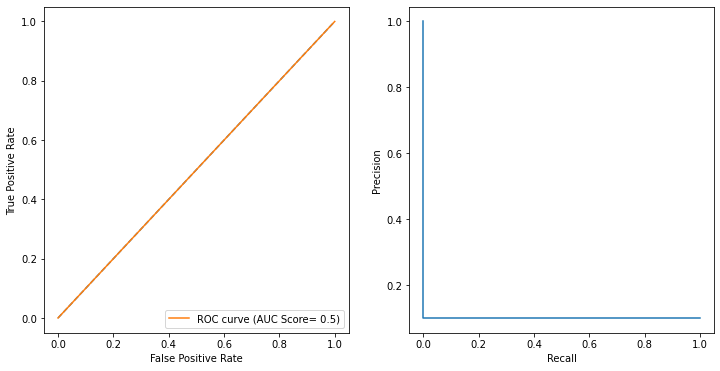

              precision    recall  f1-score   support

           0      0.900     1.000     0.947       450
           1      0.000     0.000     0.000        50

    accuracy                          0.900       500
   macro avg      0.450     0.500     0.474       500
weighted avg      0.810     0.900     0.853       500



C:\Users\danie\anaconda3\envs\ai_coursework_test\lib\site-packages\sklearn\metrics\_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\anaconda3\envs\ai_coursework_test\lib\site-packages\sklearn\metrics\_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\danie\anaconda3\envs\ai_coursework_test\lib\site-packages\sklearn\metrics\_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

[]

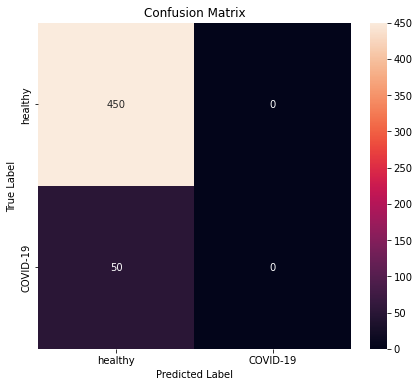

In [35]:
cv_model_1 = rnd_search_cv.best_estimator_.model
y_test_pred = cv_model_1.predict_classes(X_test).reshape(-1)
y_test_probs = cv_model_1.predict_proba(X_test).reshape(-1)

# ROC and ROC AUC score 
auc_score = roc_auc_score(y_test, y_test_probs)

fig, (ax1, ax2) = plt.subplots(1,2,figsize=(12,6))

prec, recall, _ = precision_recall_curve(y_test, y_test_probs)
pr_display = PrecisionRecallDisplay(precision=prec, recall=recall)

fpr, tpr, _ = roc_curve(y_test, y_test_probs)
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr)

ax1.plot([0,1], [0,1], linestyle='--')
roc_display.plot(ax=ax1, label = f"ROC curve (AUC Score= {round(auc_score, 3)})")
pr_display.plot(ax=ax2)
plt.show()

# CLASSIFICATION REPORT
print(classification_report(y_test, y_test_pred, digits=3))

# CONFUSION MATRIX
conf_mat = confusion_matrix(y_test, y_test_pred)

fig, ax = plt.subplots(figsize = (7,6))
sns.heatmap(conf_mat, annot=True, fmt='g')
ax.set_title('Confusion Matrix')
ax.set_ylabel('True Label')
ax.set_xlabel('Predicted Label')
ax.xaxis.set_ticklabels(['healthy', 'COVID-19'])
ax.yaxis.set_ticklabels(['healthy', 'COVID-19'])
plt.plot() 